### map temperature

In [1]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import cv2
import numpy as np
import os
import xml.etree.ElementTree as ET

In [2]:
temperature_scale_img = cv2.imread('/home/ubuntu/gfav/data/phase1/IR_data/IR_frames/temperature_scale.png')
temperature_scale_img = temperature_scale_img[:, 25:40, :]
resized_scale = cv2.resize(temperature_scale_img, (temperature_scale_img.shape[1], 40))

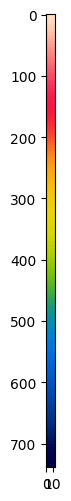

In [3]:
# %matplotlib notebook
figure(num=None, figsize=(8, 6), dpi=100, facecolor='w', edgecolor='k')
plt.imshow(cv2.cvtColor(temperature_scale_img, cv2.COLOR_BGR2RGB))
plt.show()

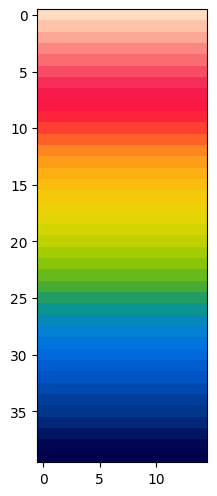

In [4]:
# %matplotlib notebook
figure(num=None, figsize=(8, 6), dpi=100, facecolor='w', edgecolor='k')
plt.imshow(cv2.cvtColor(resized_scale, cv2.COLOR_BGR2RGB))
plt.show()

In [5]:
print(resized_scale[:, 5, 0])
print(resized_scale[:, 5, 1])
print(resized_scale[:, 5, 2])
print(resized_scale[:, 5, :])

[193 170 148 130 114 102  89  76  65  59  48  38  29  23  16  13  10   8
   5   2   0   3   9  27  54 100 147 186 211 222 220 208 195 175 155 140
 122 101  82  75]
[220 195 166 133 107  75  45  27  24  36  62  97 134 157 175 189 201 208
 212 213 210 204 196 185 172 158 147 137 128 115 105  94  84  73  62  54
  39  22   6   2]
[255 255 254 253 251 248 246 247 249 252 253 253 254 254 252 249 243 237
 226 211 189 163 136 104  71  34  12   6   2   0   1   0   0   0   0   0
   0   0   0   0]
[[193 220 255]
 [170 195 255]
 [148 166 254]
 [130 133 253]
 [114 107 251]
 [102  75 248]
 [ 89  45 246]
 [ 76  27 247]
 [ 65  24 249]
 [ 59  36 252]
 [ 48  62 253]
 [ 38  97 253]
 [ 29 134 254]
 [ 23 157 254]
 [ 16 175 252]
 [ 13 189 249]
 [ 10 201 243]
 [  8 208 237]
 [  5 212 226]
 [  2 213 211]
 [  0 210 189]
 [  3 204 163]
 [  9 196 136]
 [ 27 185 104]
 [ 54 172  71]
 [100 158  34]
 [147 147  12]
 [186 137   6]
 [211 128   2]
 [222 115   0]
 [220 105   1]
 [208  94   0]
 [195  84   0]
 [175  73   0

### finding temperature distribution

In [6]:
def temperature_distribution(frame, temperature_scale):
    temperature_array = np.ndarray(frame.shape[:2])
    for row in range(frame.shape[0]):
        for col in range(frame.shape[1]):
            bgr_pixel = frame[row, col, :].astype(int)
            diffence_values = []
            for scale_value in temperature_scale:
                diffence_values.append(np.sum(np.abs(scale_value.astype(int) - bgr_pixel)))
            temperature_array[row, col] = 50 - np.argmin(diffence_values)
    return temperature_array.astype(int)
#     return bin_values

### read, parse xml and corresponding image

In [7]:
# image_name = '/home/ubuntu/gfav/data/phase1/IR_data/IR_frames/LangesBand_Flug2_0415_IR.png'
# xml_file = '/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/LangesBand_Flug2_0415_IR.xml'
# root = ET.parse(xml_file).getroot()
# ir_image = cv2.imread(image_name)

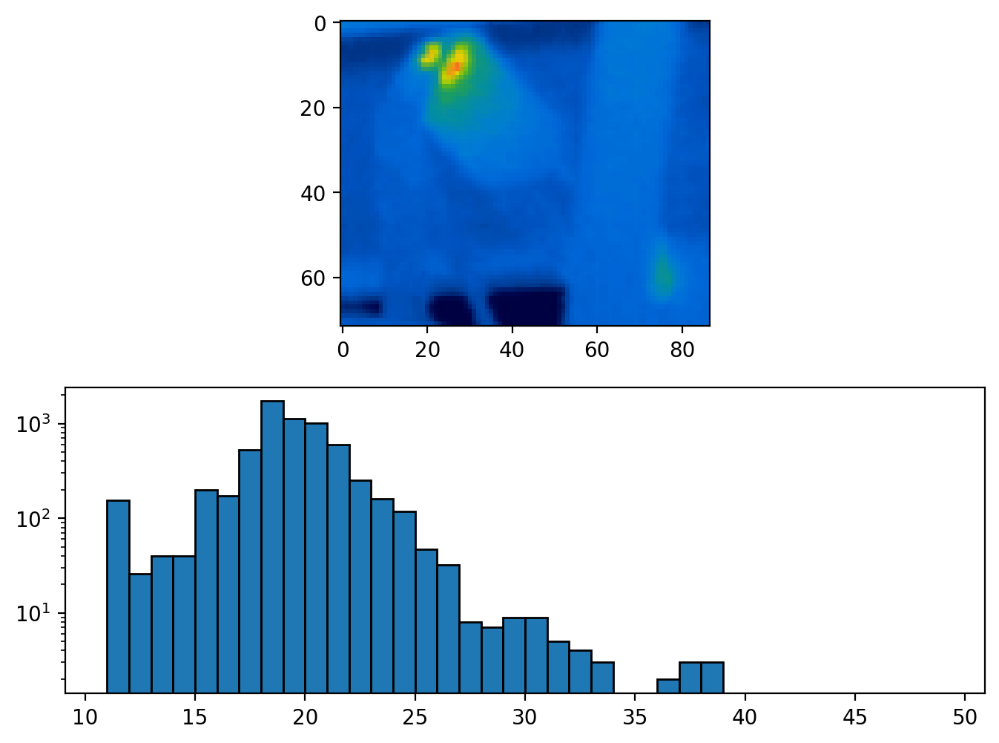

max_temperature: 38
weights: [ 156   26   40   40  198  172  531 1723 1118 1002  599  251  159  117
   47   32    8    7    9    9    5    4    3    0    0    2    3    3
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


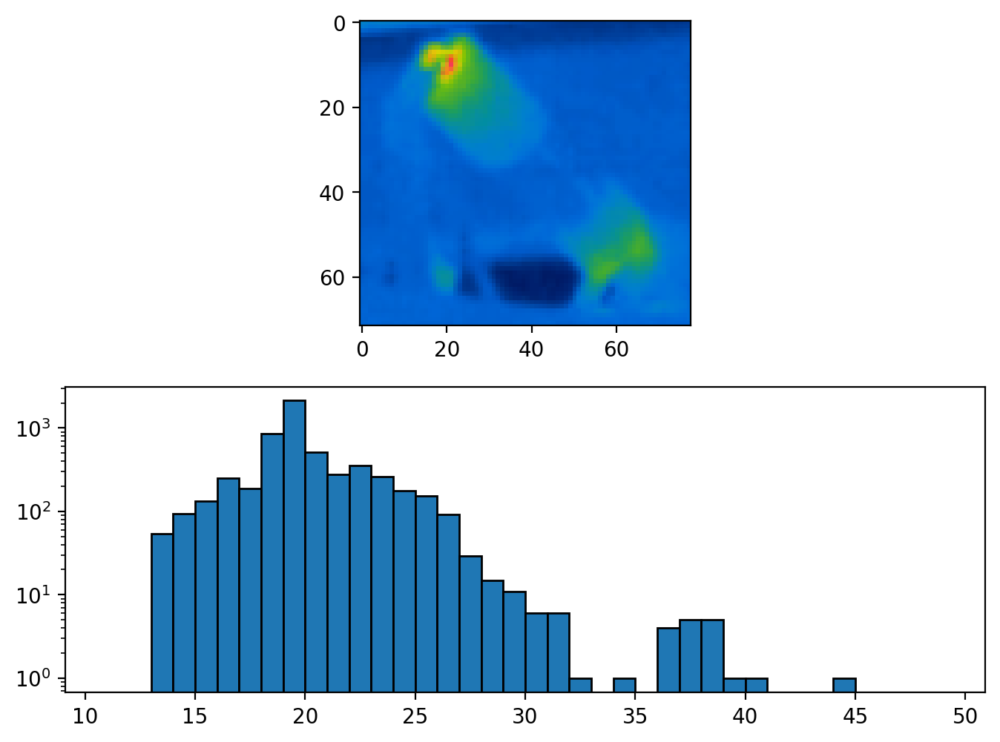

max_temperature: 44
weights: [   0    0   54   93  132  249  189  856 2130  512  278  353  263  178
  152   91   29   15   11    6    6    1    0    1    0    4    5    5
    1    1    0    0    0    1    0    0    0    0]
max_temperature weight: 1


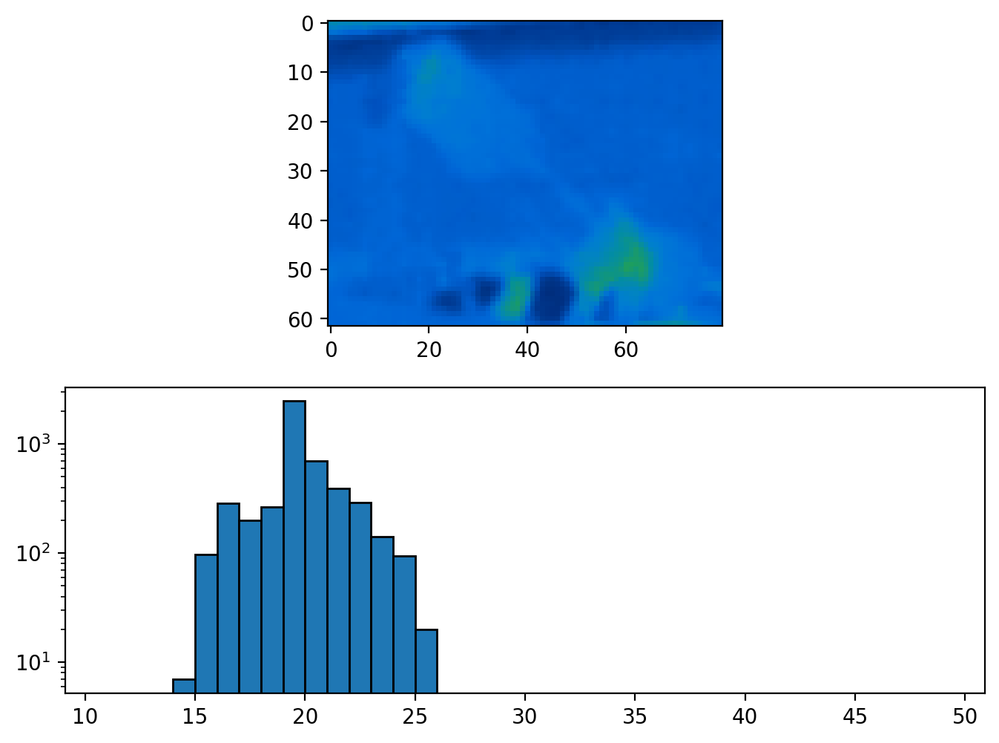

max_temperature: 25
weights: [   0    0    0    7   97  285  200  267 2474  695  390  289  142   94
   20    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 20


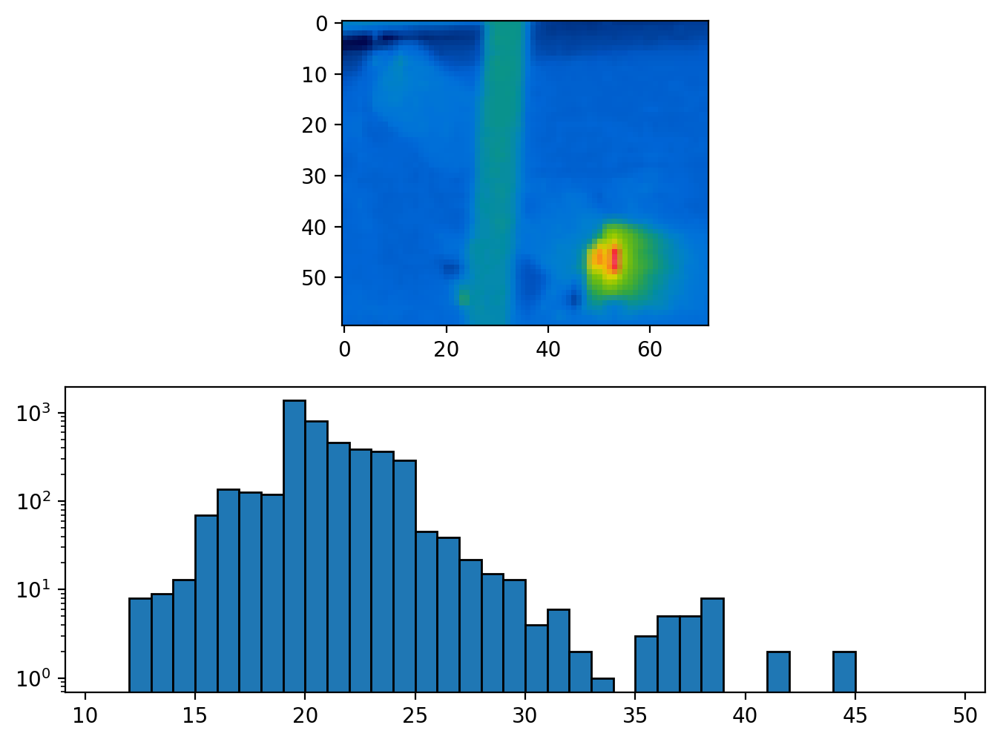

max_temperature: 44
weights: [   0    8    9   13   69  135  127  119 1366  801  463  386  364  288
   45   39   22   15   13    4    6    2    1    0    3    5    5    8
    0    0    2    0    0    2    0    0    0    0]
max_temperature weight: 2


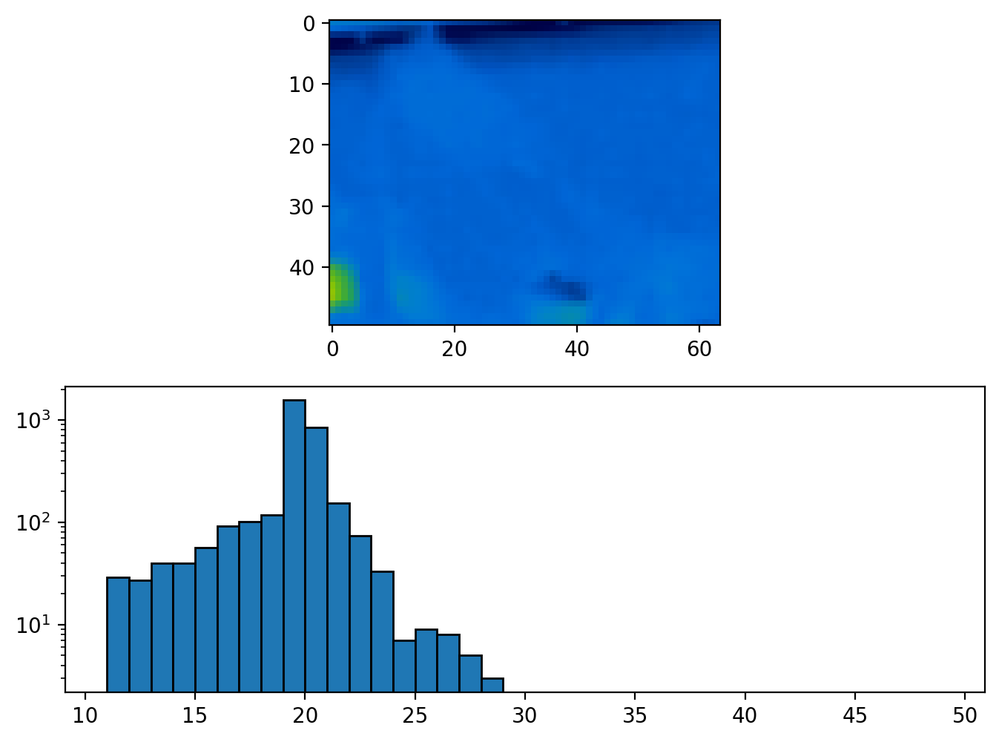

max_temperature: 28
weights: [  29   27   40   40   57   92  102  118 1559  844  153   74   33    7
    9    8    5    3    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


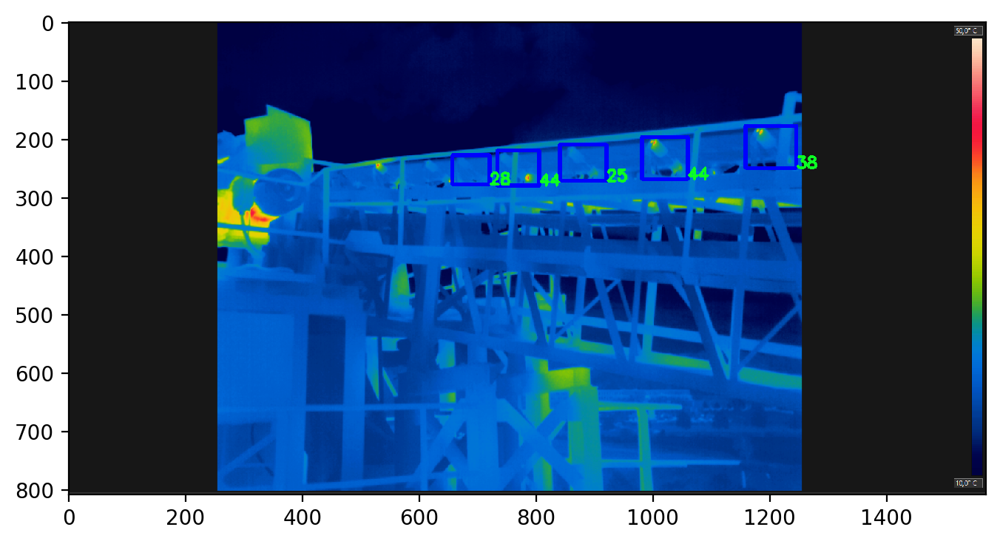

In [8]:
%matplotlib inline
xml_list = os.listdir('/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/')
for xml_file in xml_list:
    root = ET.parse('/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/' + xml_file).getroot()
    ir_image = cv2.imread('/home/ubuntu/gfav/data/phase1/IR_data/IR_frames/' + xml_file[:-3] + 'png')
    label_image = ir_image.copy()
    some_objects = root.findall('object')
    for bbox in some_objects:
        xmin = int(bbox[4][0].text)
        ymin = int(bbox[4][1].text)
        xmax = int(bbox[4][2].text)
        ymax = int(bbox[4][3].text)
        image_crop = ir_image[ymin:ymax, xmin:xmax, :].copy()
        cv2.rectangle(label_image, (xmin, ymin), (xmax, ymax),(255,0,0),5)
        temperature_array = temperature_distribution(image_crop, resized_scale[:, 5, :])
        max_temperature = np.max(temperature_array)
        (weights, bin_values) = np.histogram(temperature_array, bins=range(11,50))
        cv2.putText(label_image, str(max_temperature), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 4)
        figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
        plt.subplot(2,1,1)
        plt.imshow(cv2.cvtColor(image_crop, cv2.COLOR_BGR2RGB))
        plt.subplot(2,1,2)
        plt.hist(temperature_array.flatten(), bins=bin_values, edgecolor='black', log=True)
        plt.show()
        print('max_temperature:', max_temperature)
        print('weights:', weights)
        print('max_temperature weight:', weights[max_temperature - 11])
#         break
    figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
    plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
    plt.show
    break

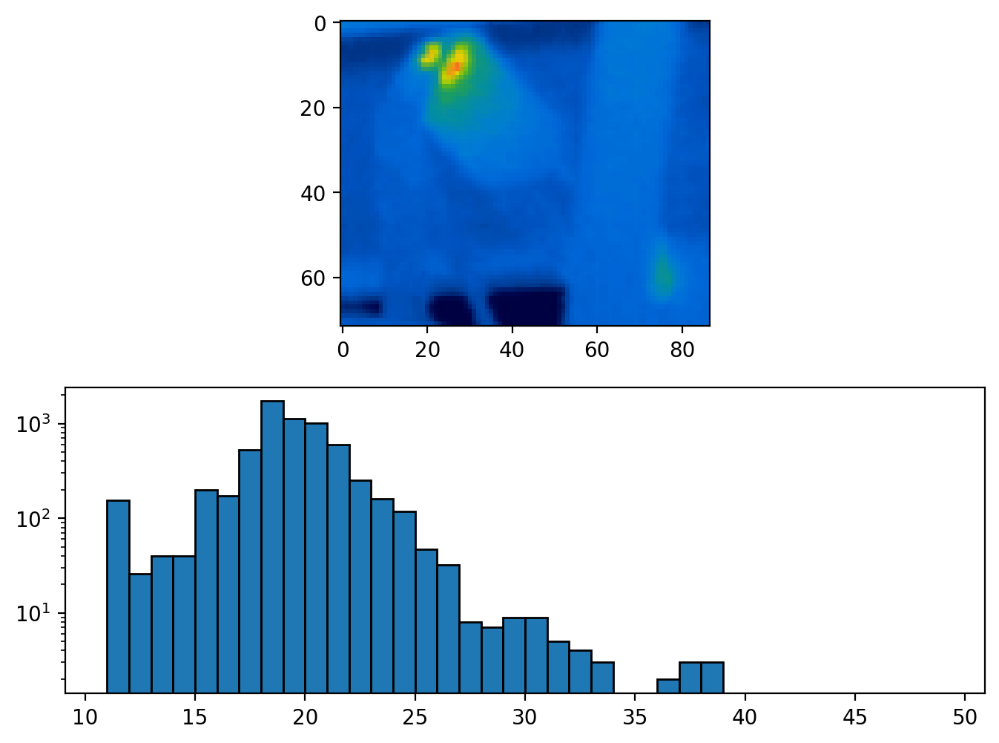

max_temperature: 38
weights: [ 156   26   40   40  198  172  531 1723 1118 1002  599  251  159  117
   47   32    8    7    9    9    5    4    3    0    0    2    3    3
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


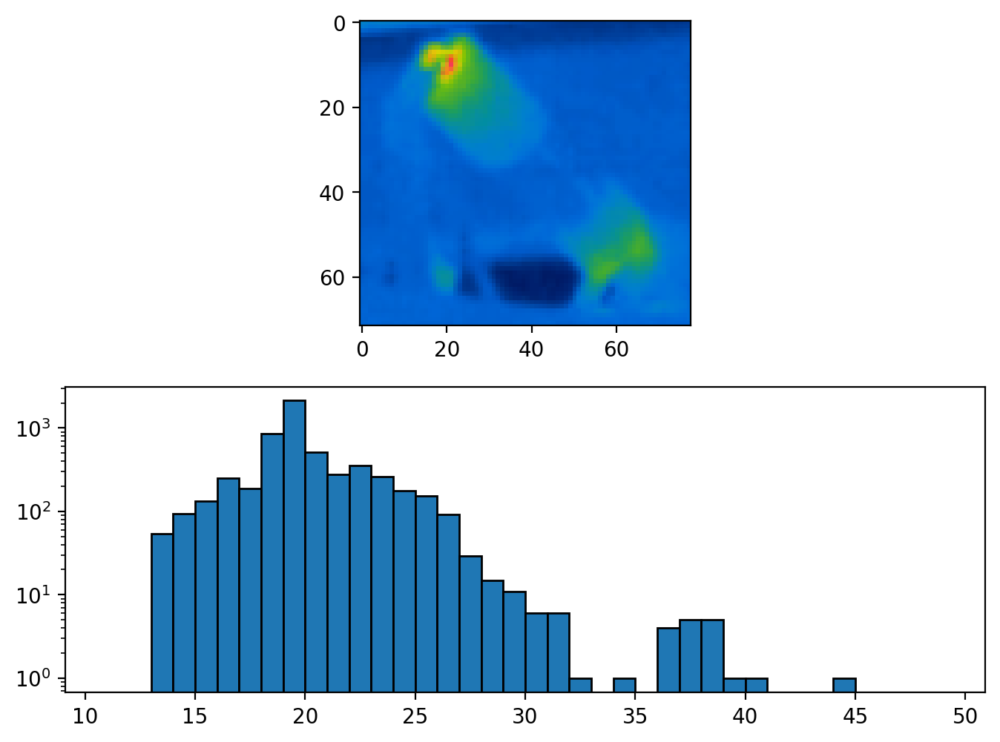

max_temperature: 44
weights: [   0    0   54   93  132  249  189  856 2130  512  278  353  263  178
  152   91   29   15   11    6    6    1    0    1    0    4    5    5
    1    1    0    0    0    1    0    0    0    0]
max_temperature weight: 1


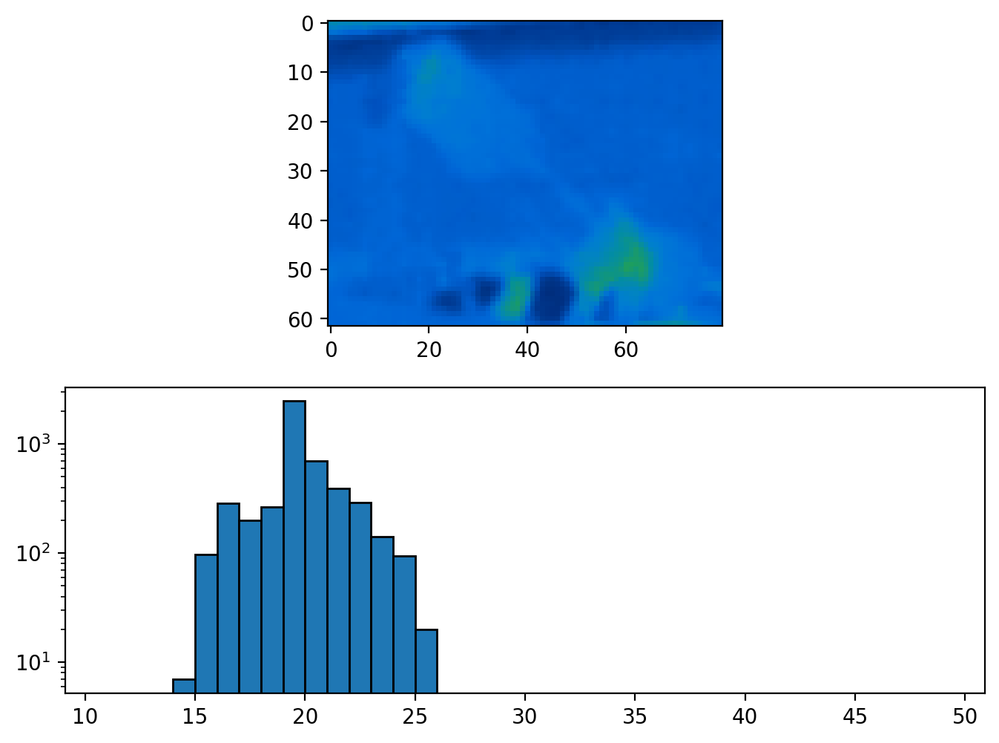

max_temperature: 25
weights: [   0    0    0    7   97  285  200  267 2474  695  390  289  142   94
   20    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 20


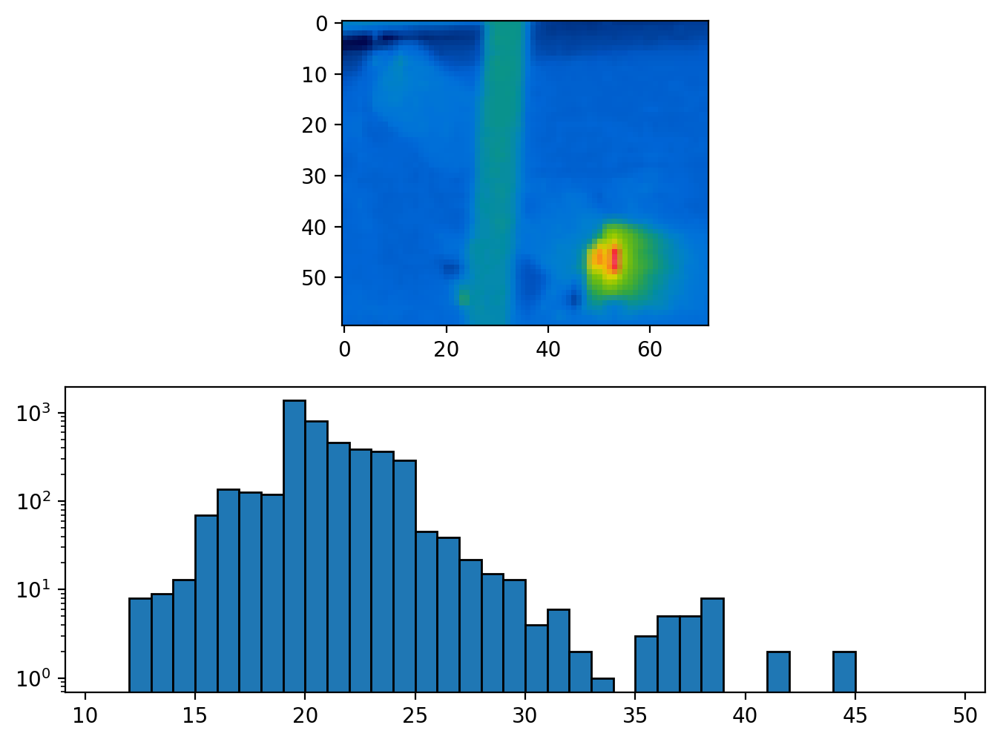

max_temperature: 44
weights: [   0    8    9   13   69  135  127  119 1366  801  463  386  364  288
   45   39   22   15   13    4    6    2    1    0    3    5    5    8
    0    0    2    0    0    2    0    0    0    0]
max_temperature weight: 2


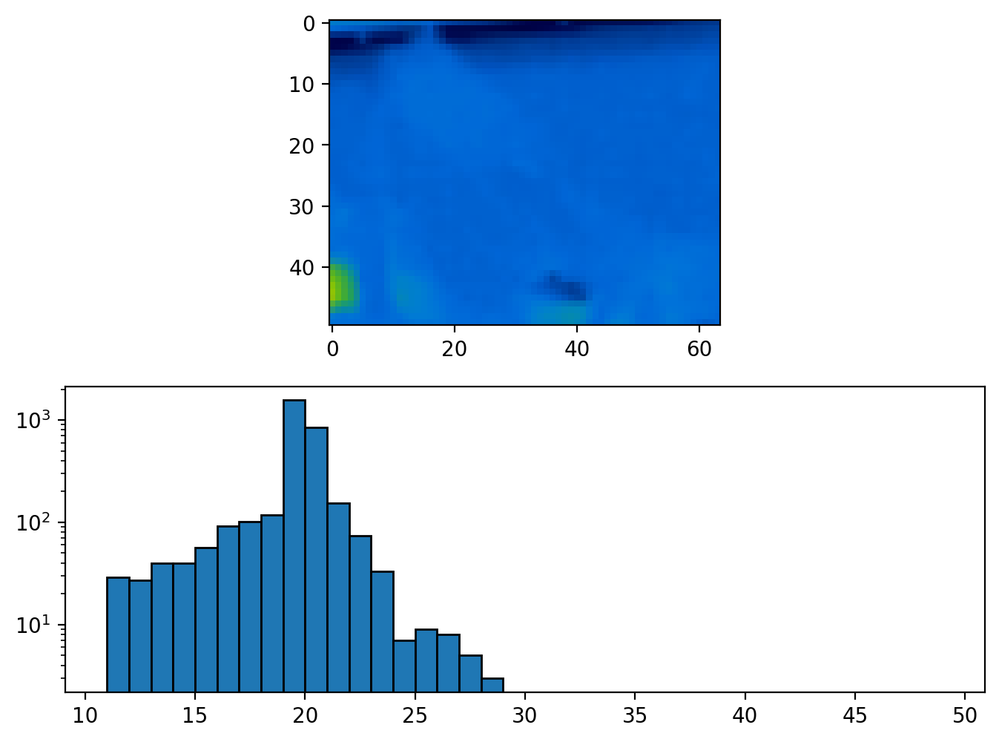

max_temperature: 28
weights: [  29   27   40   40   57   92  102  118 1559  844  153   74   33    7
    9    8    5    3    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


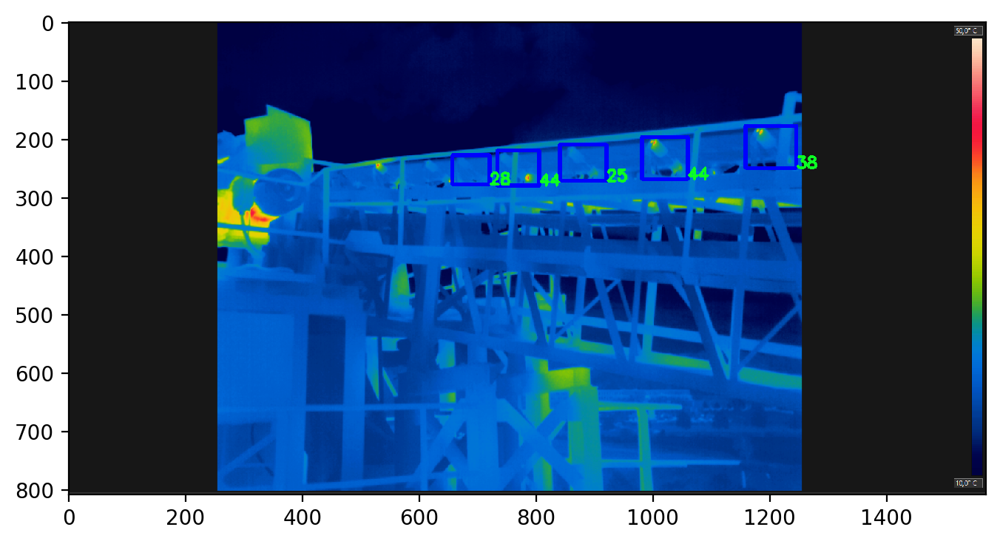

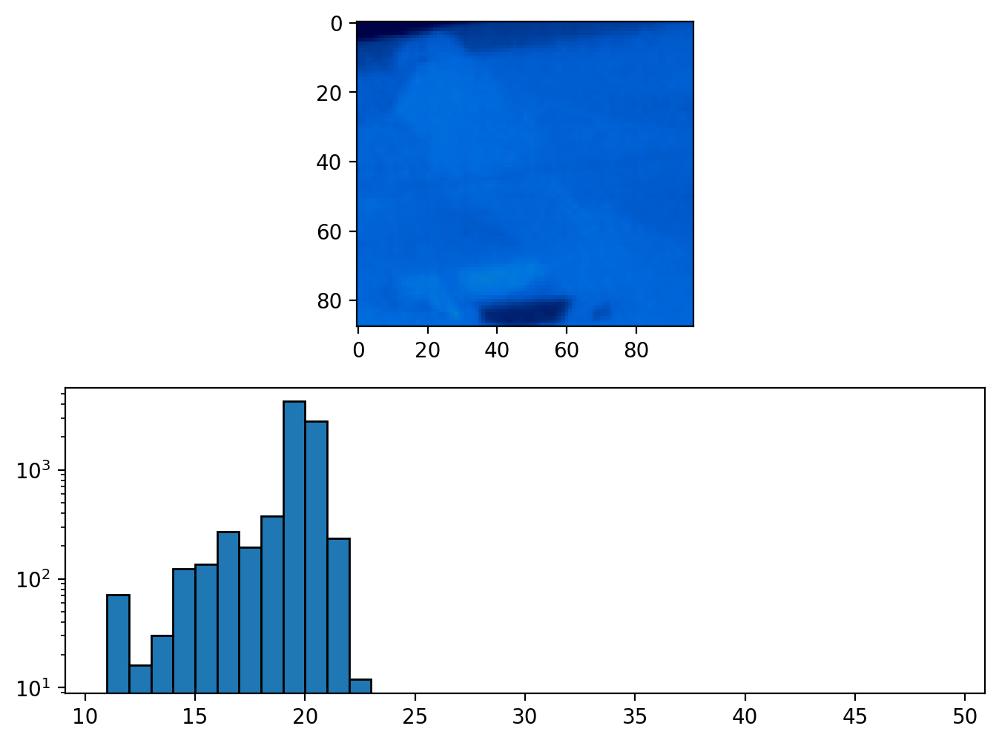

max_temperature: 22
weights: [  72   16   30  123  135  271  195  376 4247 2822  237   12    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 12


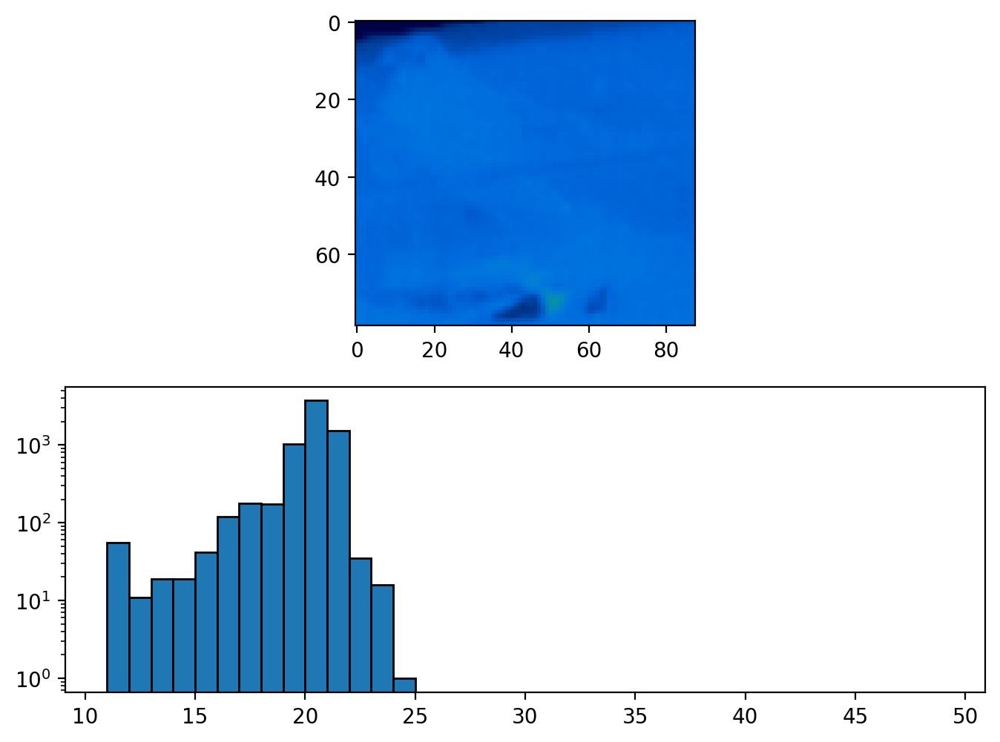

max_temperature: 24
weights: [  56   11   19   19   42  119  178  173 1029 3724 1530   35   16    1
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1


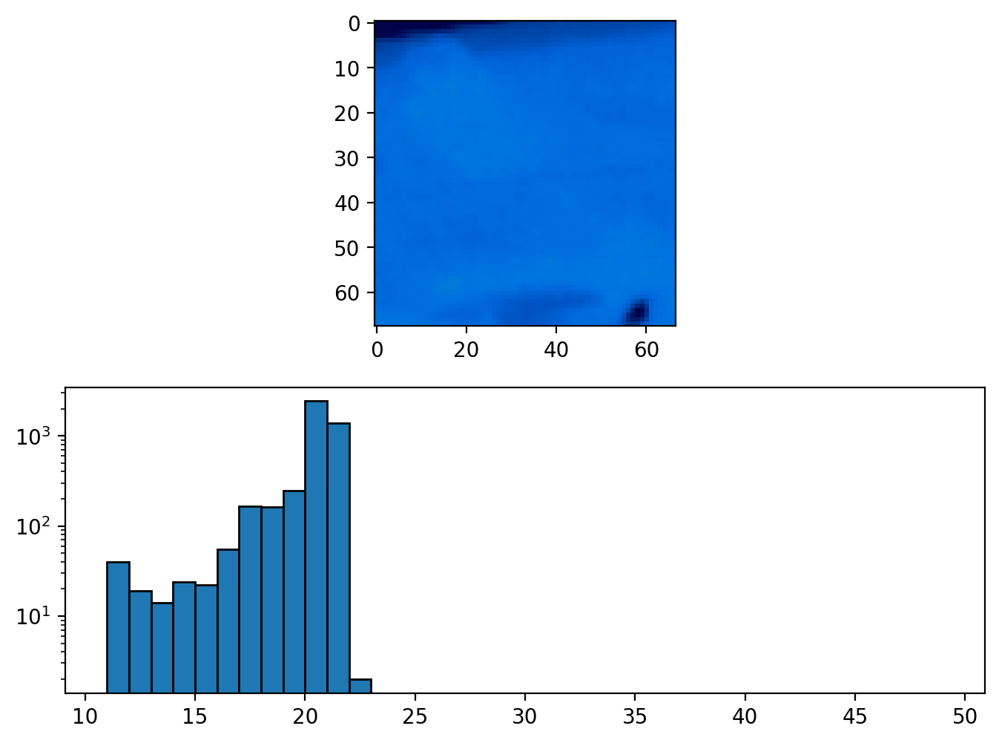

max_temperature: 22
weights: [  40   19   14   24   22   55  164  161  248 2426 1381    2    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


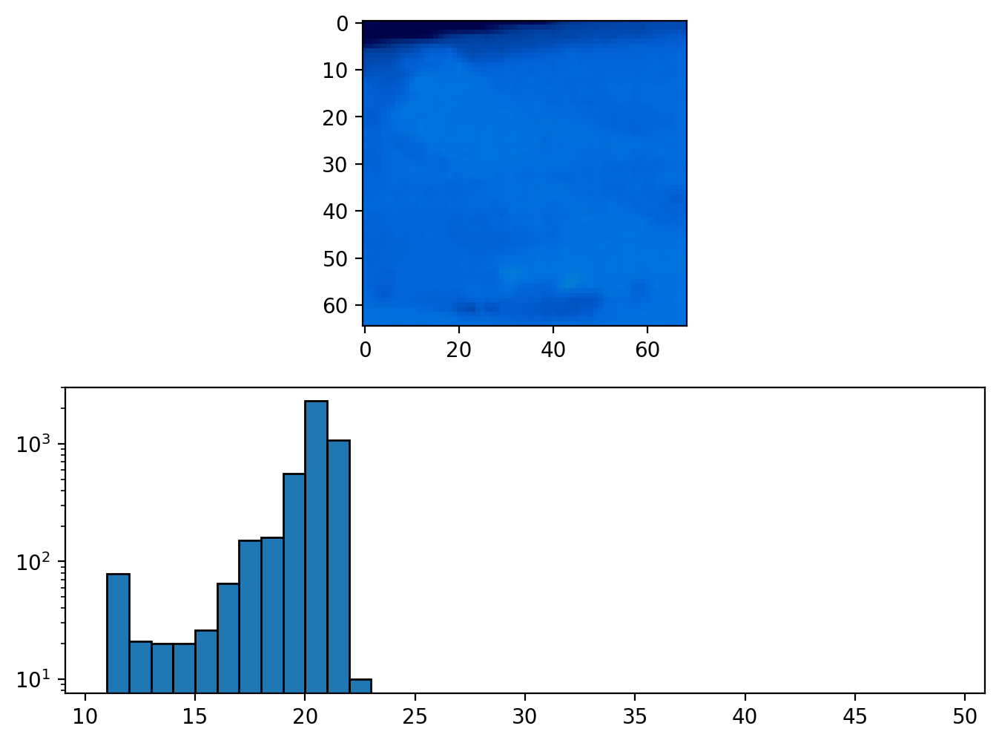

max_temperature: 22
weights: [  79   21   20   20   26   65  151  160  559 2306 1068   10    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 10


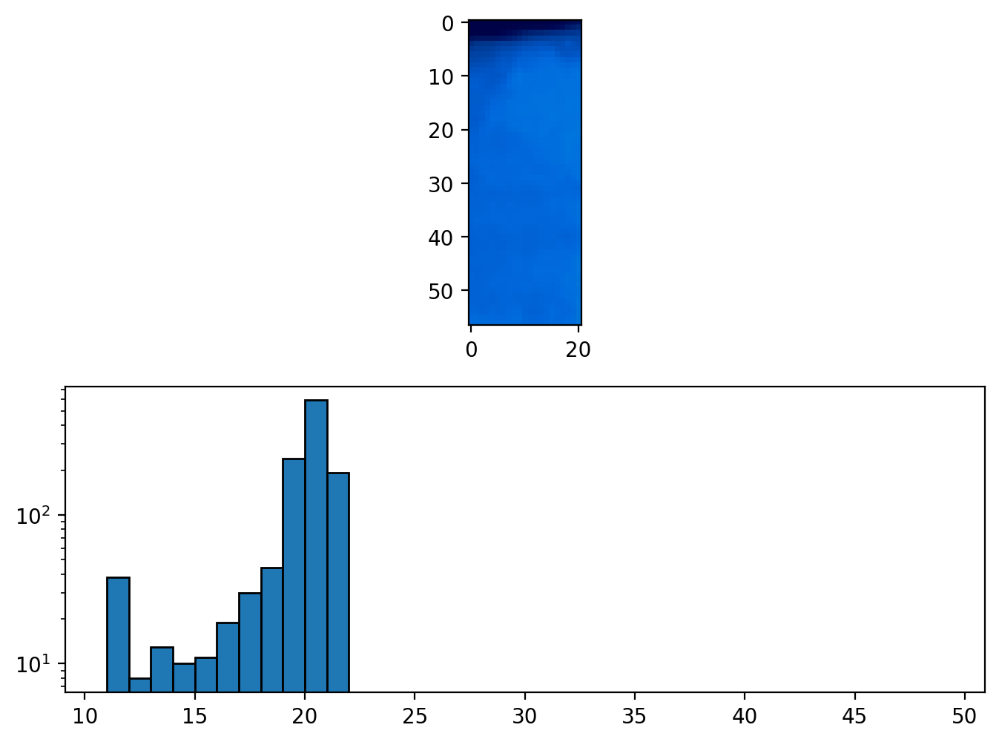

max_temperature: 21
weights: [ 38   8  13  10  11  19  30  44 241 591 192   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 192


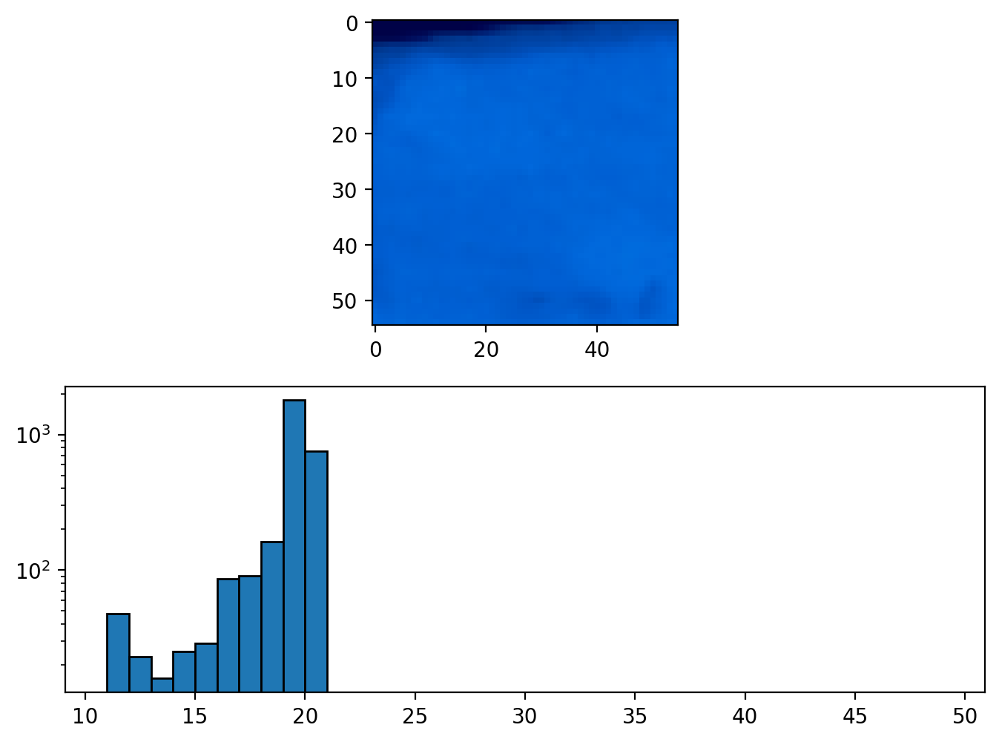

max_temperature: 20
weights: [  48   23   16   25   29   86   91  162 1788  757    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 757


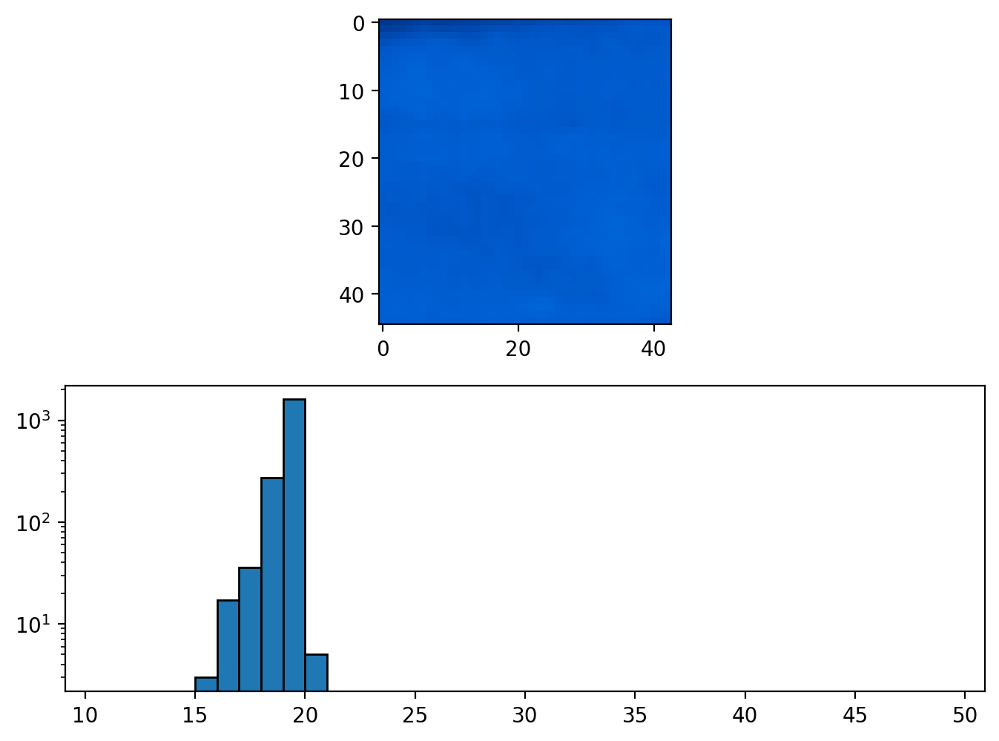

max_temperature: 20
weights: [   0    0    0    0    3   17   36  271 1603    5    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 5


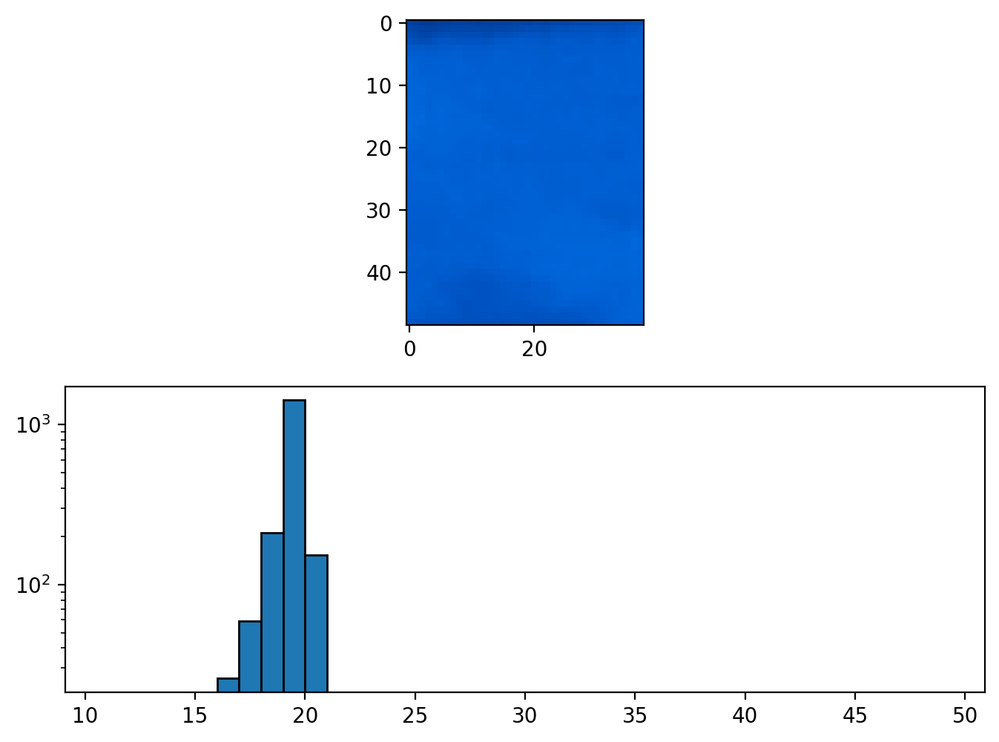

max_temperature: 20
weights: [   0    0    0    0    0   26   59  210 1414  153    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 153


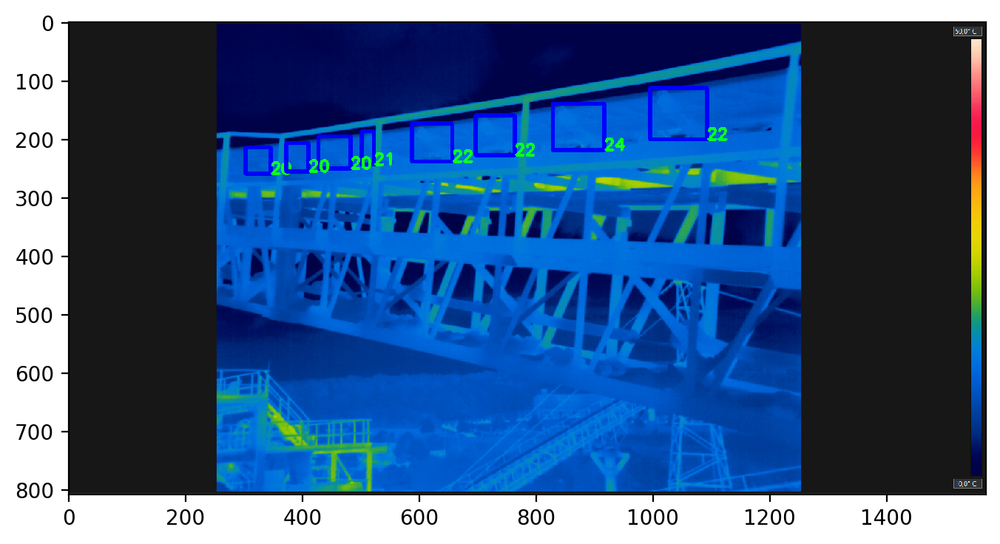

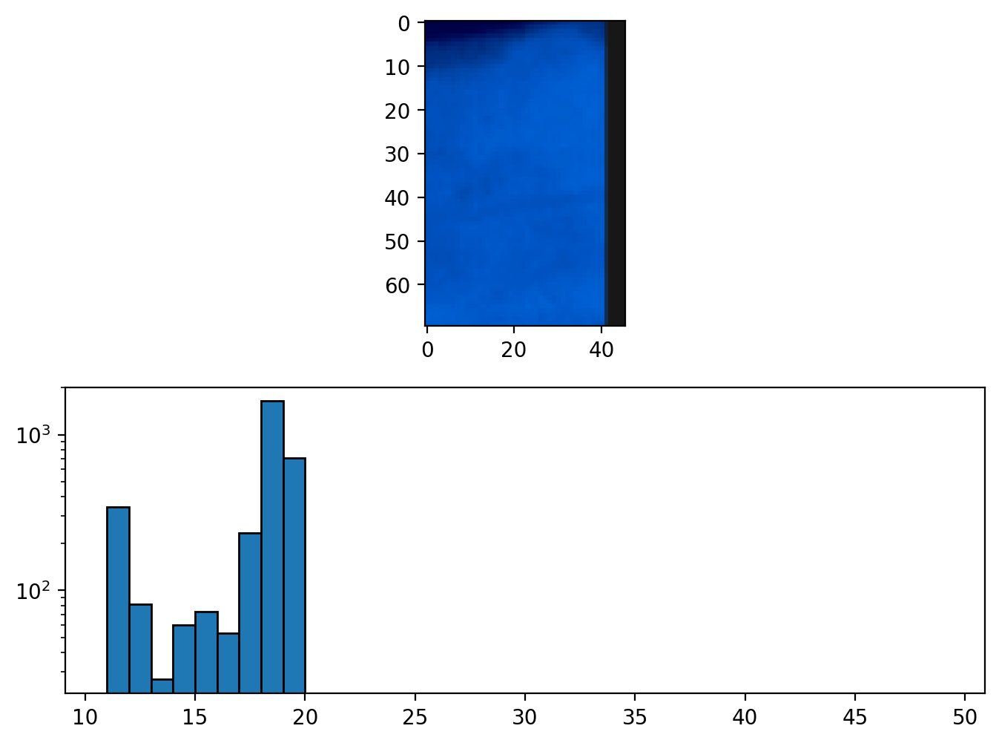

max_temperature: 19
weights: [ 343   82   27   60   73   53  235 1639  708    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 708


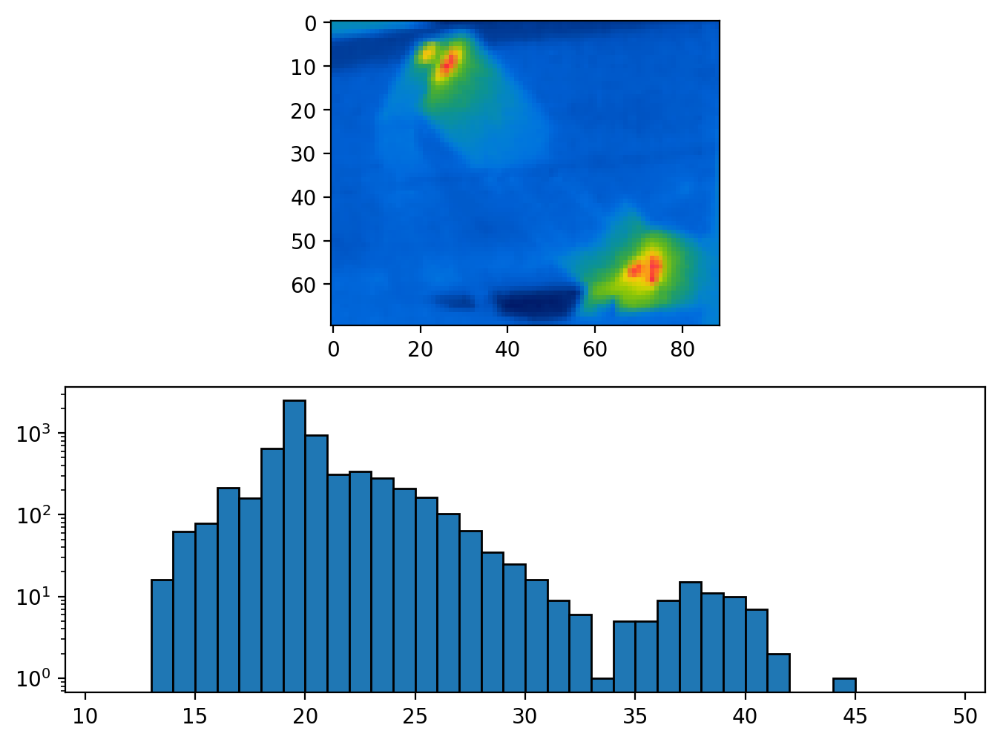

max_temperature: 44
weights: [   0    0   16   63   79  214  161  641 2492  938  309  340  282  208
  162  104   64   35   25   16    9    6    1    5    5    9   15   11
   10    7    2    0    0    1    0    0    0    0]
max_temperature weight: 1


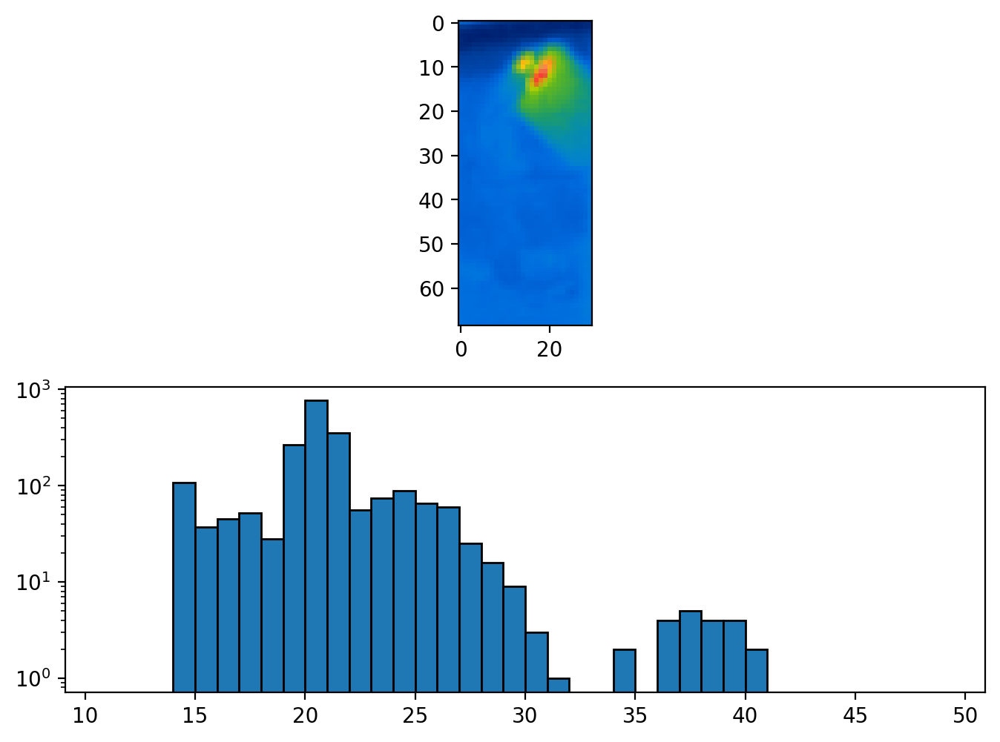

max_temperature: 40
weights: [  0   0   0 107  37  45  52  28 265 765 353  56  74  88  65  60  25  16
   9   3   1   0   0   2   0   4   5   4   4   2   0   0   0   0   0   0
   0   0]
max_temperature weight: 2


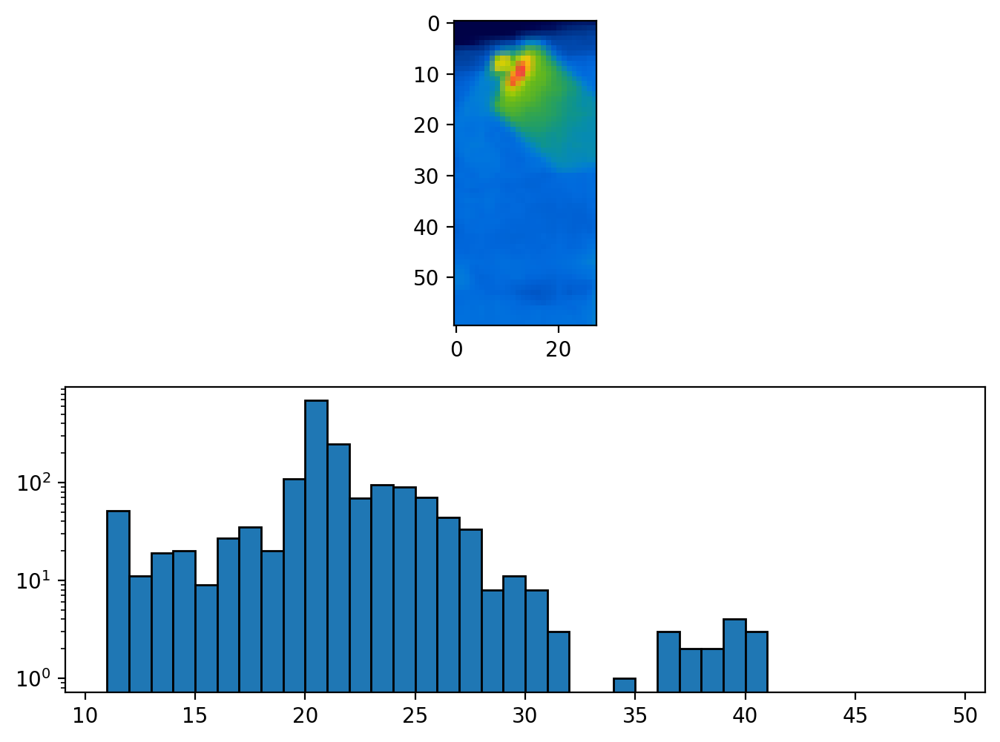

max_temperature: 40
weights: [ 51  11  19  20   9  27  35  20 108 687 248  69  94  90  70  44  33   8
  11   8   3   0   0   1   0   3   2   2   4   3   0   0   0   0   0   0
   0   0]
max_temperature weight: 3


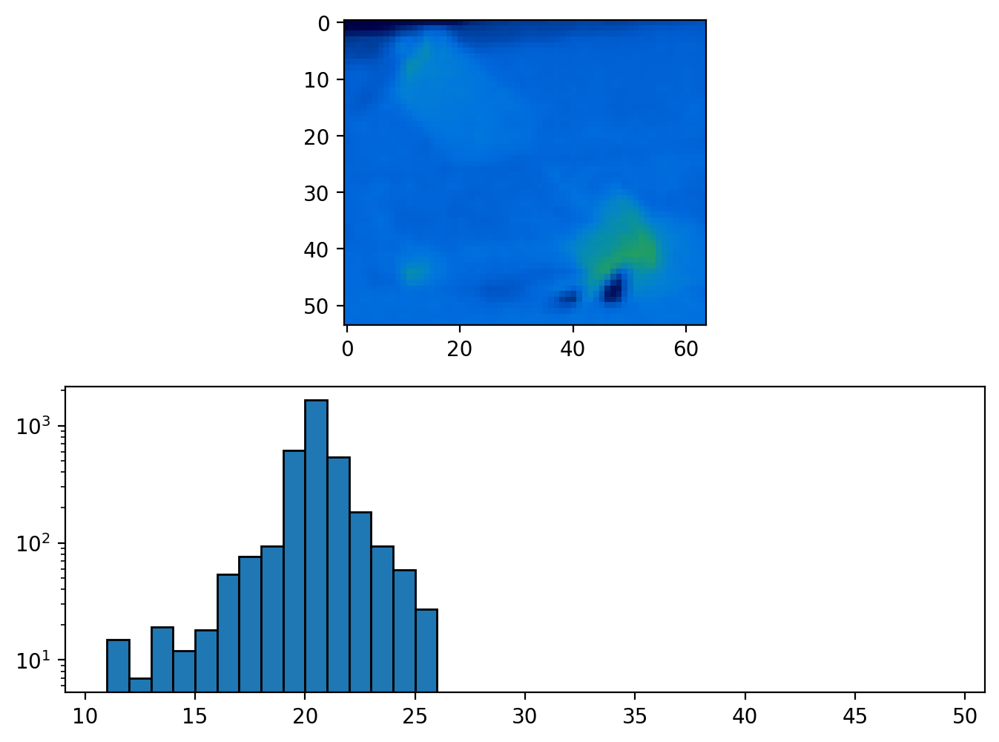

max_temperature: 25
weights: [  15    7   19   12   18   54   76   93  611 1646  541  184   94   59
   27    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 27


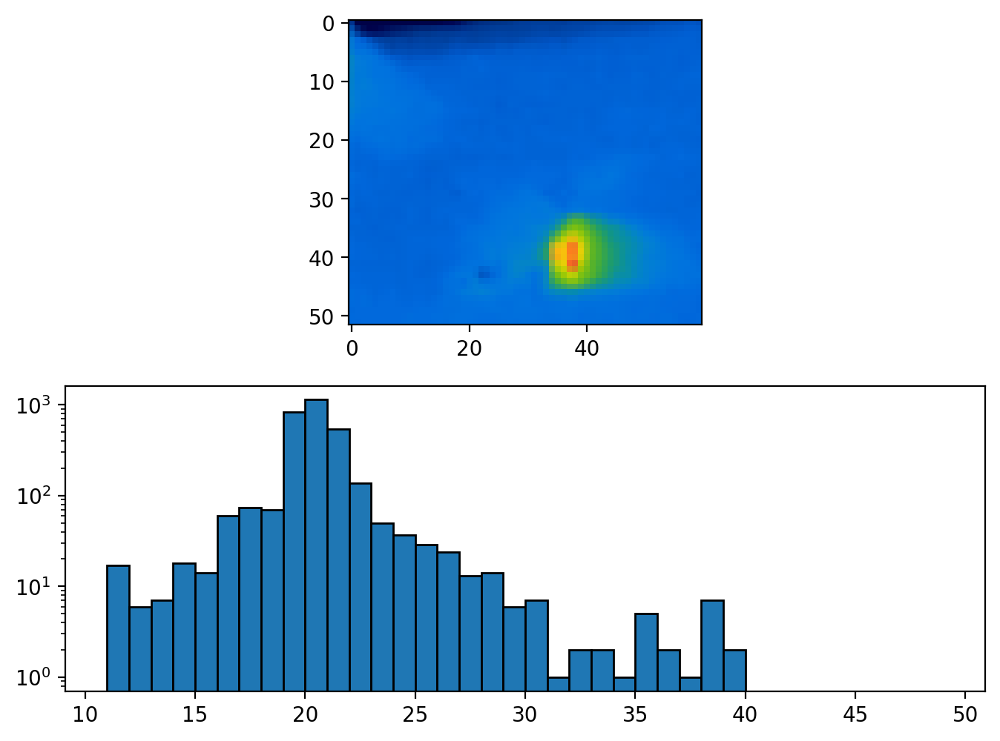

max_temperature: 39
weights: [  17    6    7   18   14   60   74   70  833 1140  540  138   50   37
   29   24   13   14    6    7    1    2    2    1    5    2    1    7
    2    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


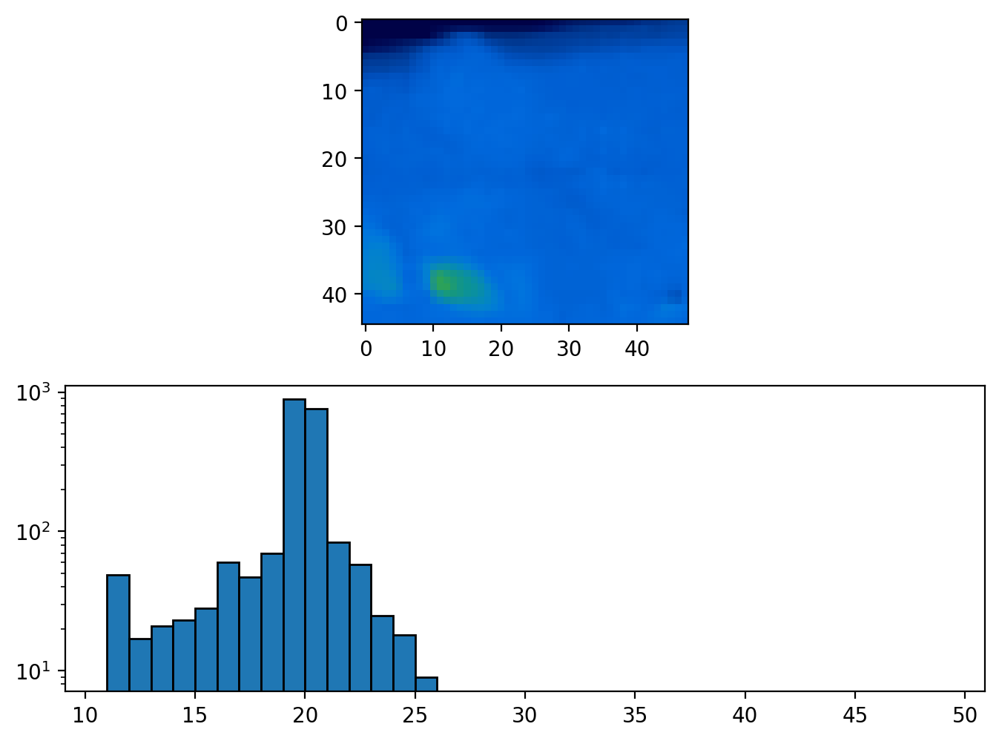

max_temperature: 25
weights: [ 49  17  21  23  28  60  47  70 887 764  84  58  25  18   9   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 9


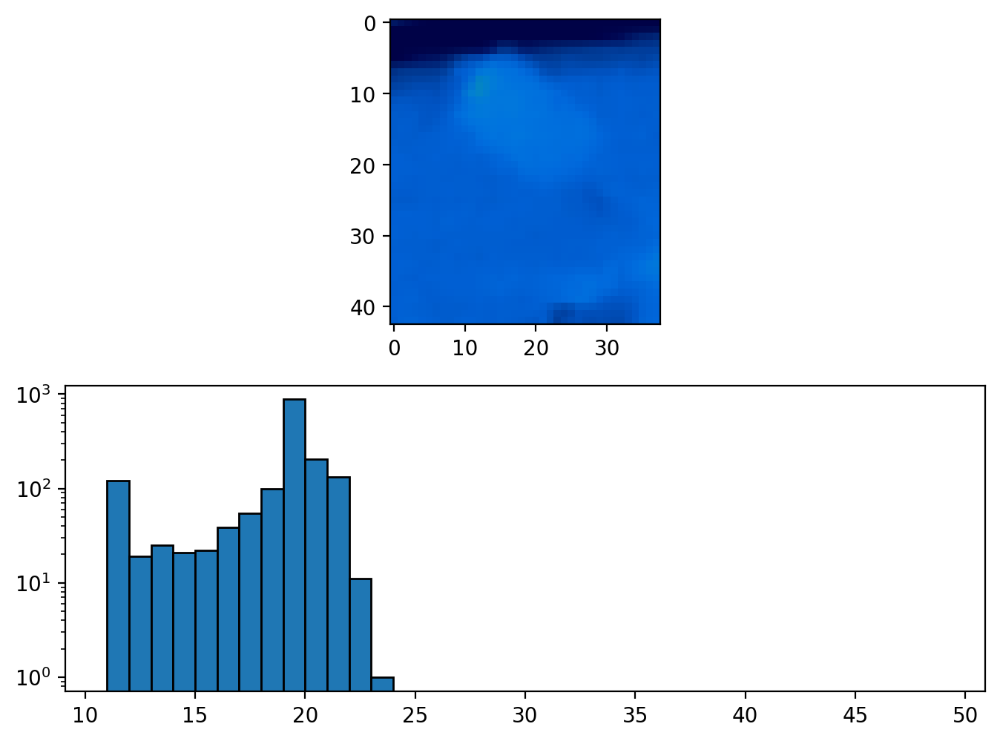

max_temperature: 23
weights: [122  19  25  21  22  39  55  99 881 206 133  11   1   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


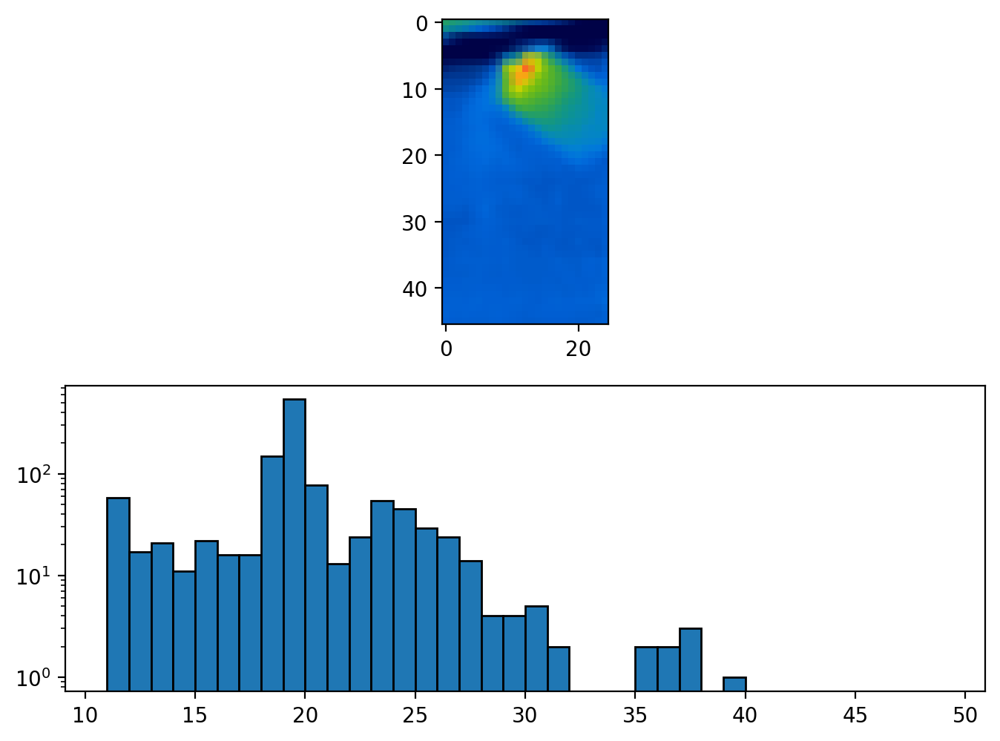

max_temperature: 39
weights: [ 58  17  21  11  22  16  16 148 538  77  13  24  54  45  29  24  14   4
   4   5   2   0   0   0   2   2   3   0   1   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


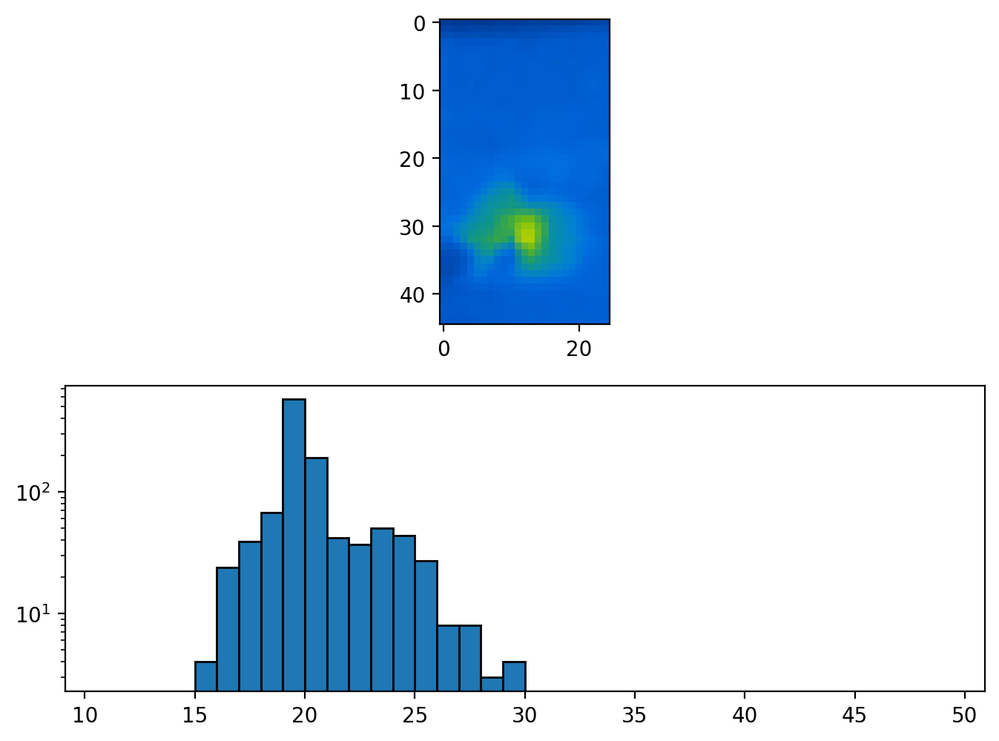

max_temperature: 29
weights: [  0   0   0   0   4  24  39  68 575 192  42  37  50  44  27   8   8   3
   4   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 4


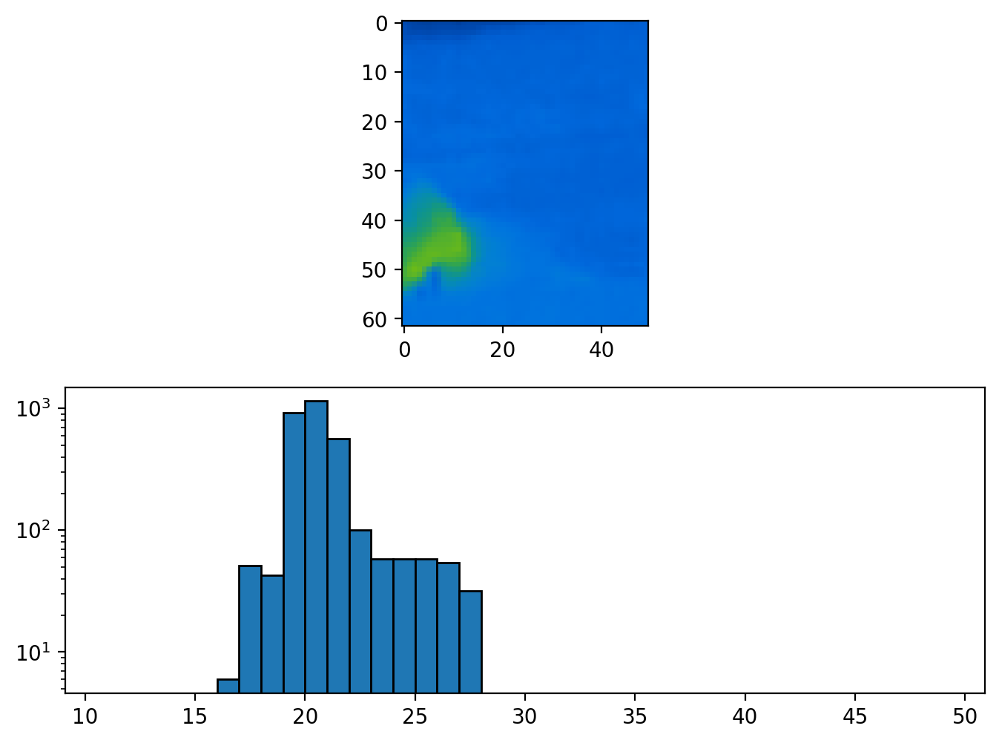

max_temperature: 27
weights: [   0    0    0    0    0    6   51   43  924 1149  567  100   58   58
   58   54   32    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 32


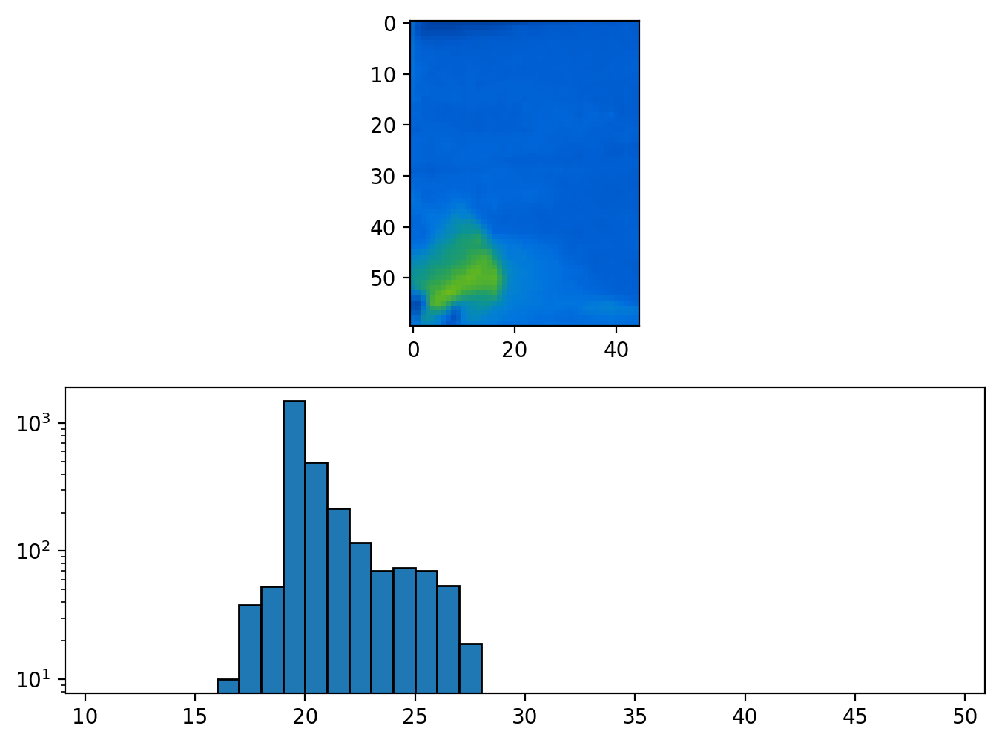

max_temperature: 27
weights: [   0    0    0    0    0   10   38   53 1487  491  217  117   70   74
   70   54   19    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 19


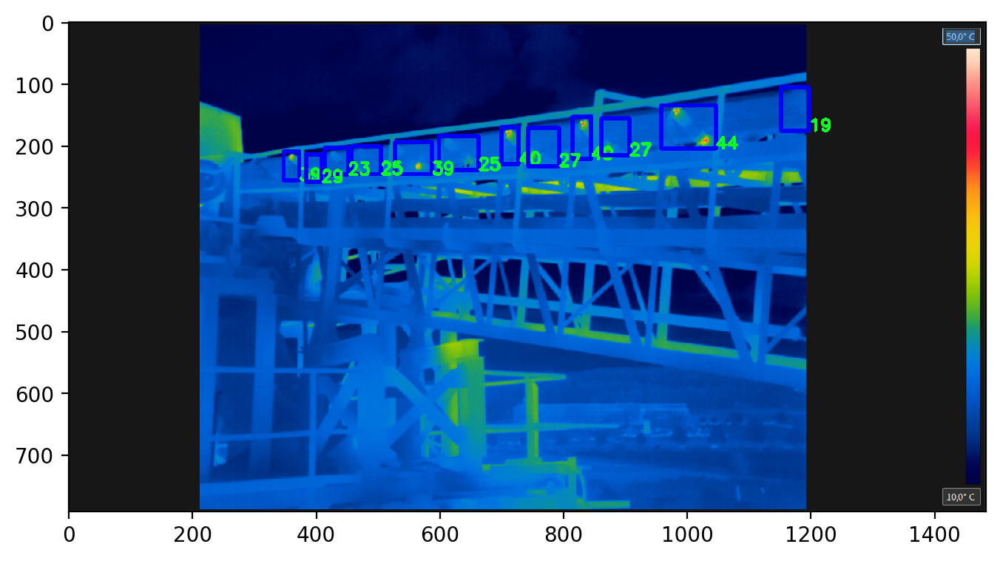

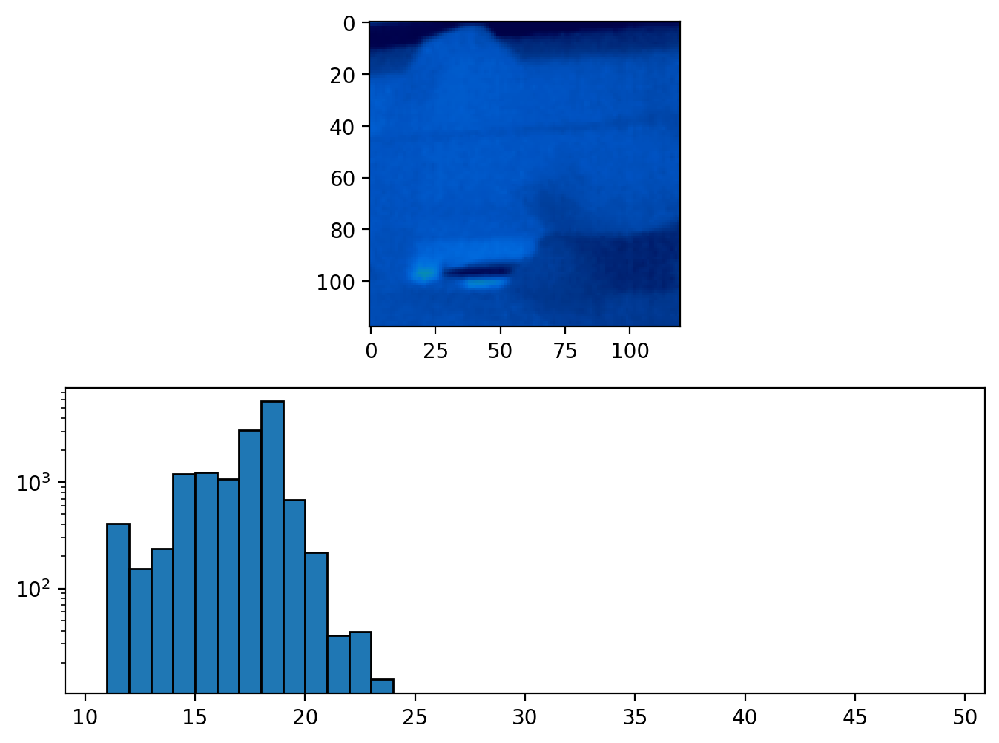

max_temperature: 23
weights: [ 406  153  235 1196 1233 1075 3108 5758  688  219   36   39   14    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 14


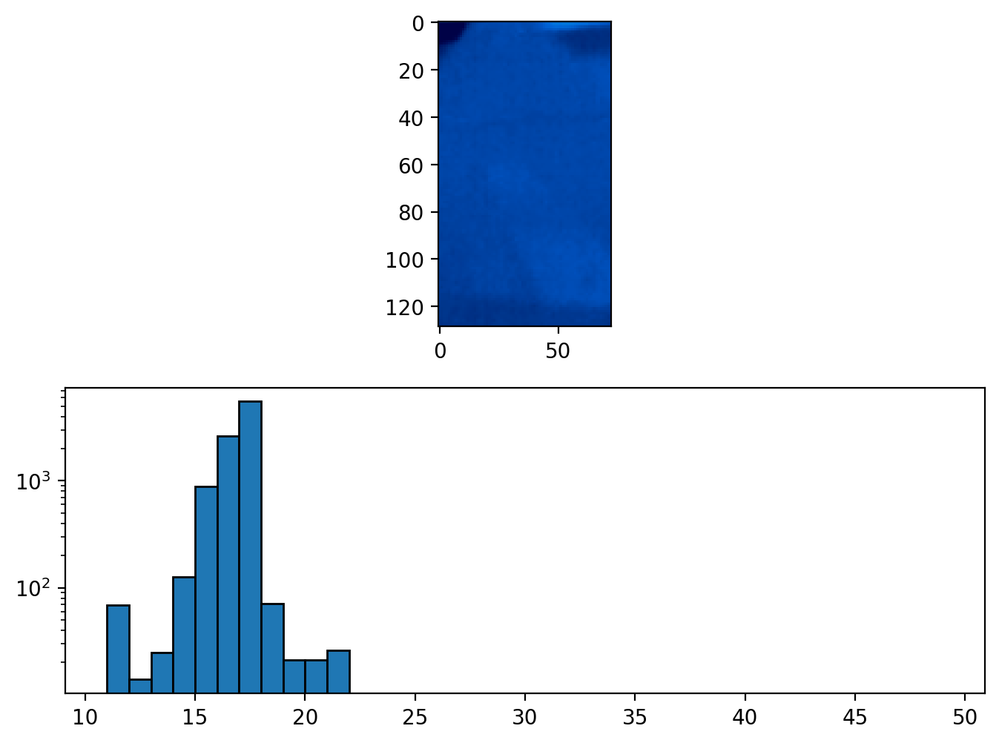

max_temperature: 21
weights: [  69   14   25  127  889 2636 5518   71   21   21   26    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 26


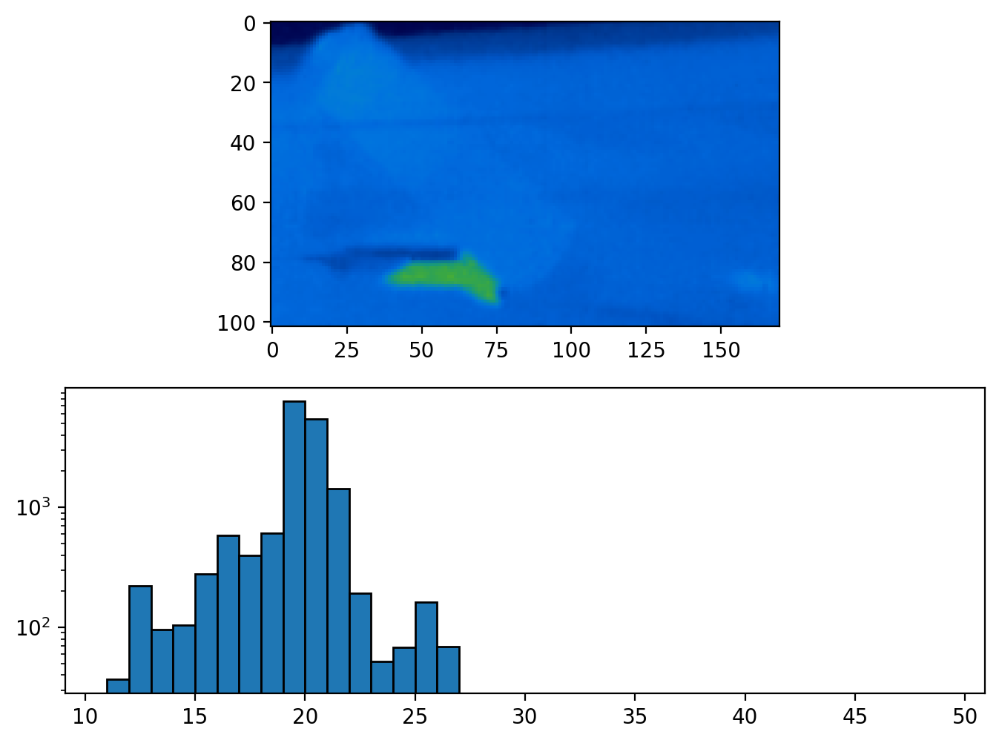

max_temperature: 26
weights: [  37  222   96  104  277  585  400  606 7612 5422 1434  193   52   68
  163   69    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 69


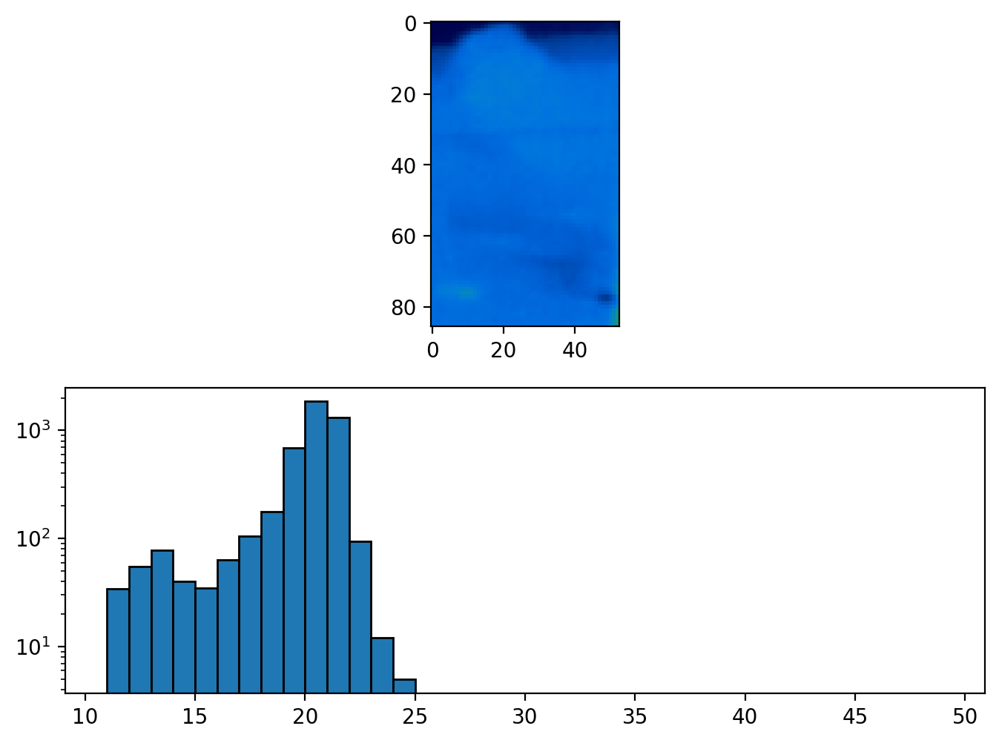

max_temperature: 24
weights: [  34   55   78   40   35   63  106  178  694 1852 1312   94   12    5
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 5


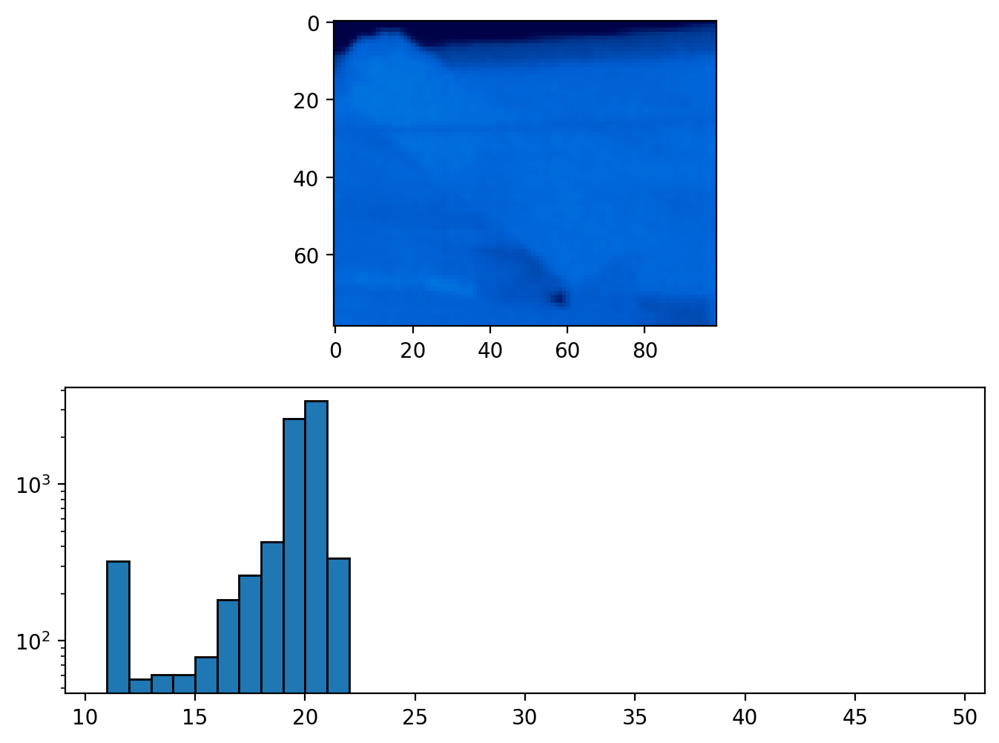

max_temperature: 21
weights: [ 324   57   61   61   79  183  262  431 2627 3398  338    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 338


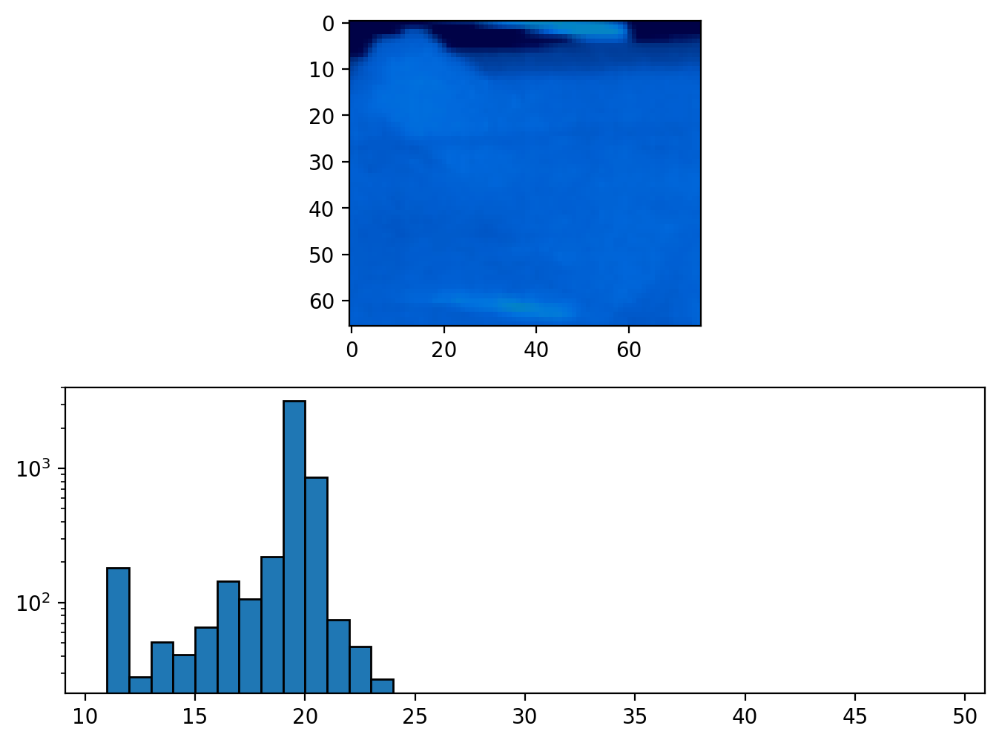

max_temperature: 23
weights: [ 182   28   51   41   66  145  107  220 3165  862   75   47   27    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 27


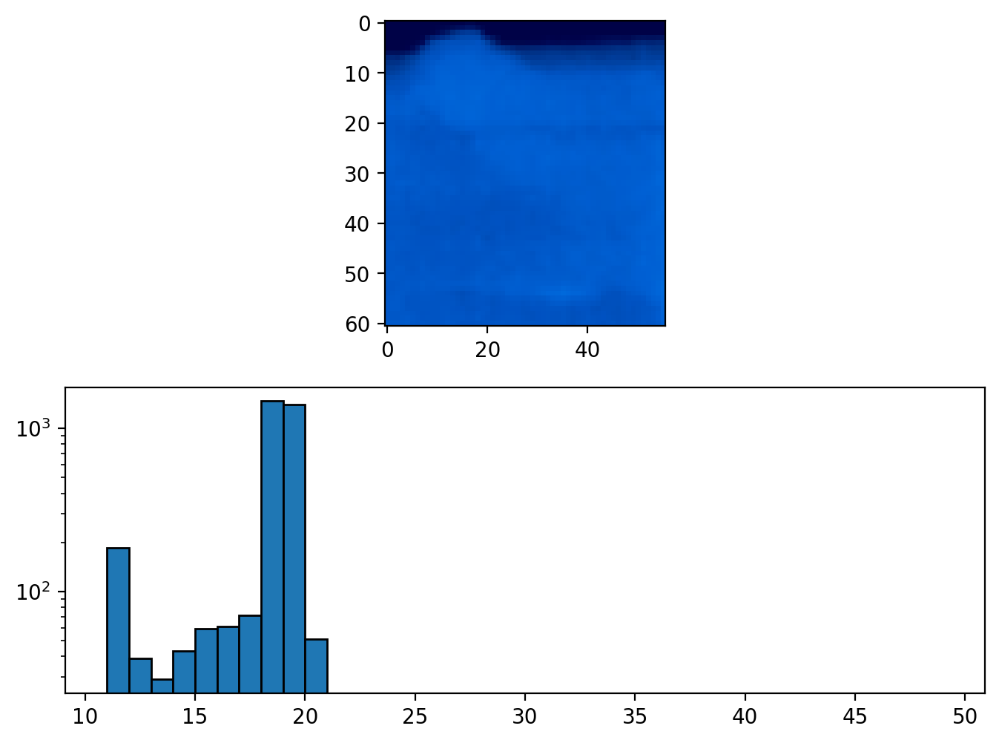

max_temperature: 20
weights: [ 186   39   29   43   59   61   71 1470 1407   51    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 51


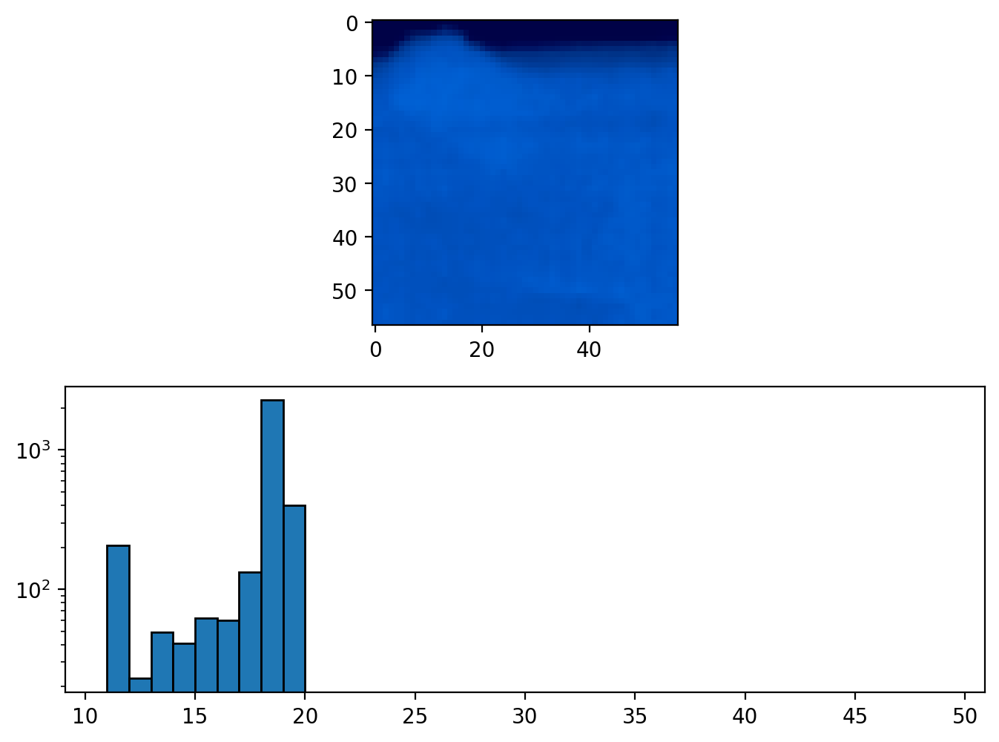

max_temperature: 19
weights: [ 207   23   49   41   62   60  132 2274  401    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 401


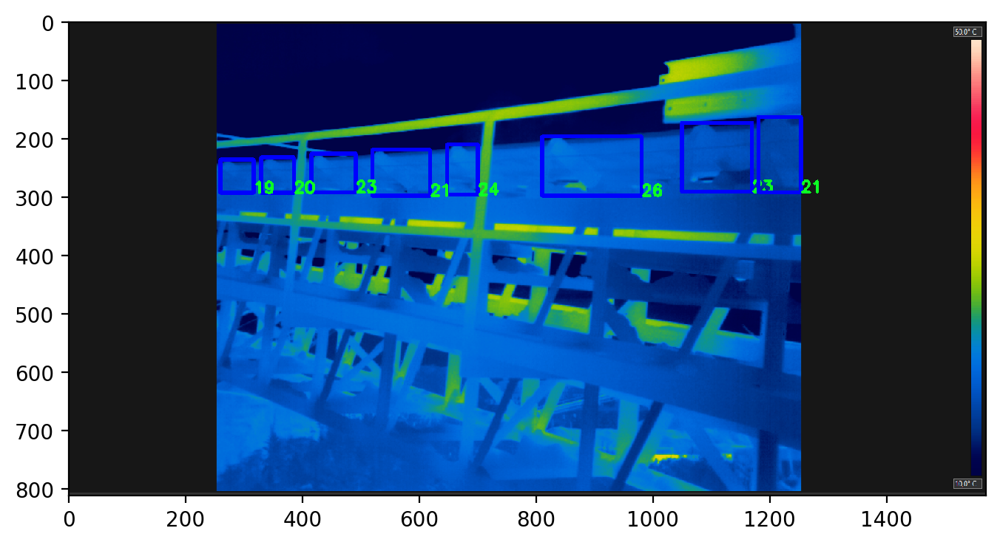

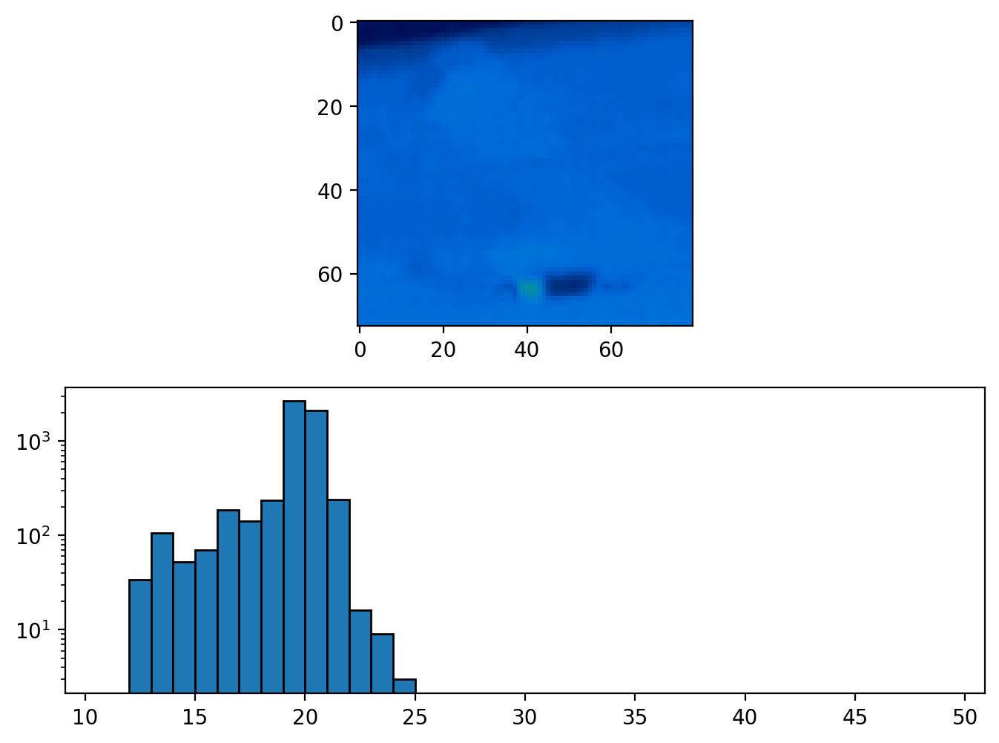

max_temperature: 24
weights: [   0   34  107   52   70  186  141  237 2647 2098  240   16    9    3
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


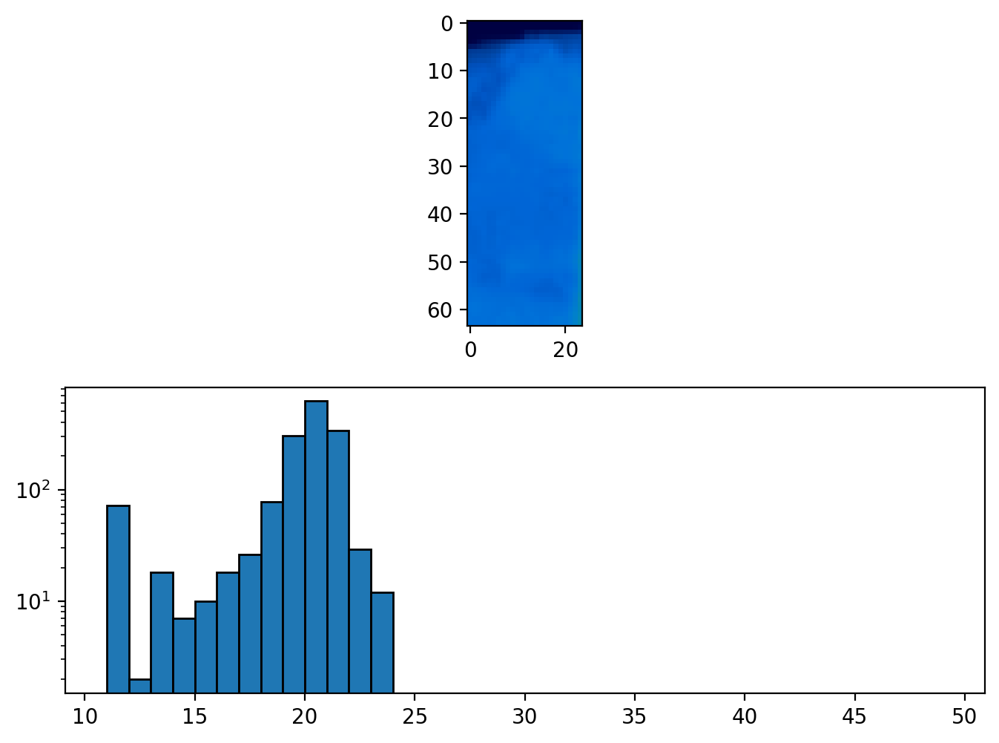

max_temperature: 23
weights: [ 72   2  18   7  10  18  26  78 305 620 339  29  12   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 12


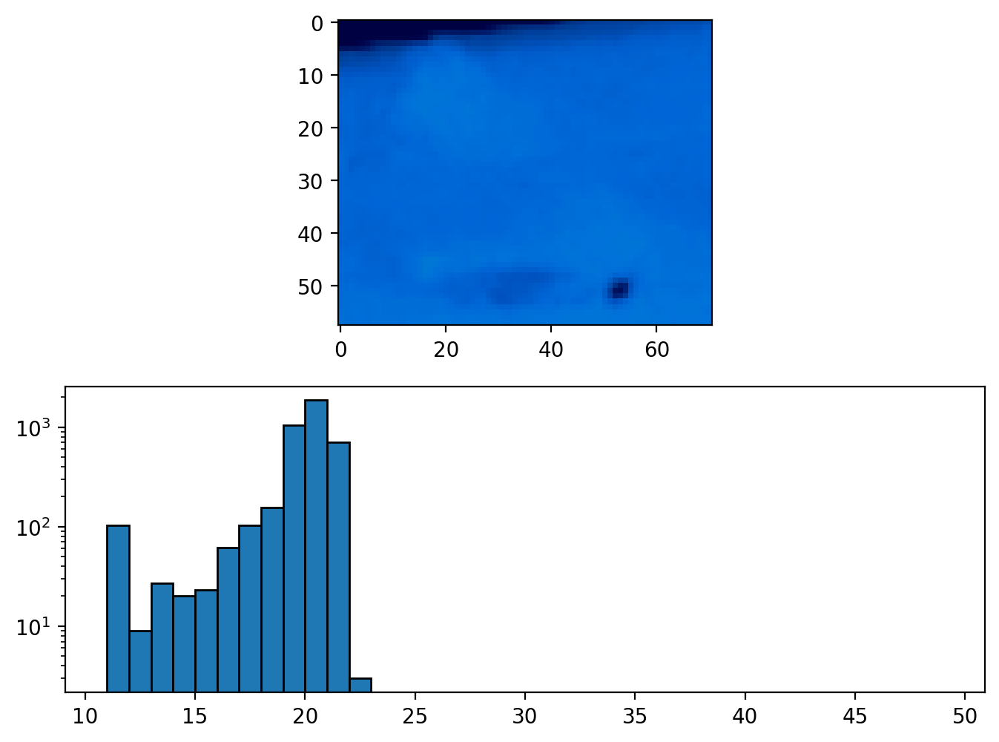

max_temperature: 22
weights: [ 103    9   27   20   23   62  103  155 1039 1864  710    3    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


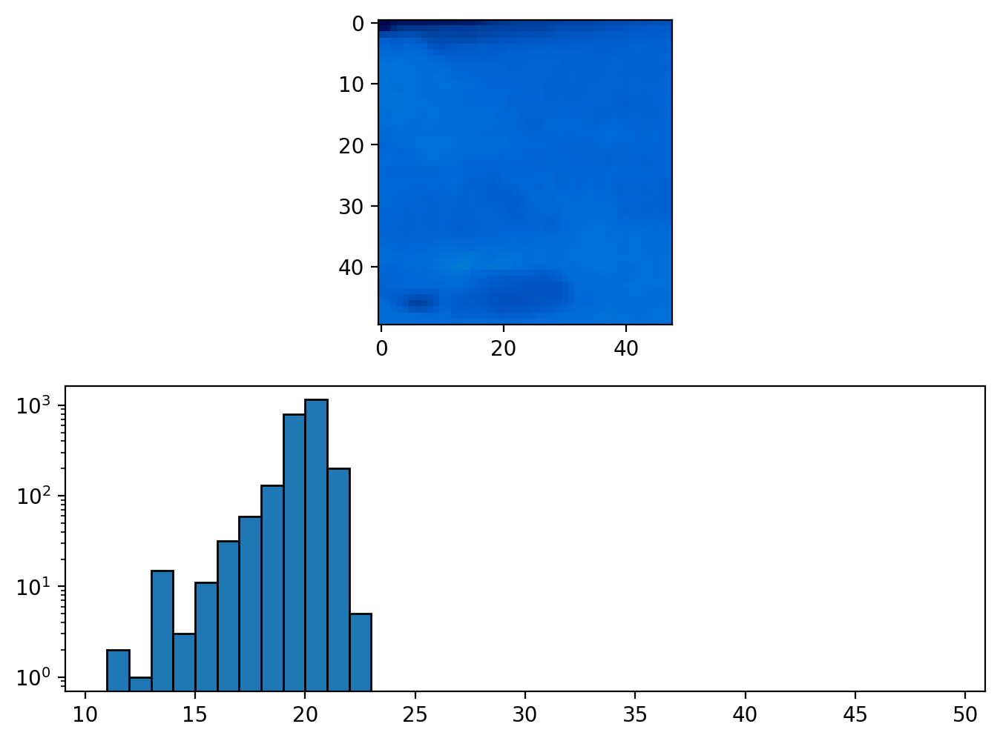

max_temperature: 22
weights: [   2    1   15    3   11   32   59  131  790 1148  203    5    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 5


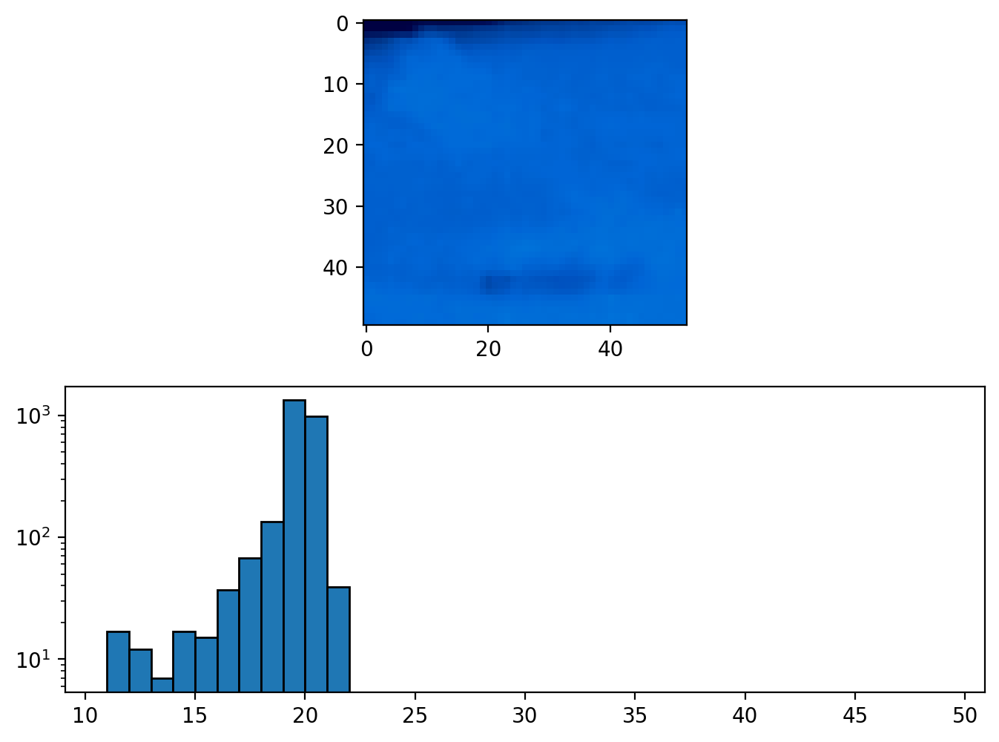

max_temperature: 21
weights: [  17   12    7   17   15   37   68  134 1328  976   39    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 39


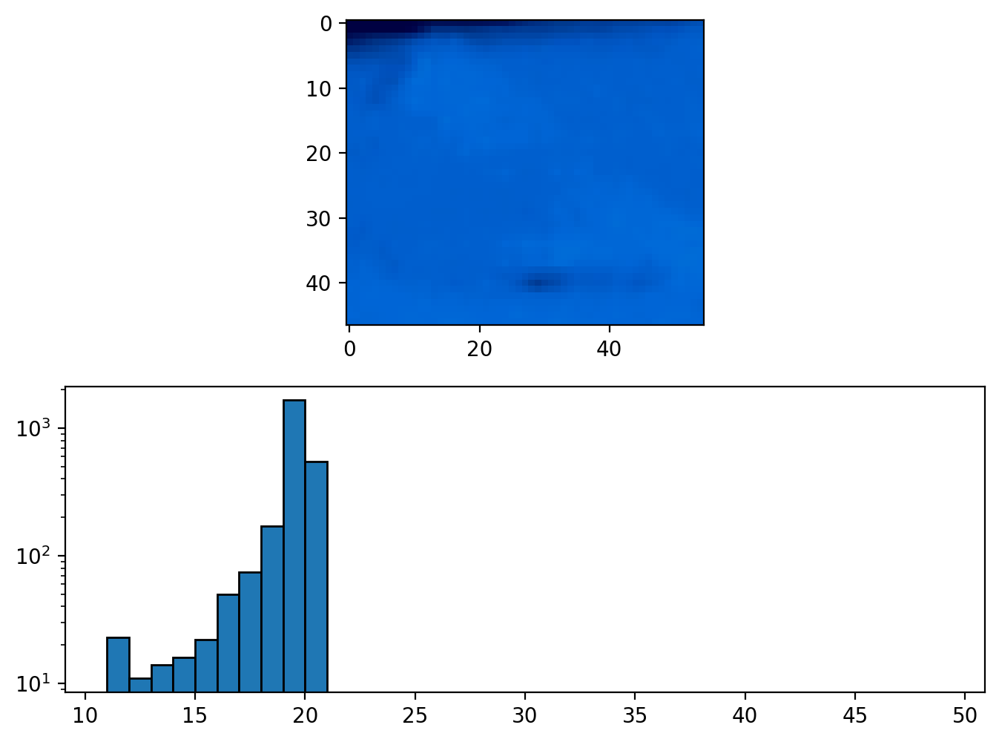

max_temperature: 20
weights: [  23   11   14   16   22   50   74  172 1655  548    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 548


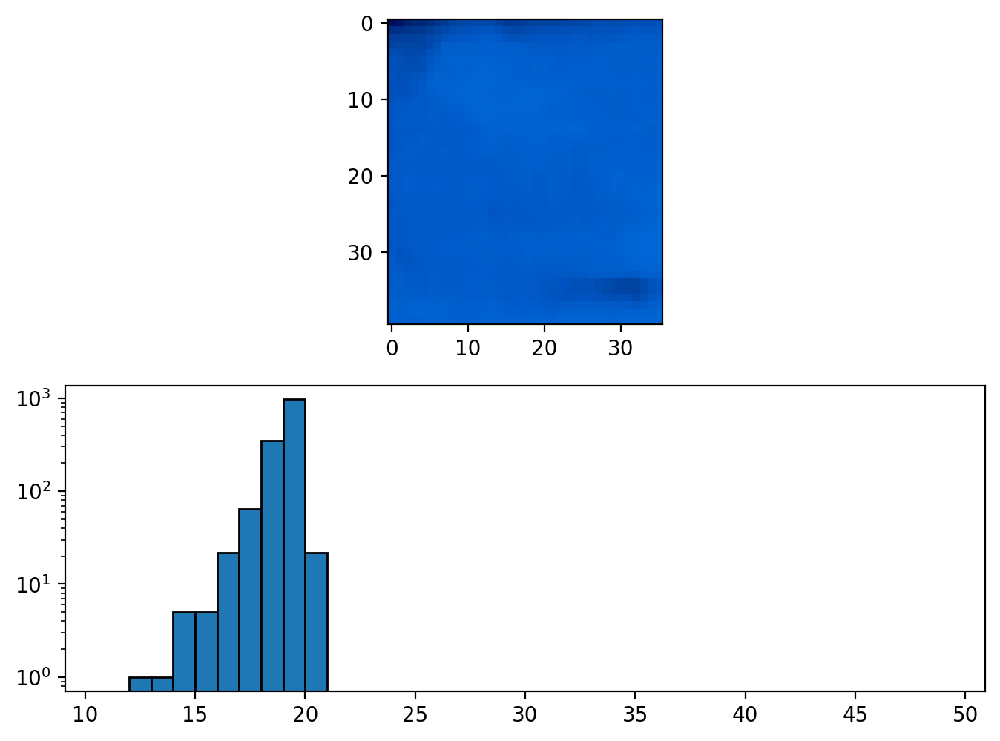

max_temperature: 20
weights: [  0   1   1   5   5  22  65 349 970  22   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 22


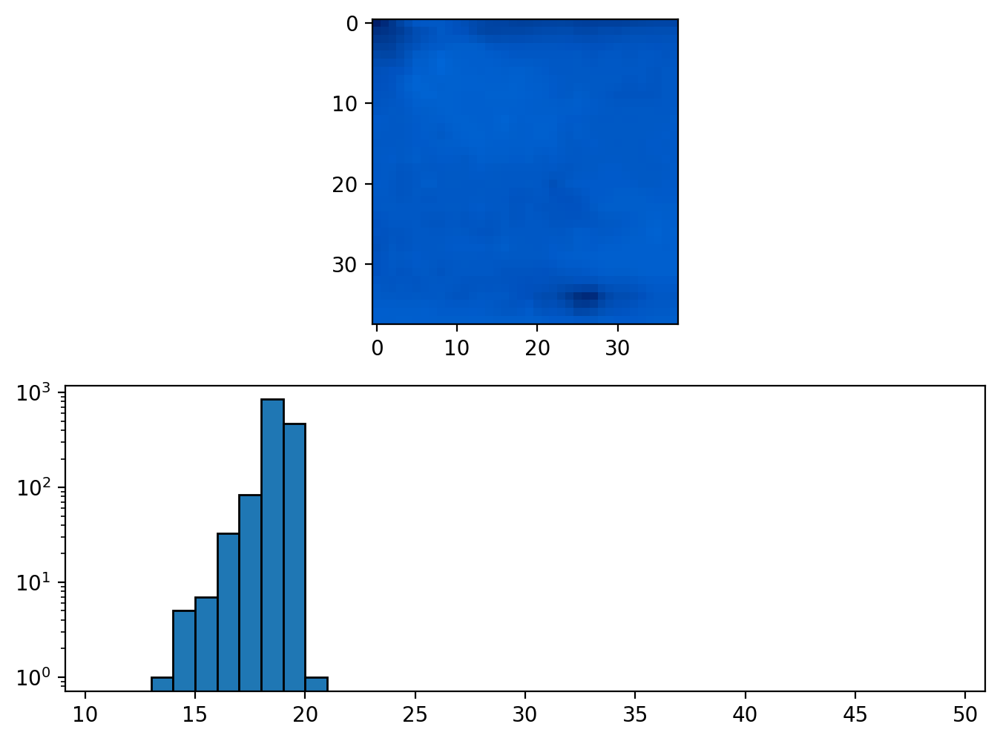

max_temperature: 20
weights: [  0   0   1   5   7  33  83 845 469   1   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


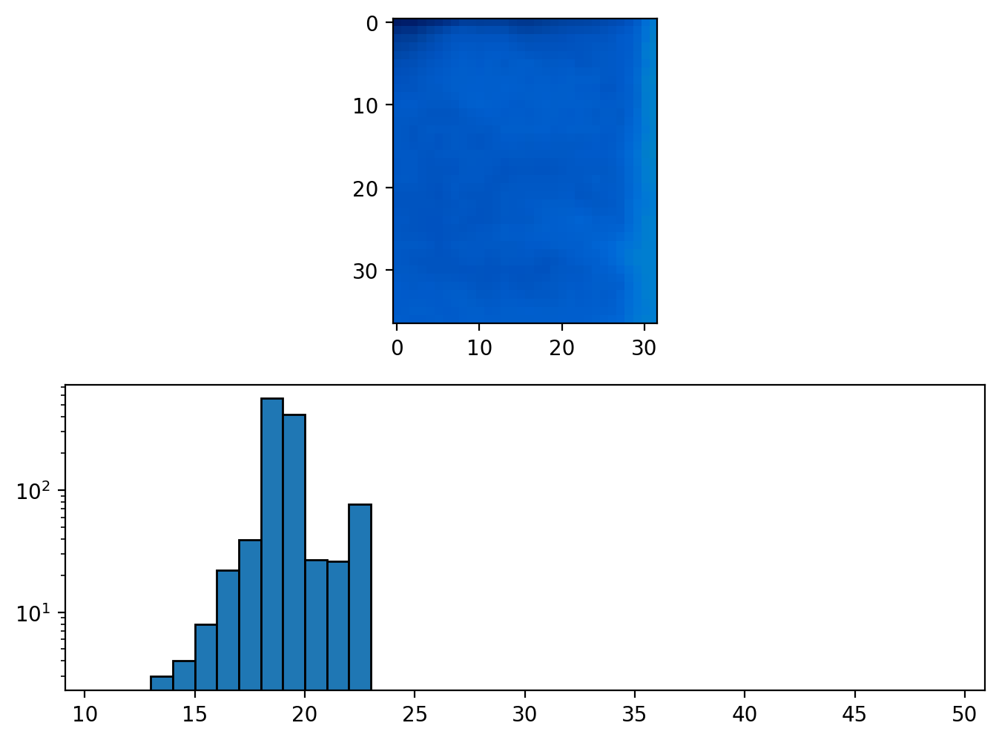

max_temperature: 22
weights: [  0   0   3   4   8  22  39 562 416  27  26  77   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 77


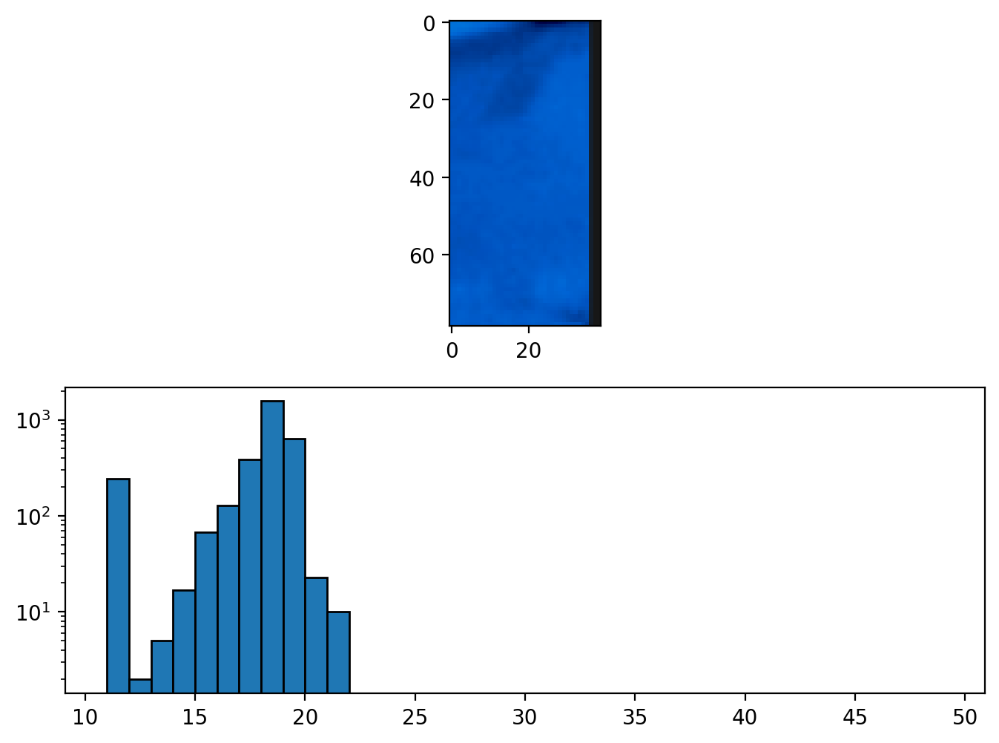

max_temperature: 21
weights: [ 242    2    5   17   67  129  386 1562  638   23   10    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 10


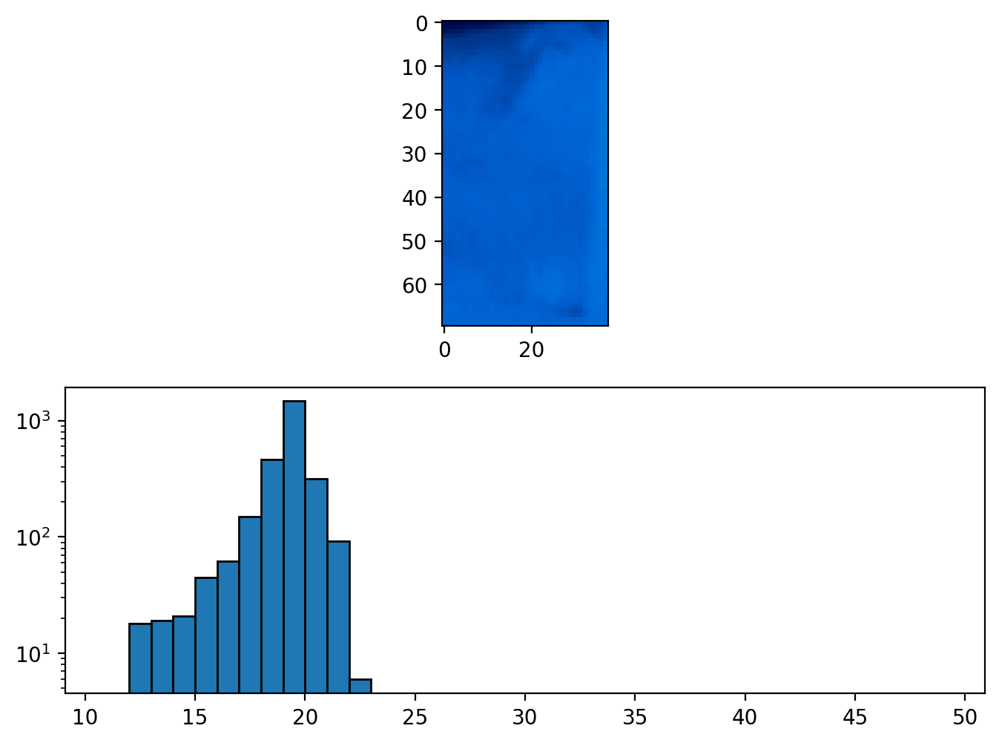

max_temperature: 22
weights: [   0   18   19   21   45   62  150  462 1469  316   92    6    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 6


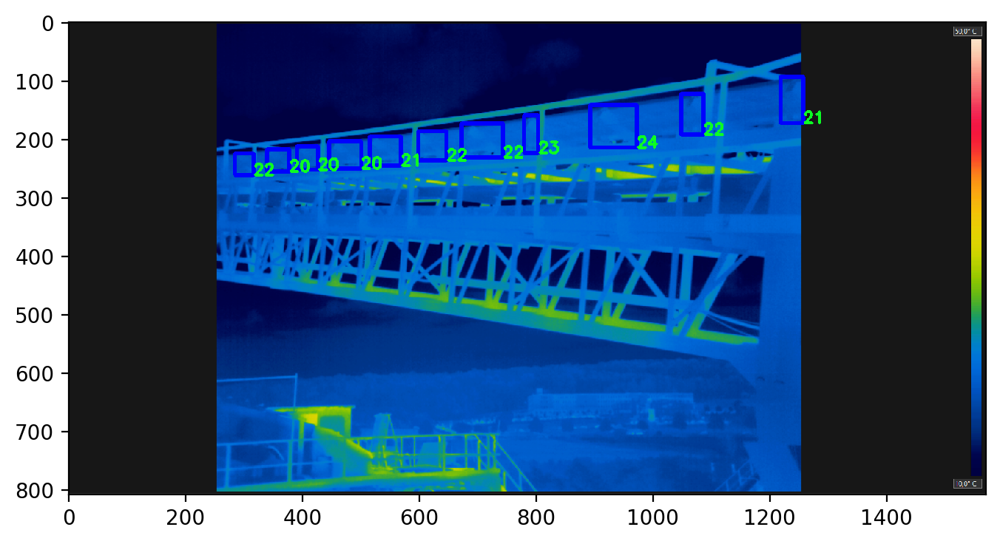

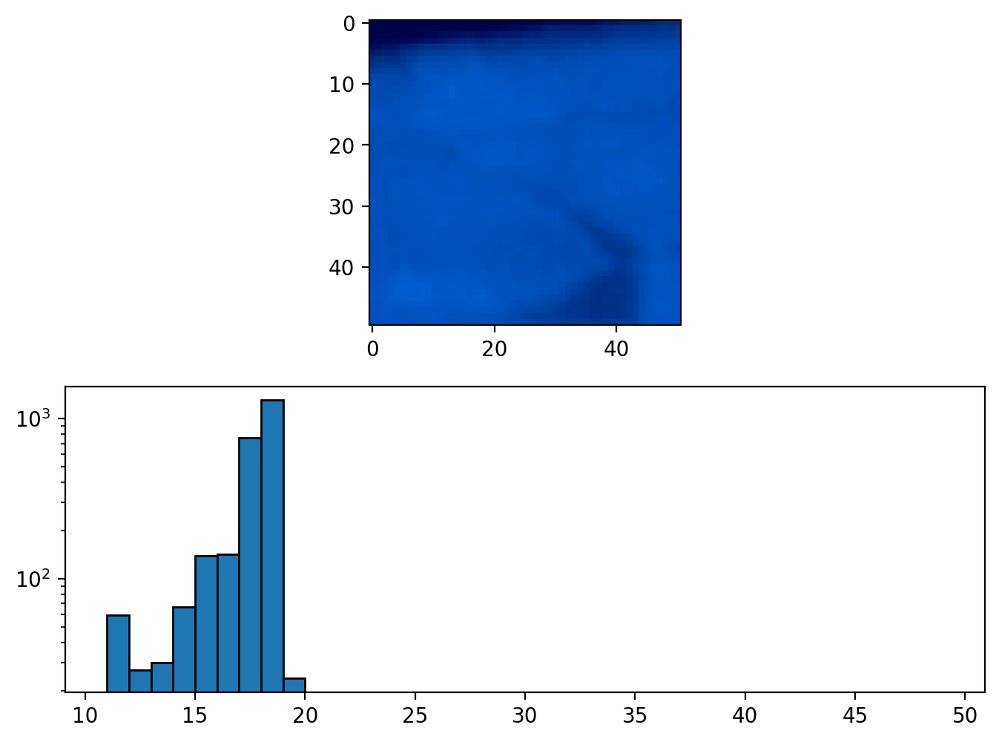

max_temperature: 19
weights: [  59   27   30   67  139  142  761 1301   24    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 24


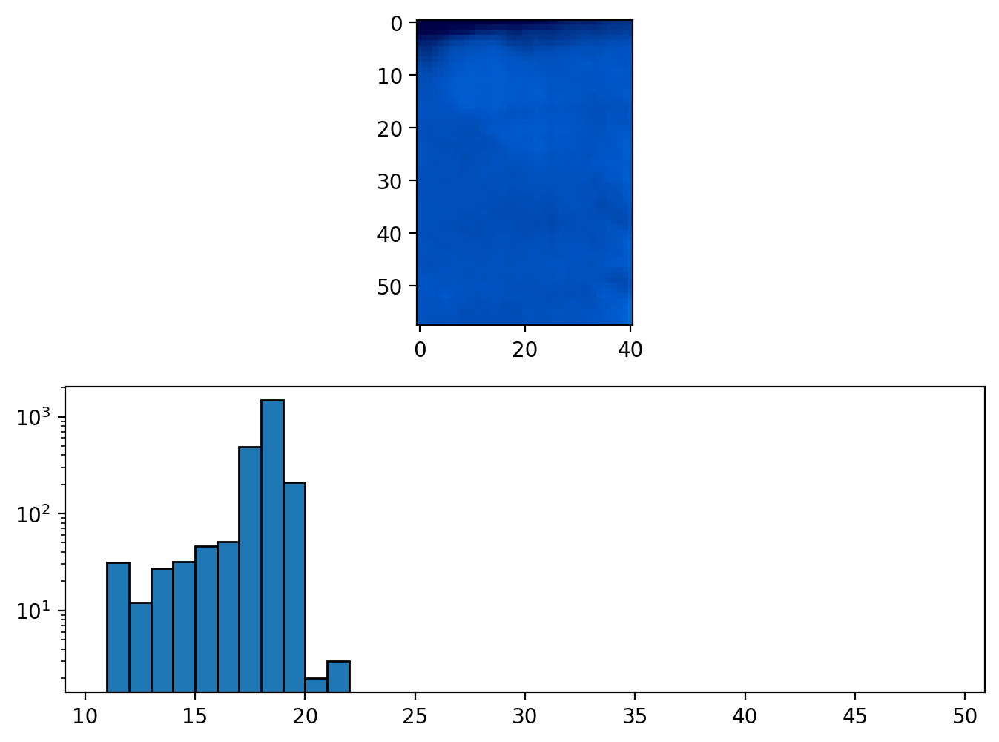

max_temperature: 21
weights: [  31   12   27   32   46   51  487 1476  211    2    3    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


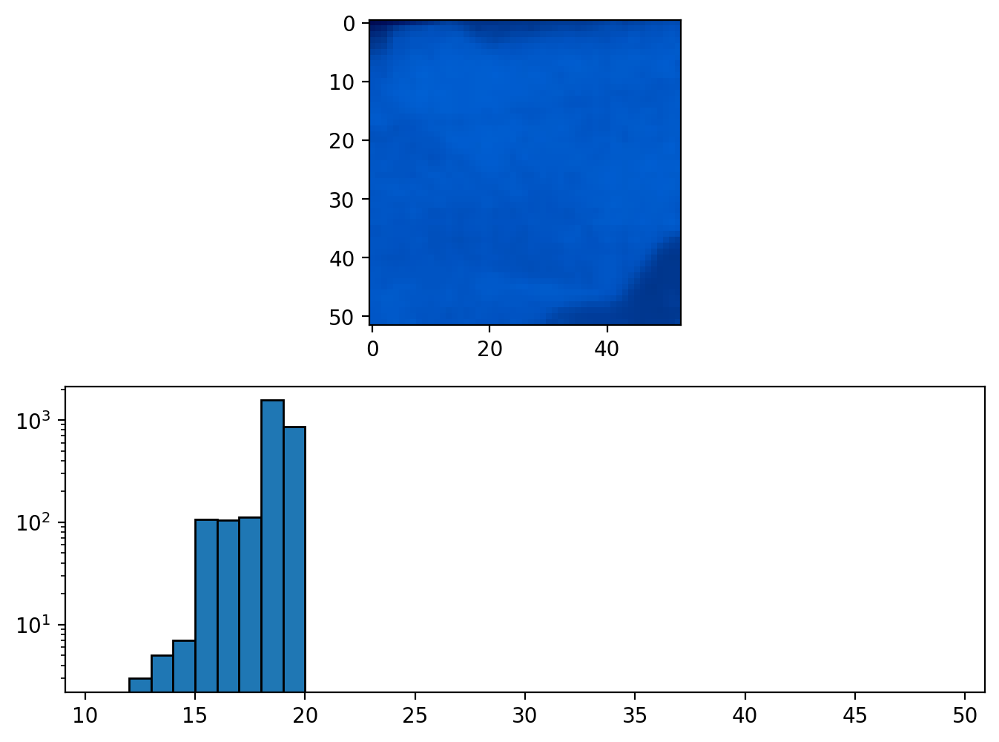

max_temperature: 19
weights: [   0    3    5    7  106  105  112 1560  858    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 858


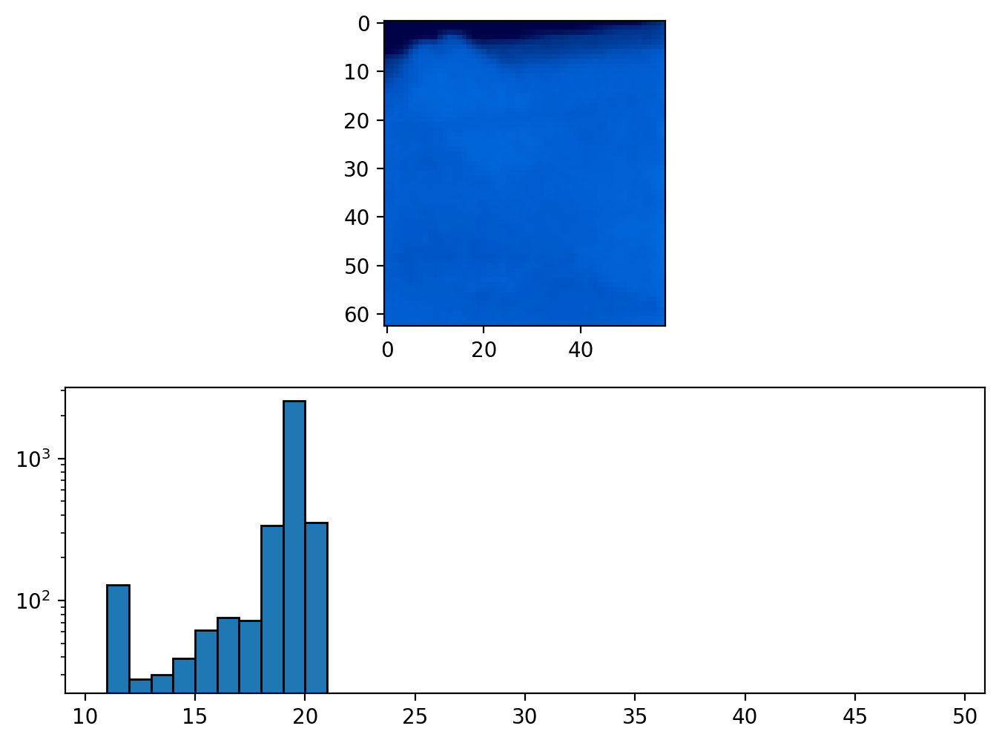

max_temperature: 20
weights: [ 129   28   30   39   62   76   72  336 2530  352    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 352


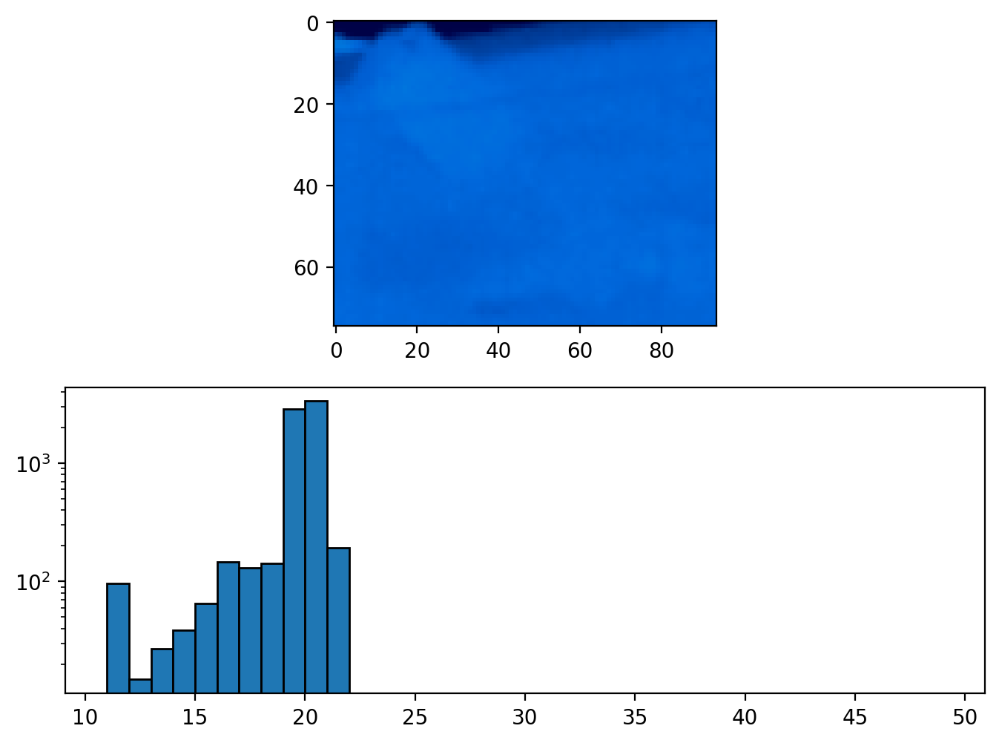

max_temperature: 21
weights: [  96   15   27   39   65  146  130  143 2860 3336  193    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 193


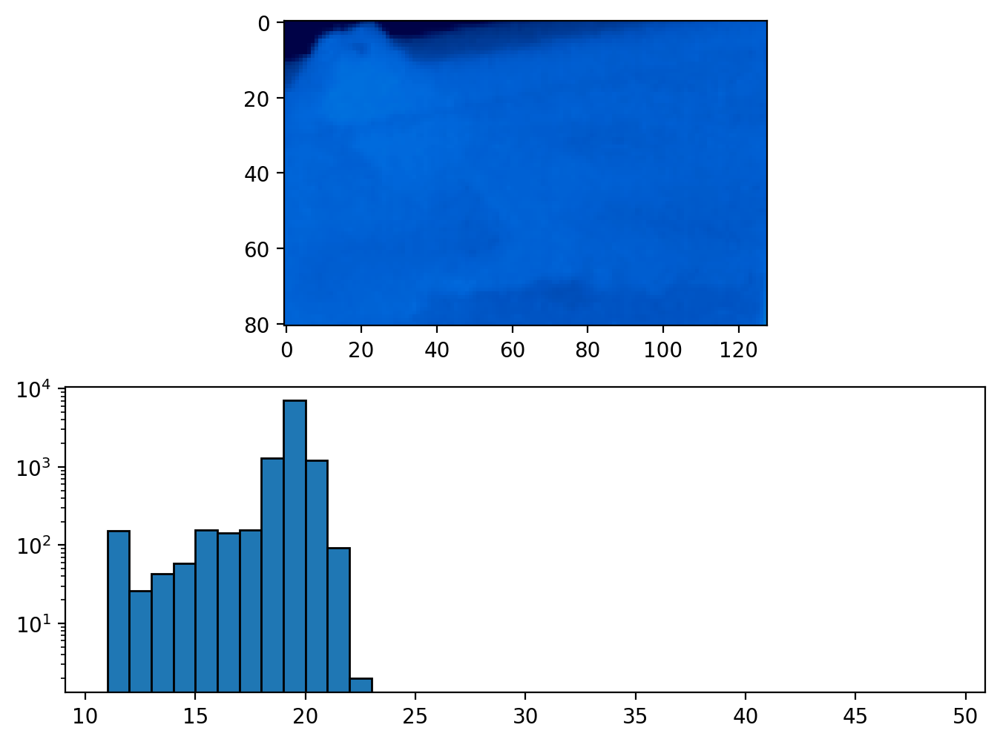

max_temperature: 22
weights: [ 152   26   43   58  157  144  156 1287 7027 1224   92    2    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


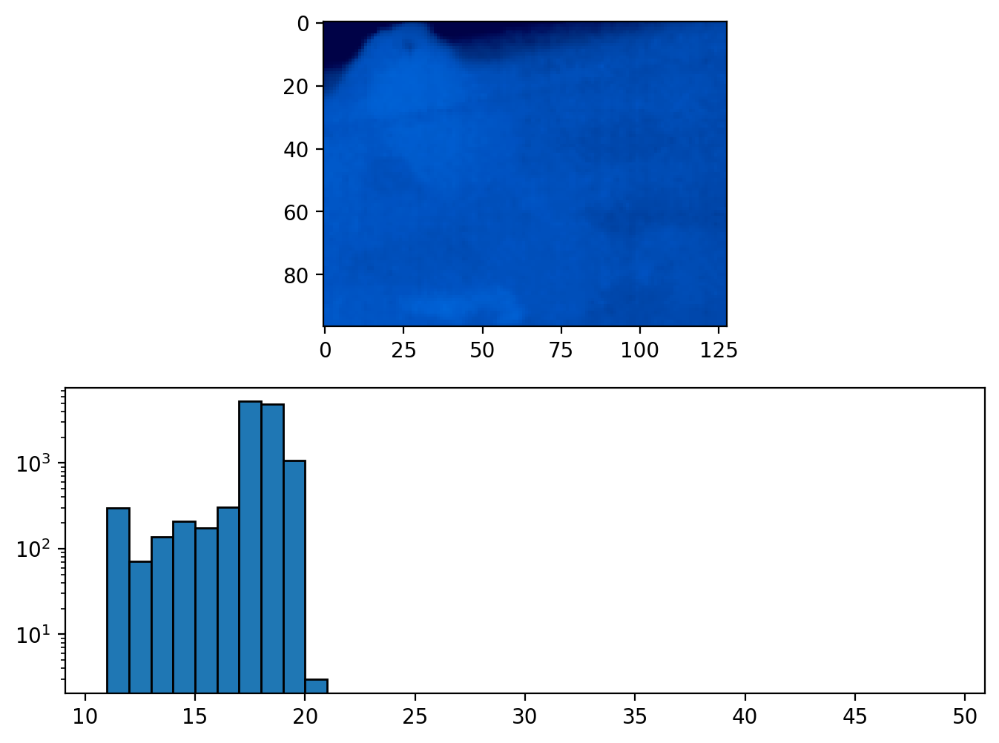

max_temperature: 20
weights: [ 299   71  138  210  175  306 5235 4910 1069    3    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


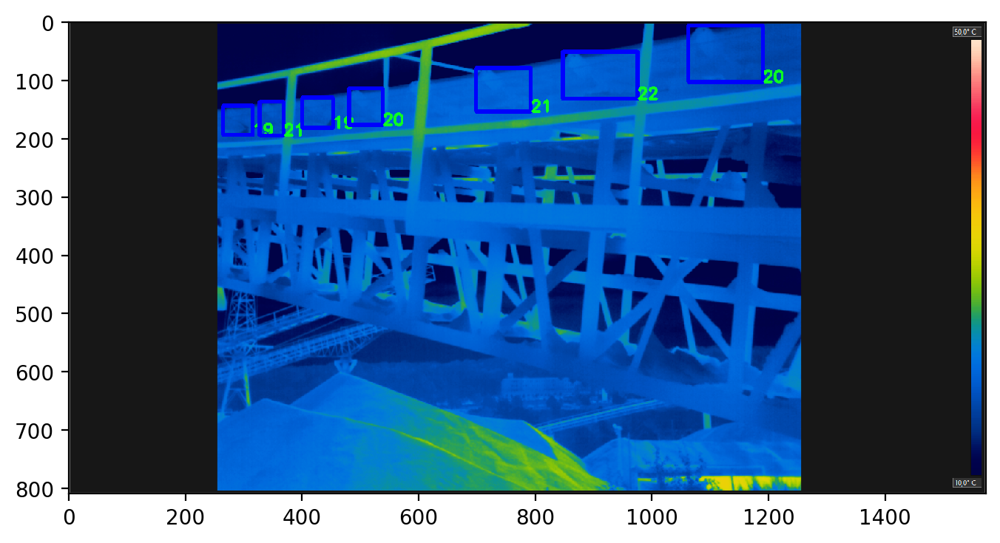

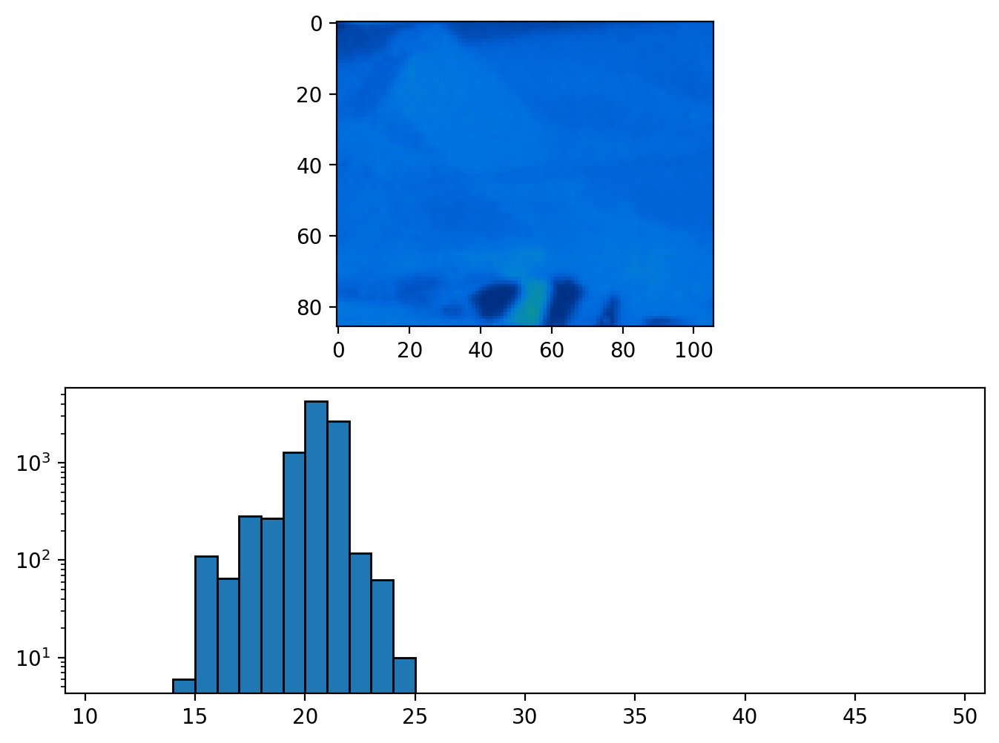

max_temperature: 24
weights: [   0    0    0    6  109   65  284  269 1274 4260 2659  117   63   10
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 10


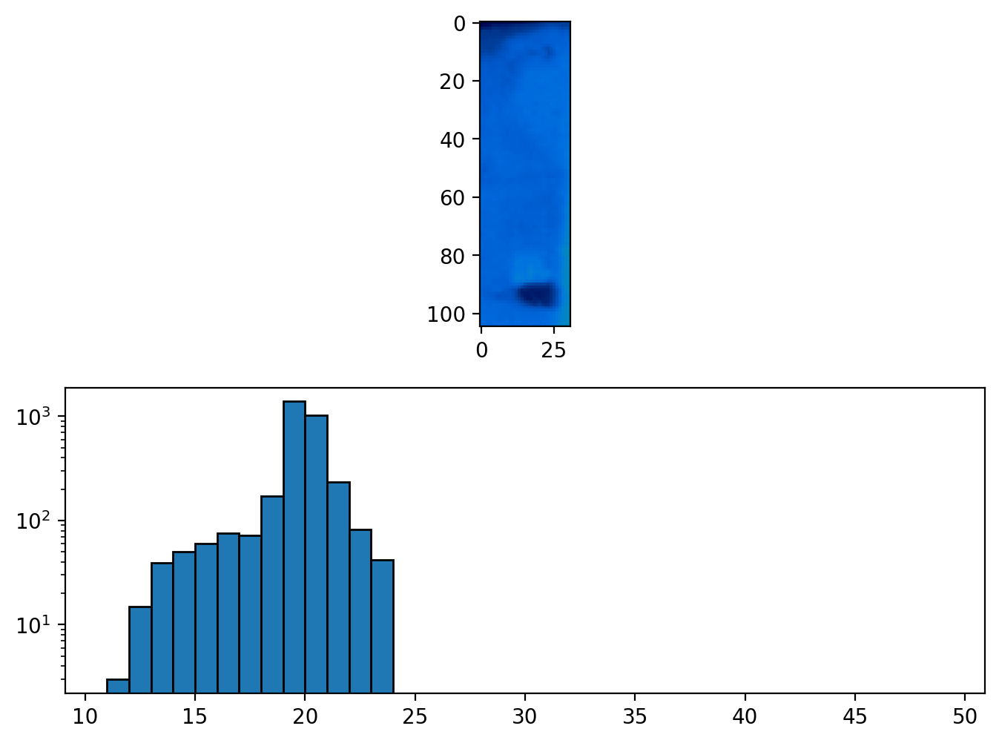

max_temperature: 23
weights: [   3   15   39   50   60   75   72  172 1388 1024  233   82   42    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 42


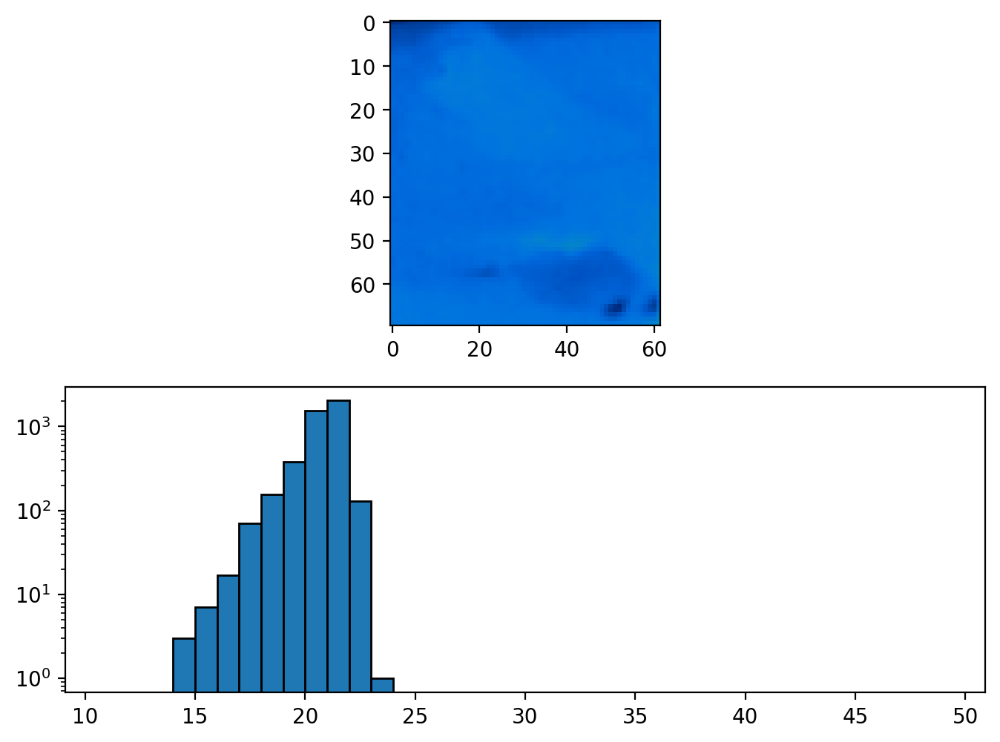

max_temperature: 23
weights: [   0    0    0    3    7   17   70  156  376 1542 2038  130    1    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1


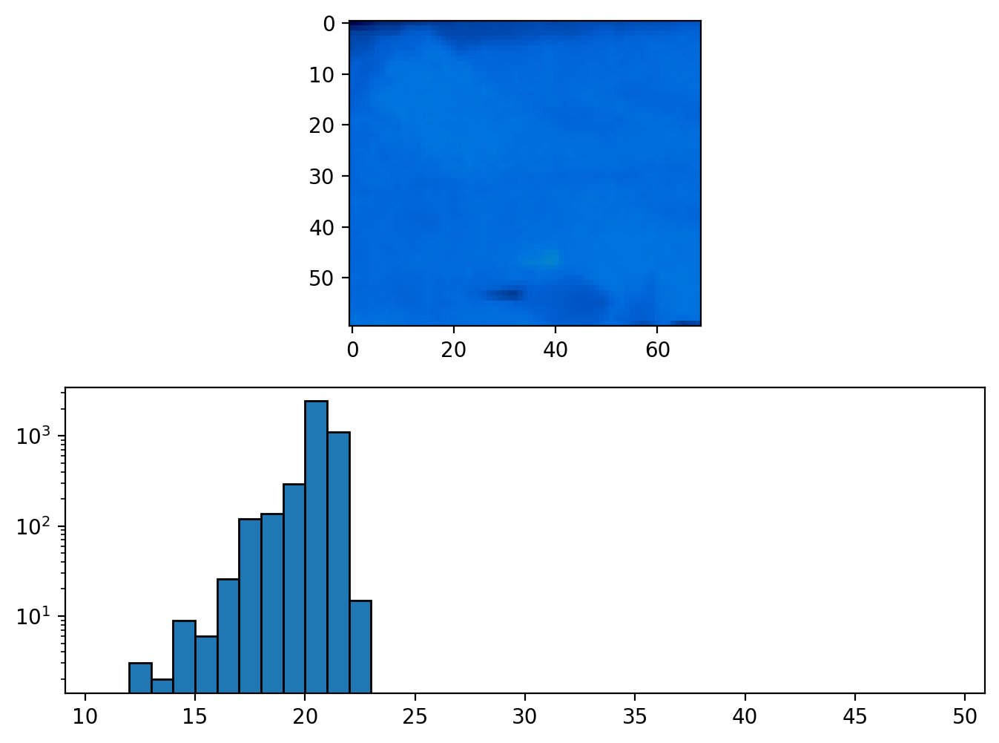

max_temperature: 22
weights: [   0    3    2    9    6   26  120  136  291 2434 1098   15    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 15


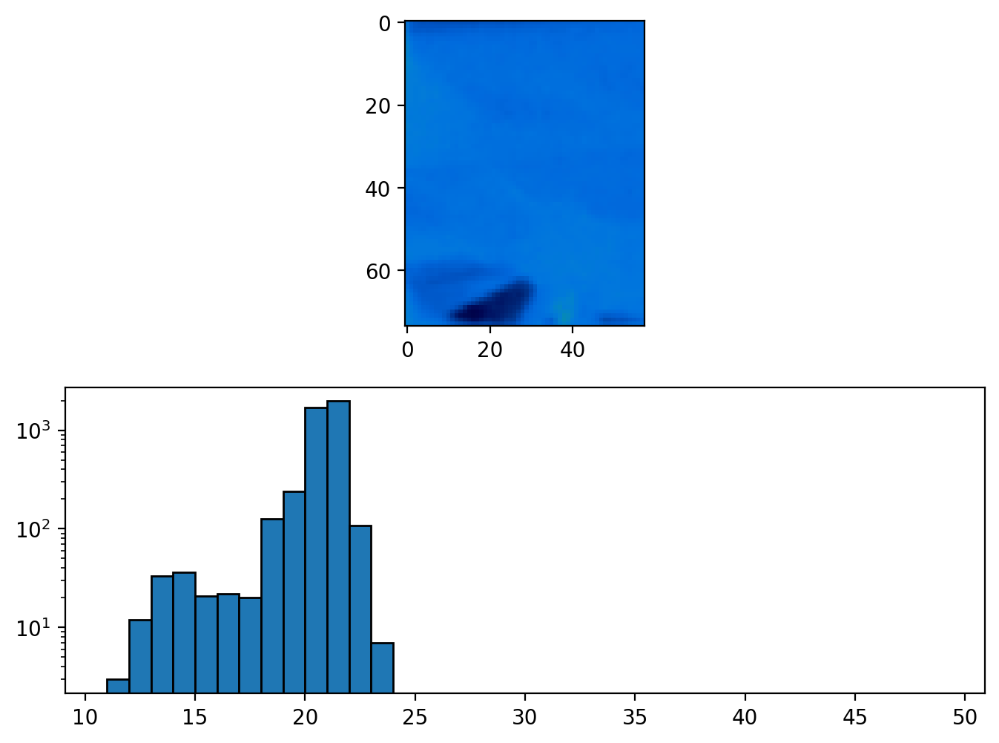

max_temperature: 23
weights: [   3   12   33   36   21   22   20  126  239 1694 1971  108    7    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 7


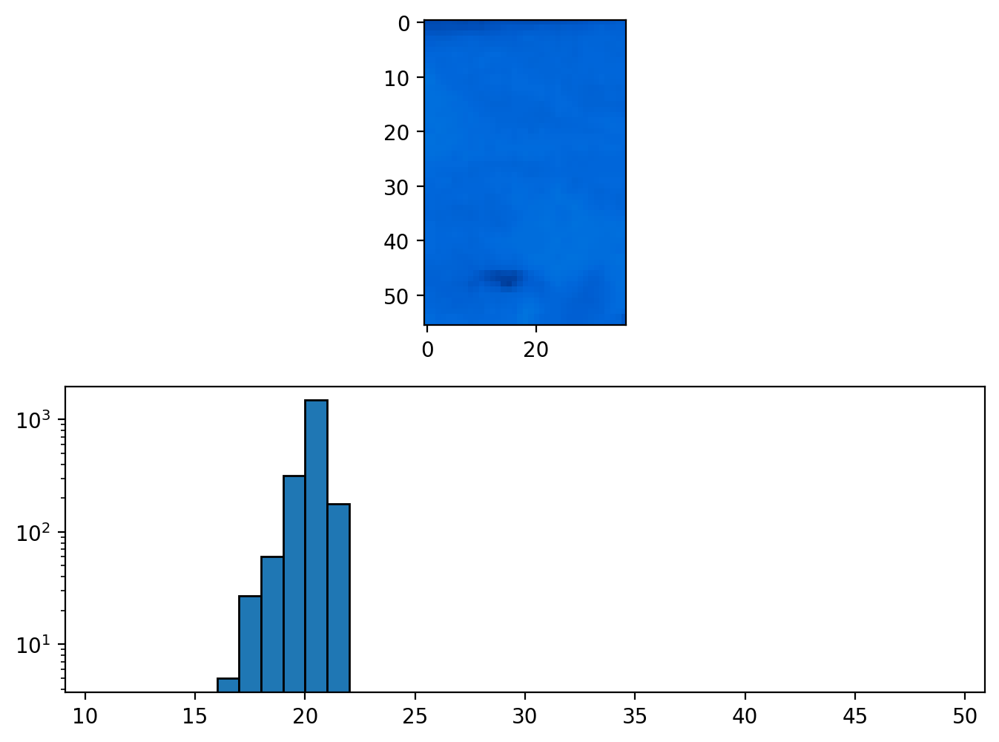

max_temperature: 21
weights: [   0    0    0    0    0    5   27   60  319 1484  177    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 177


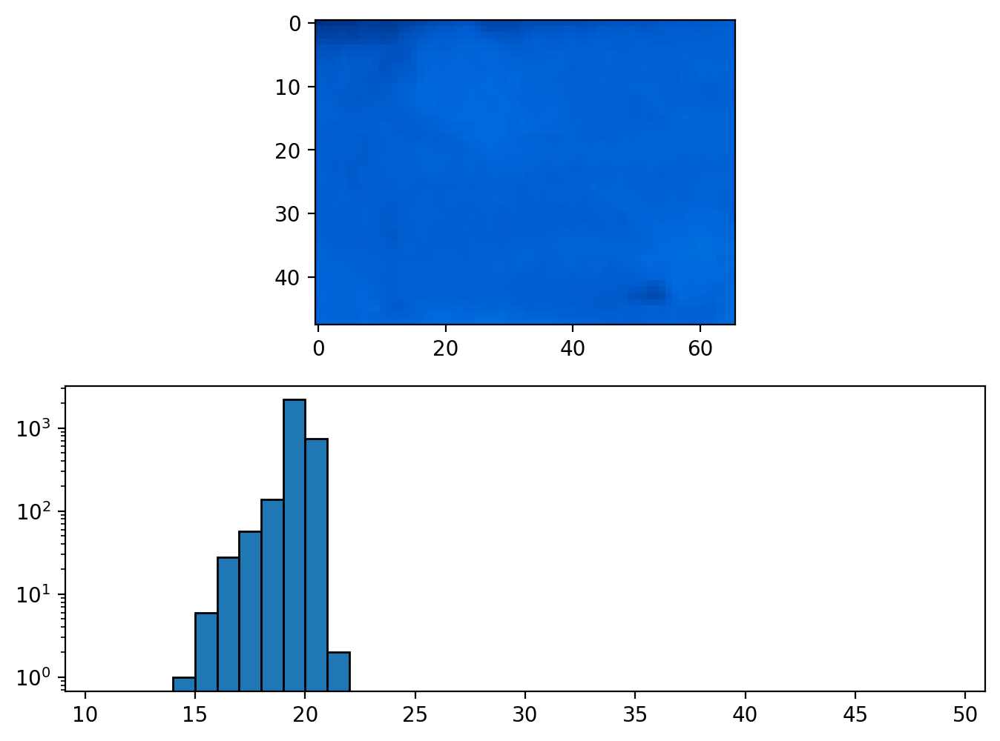

max_temperature: 21
weights: [   0    0    0    1    6   28   57  138 2186  750    2    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


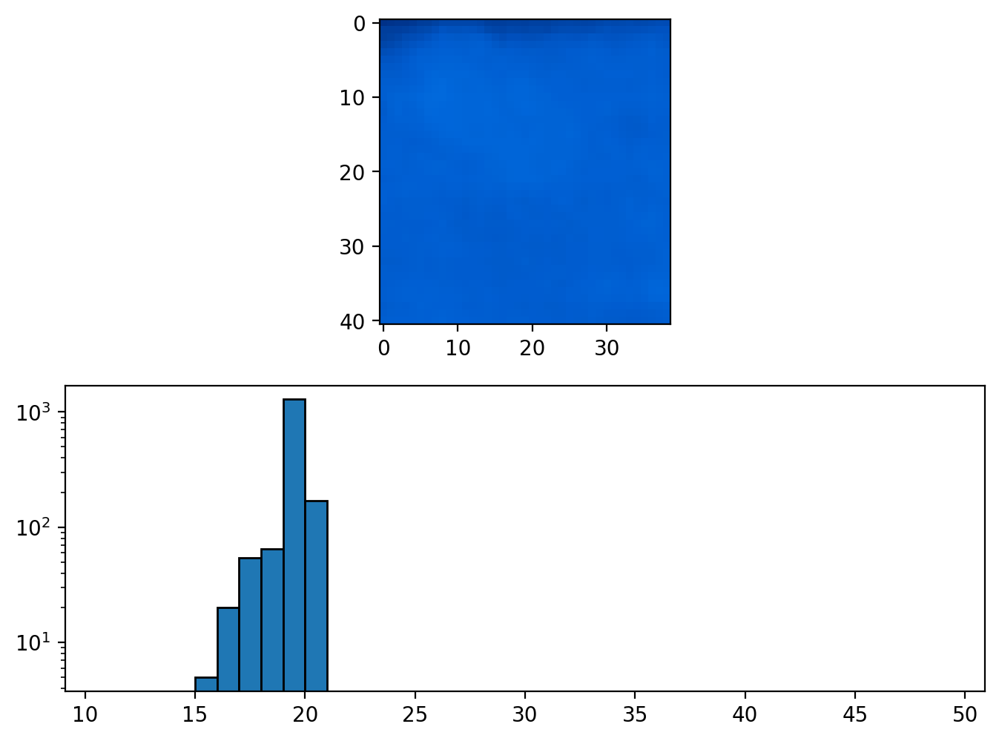

max_temperature: 20
weights: [   0    0    0    0    5   20   54   65 1286  169    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 169


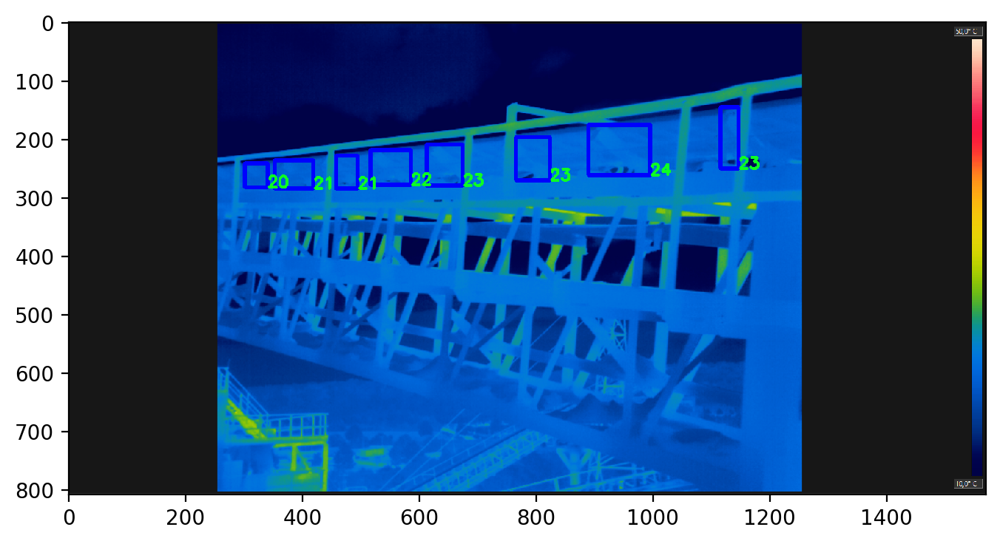

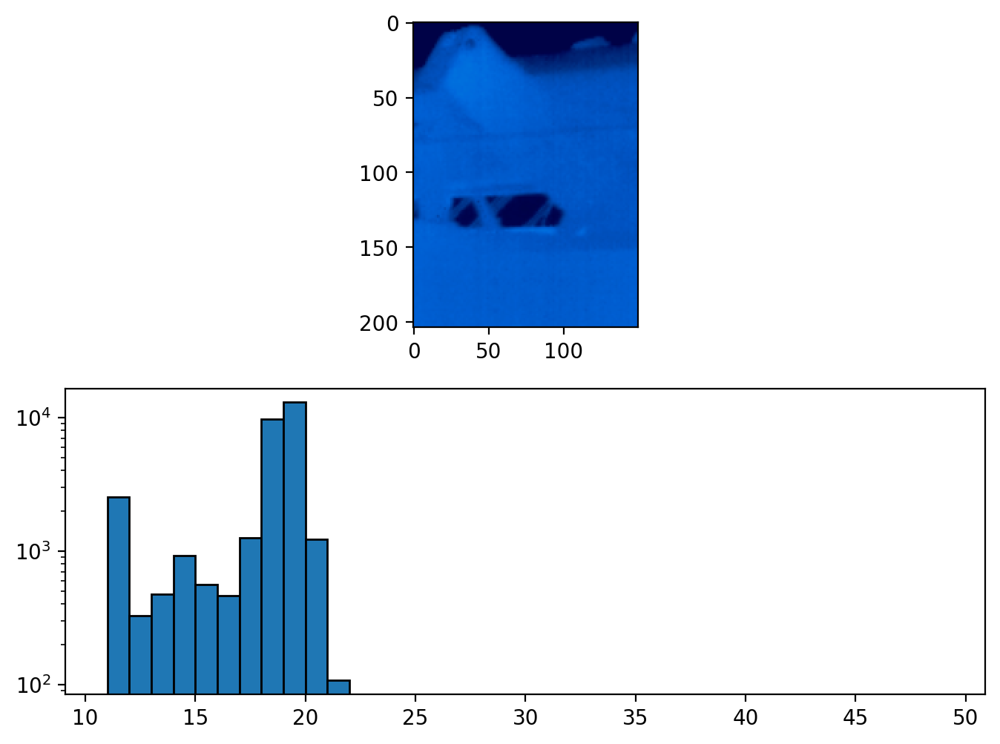

max_temperature: 21
weights: [ 2547   328   475   919   558   465  1251  9770 12954  1225   108     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0]
max_temperature weight: 108


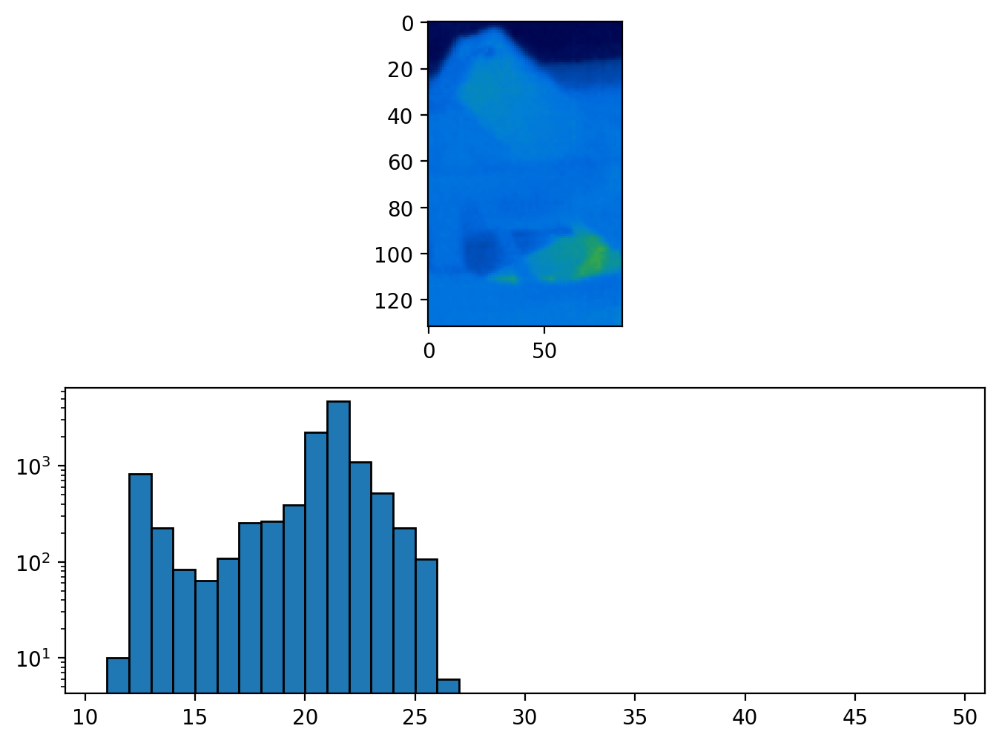

max_temperature: 26
weights: [  10  826  225   83   64  109  257  266  389 2225 4683 1091  522  225
  107    6    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 6


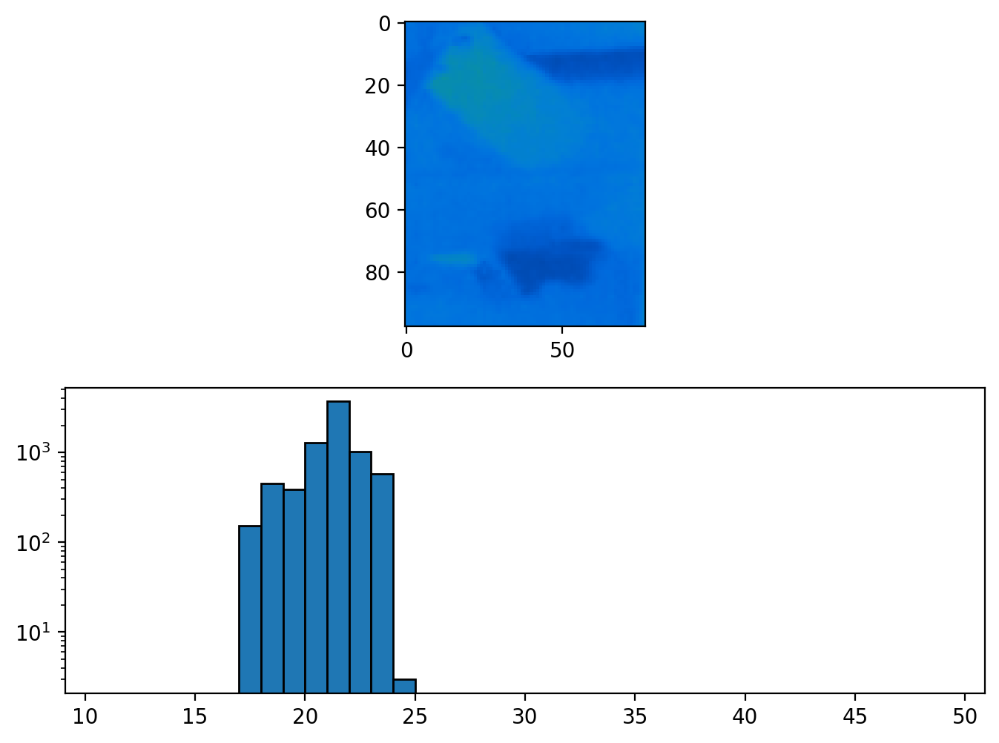

max_temperature: 24
weights: [   0    0    0    0    0    0  152  451  388 1271 3680 1021  580    3
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 3


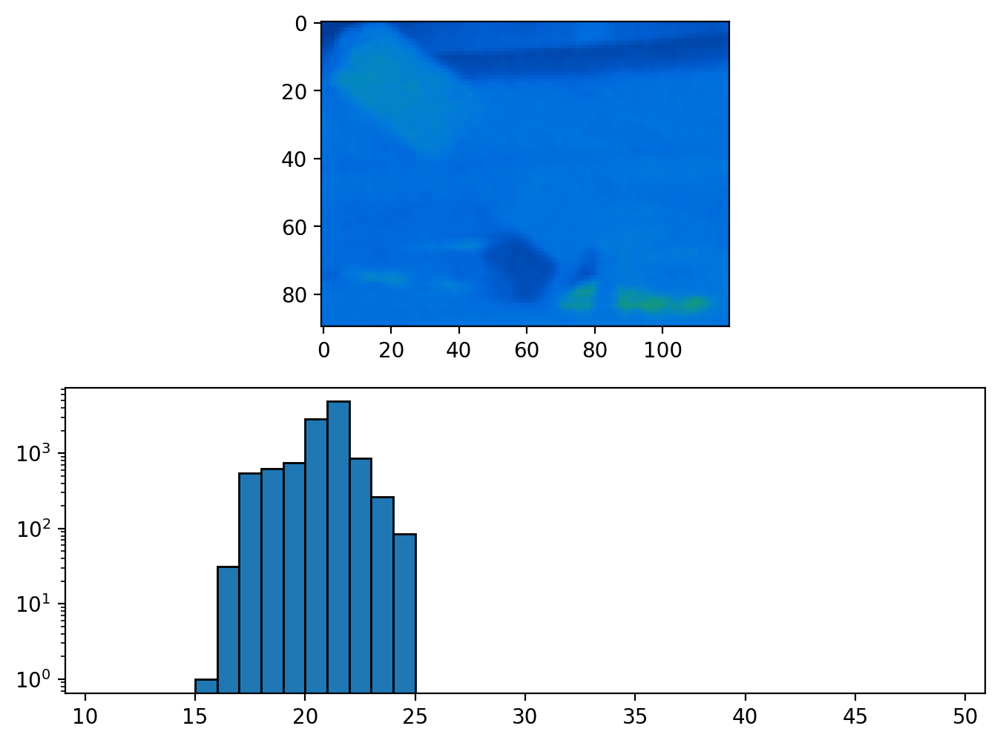

max_temperature: 24
weights: [   0    0    0    0    1   31  540  620  738 2829 4848  847  262   84
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 84


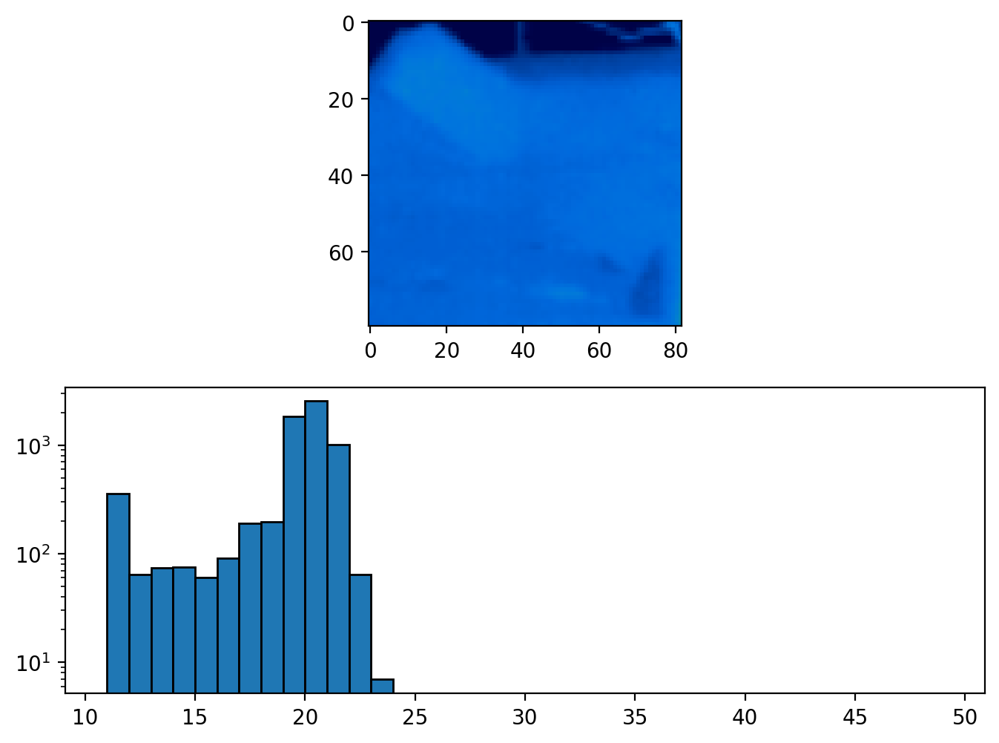

max_temperature: 23
weights: [ 356   64   74   75   60   91  190  198 1828 2542 1011   64    7    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 7


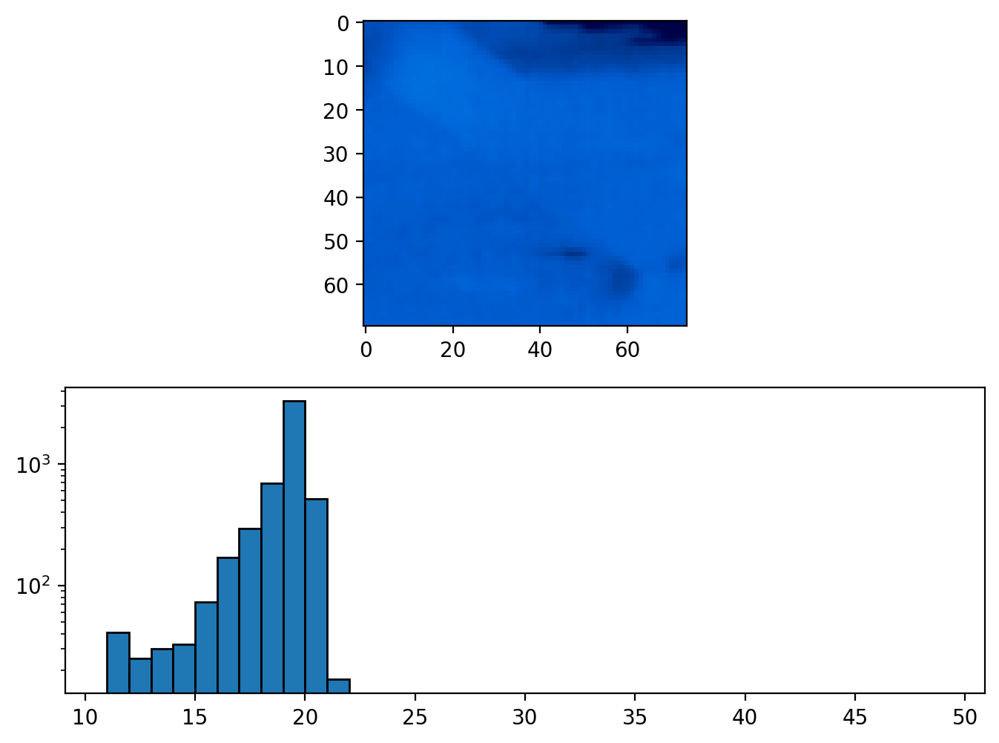

max_temperature: 21
weights: [  41   25   30   33   73  171  293  691 3290  516   17    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 17


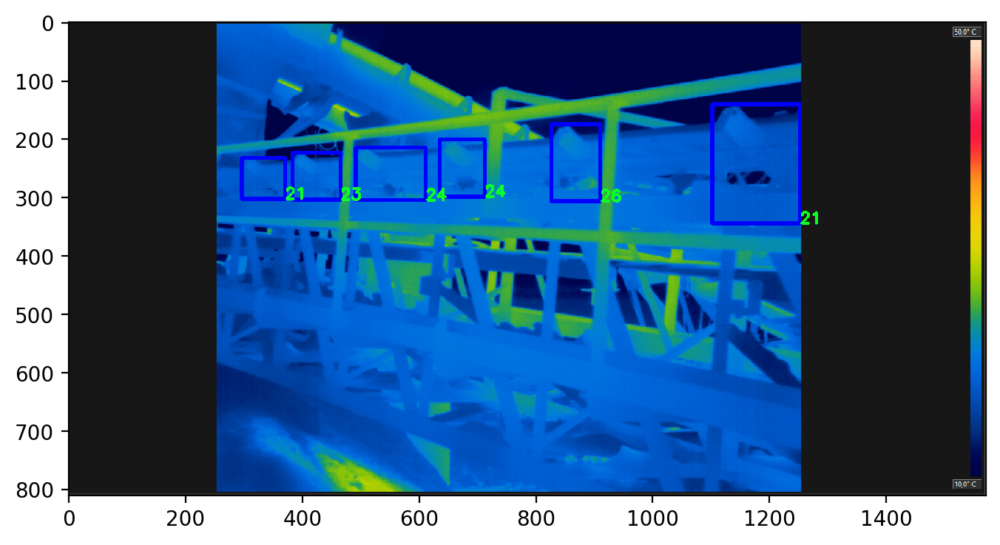

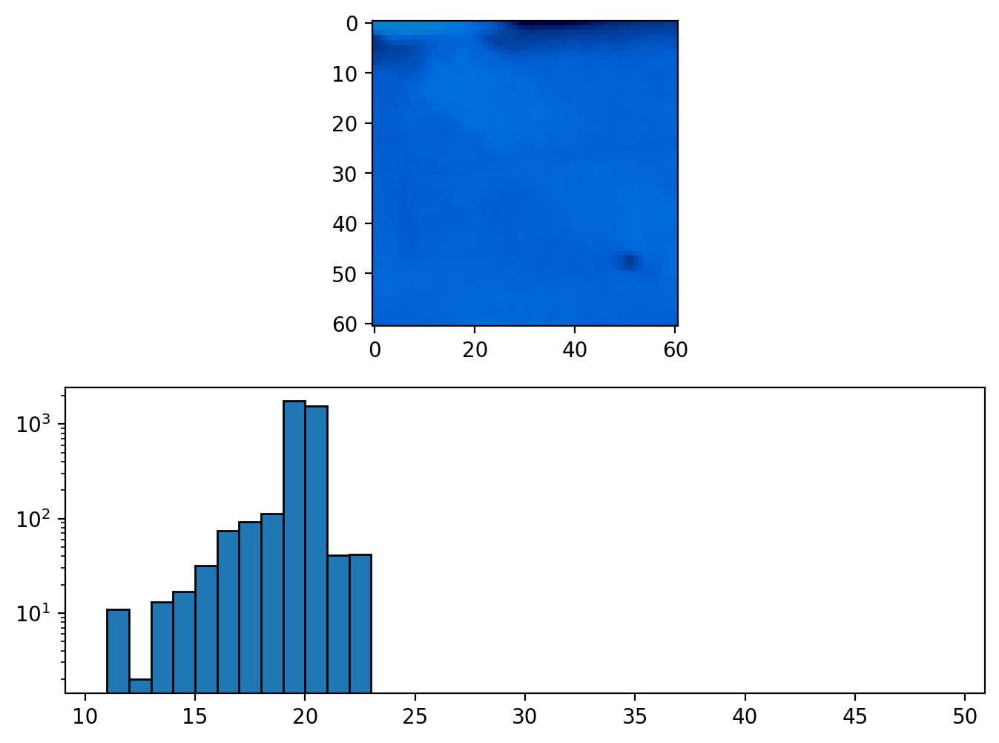

max_temperature: 22
weights: [  11    2   13   17   32   74   92  112 1747 1538   41   42    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 42


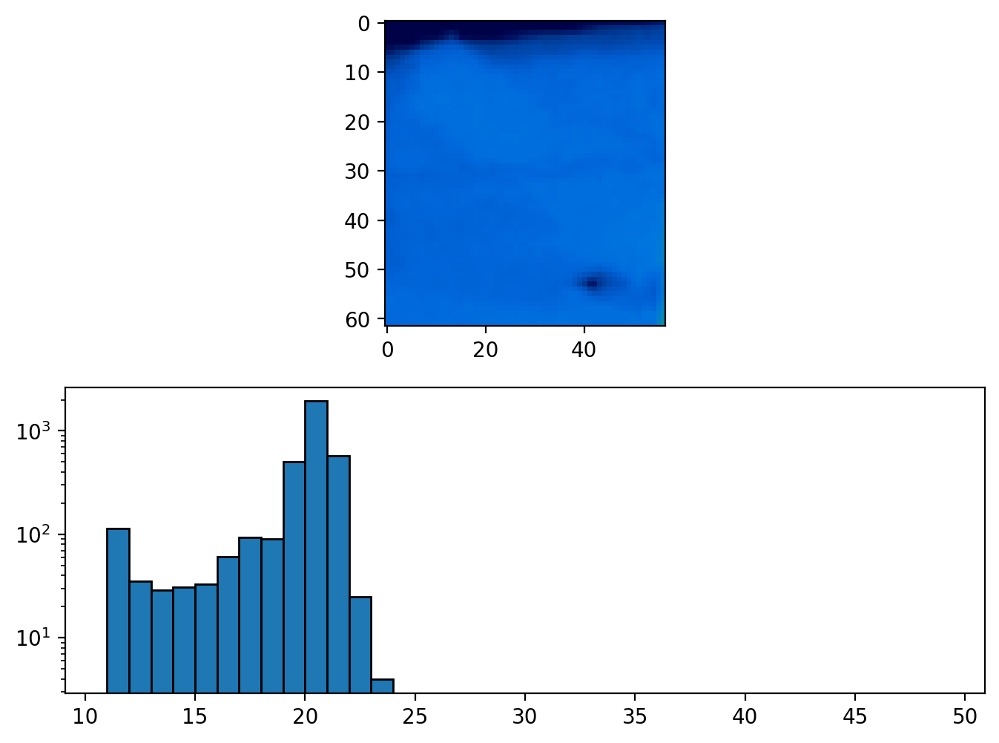

max_temperature: 23
weights: [ 114   35   29   31   33   61   93   91  503 1937  578   25    4    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 4


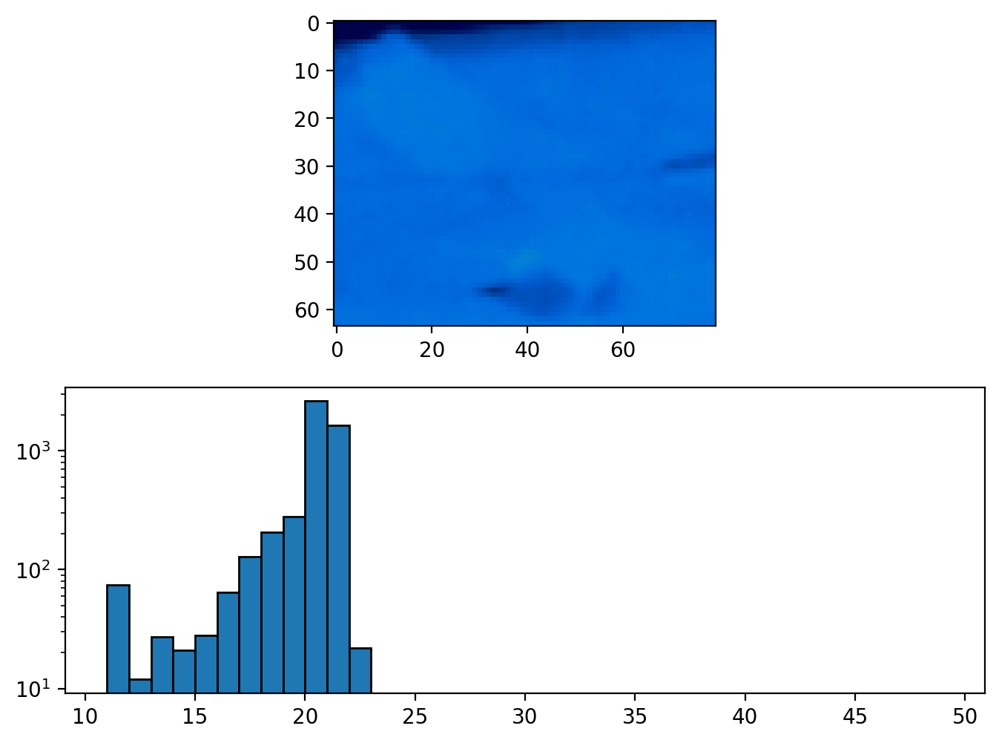

max_temperature: 22
weights: [  74   12   27   21   28   64  129  207  280 2618 1638   22    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 22


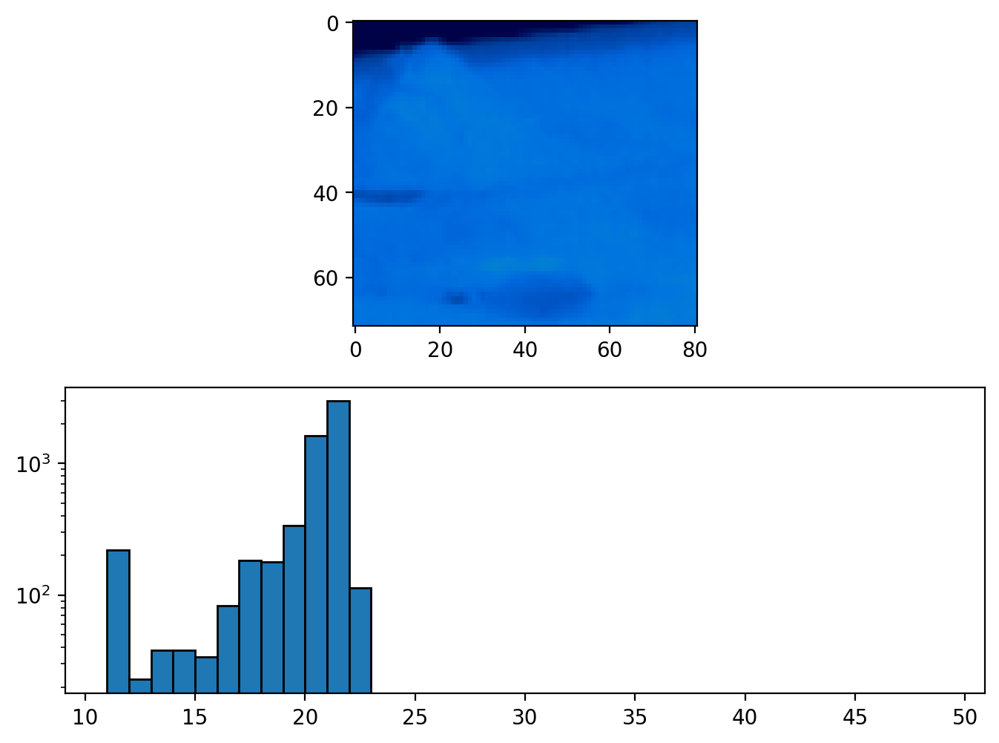

max_temperature: 22
weights: [ 221   23   38   38   34   83  182  178  337 1617 2967  114    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 114


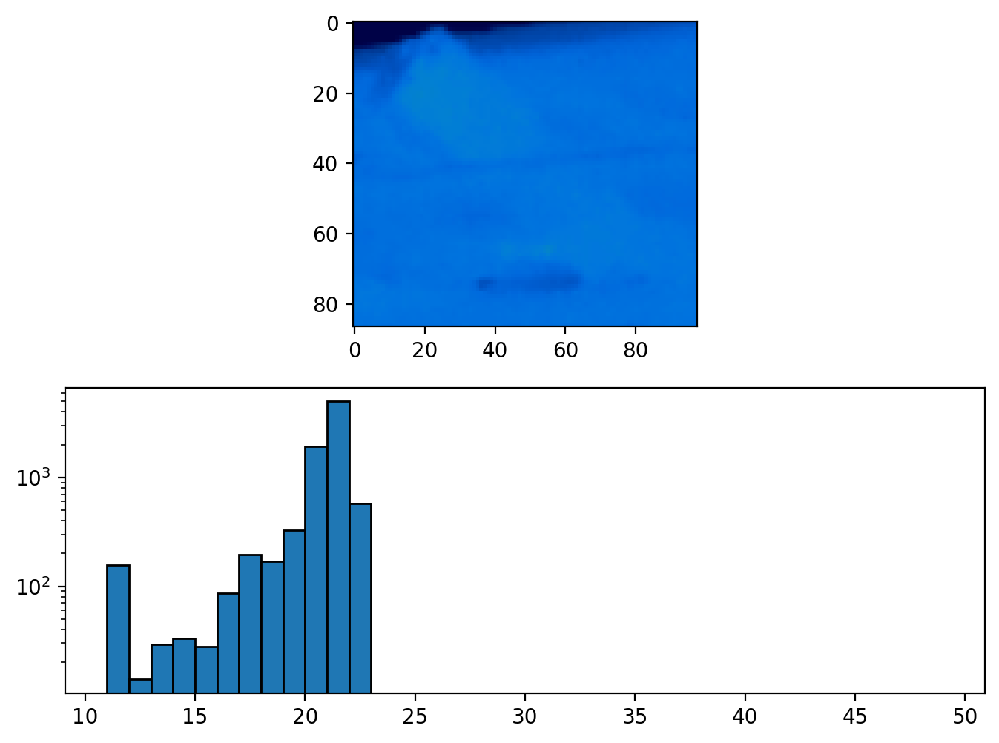

max_temperature: 22
weights: [ 157   14   29   33   28   86  194  170  325 1937 4981  572    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 572


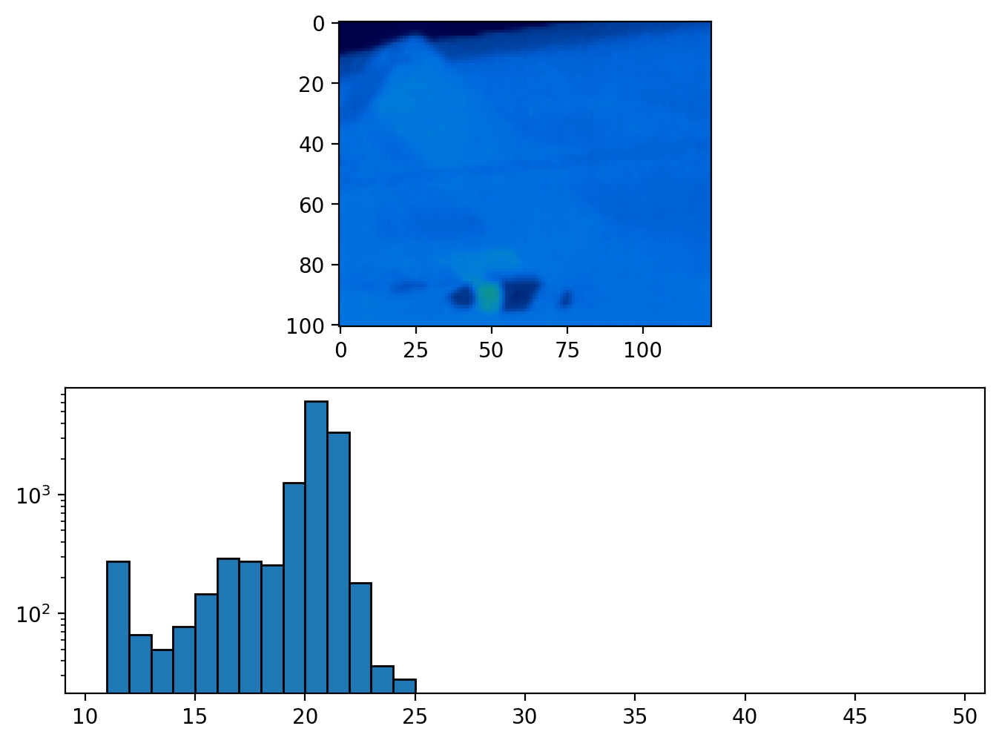

max_temperature: 24
weights: [ 275   66   50   77  145  292  276  255 1267 6101 3374  181   36   28
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 28


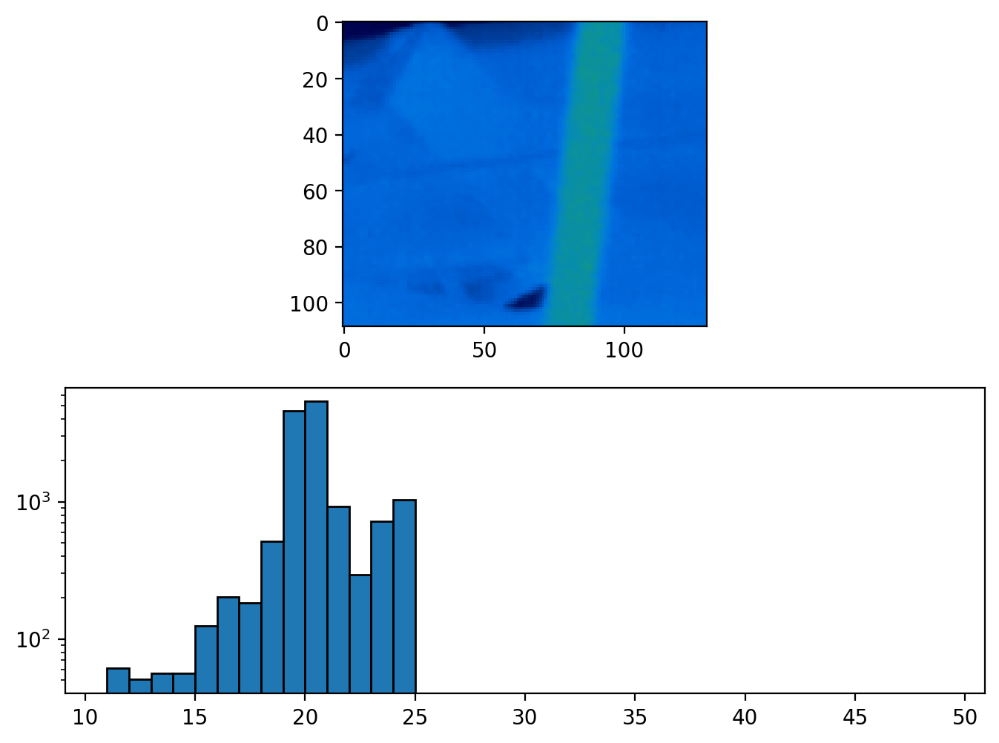

max_temperature: 24
weights: [  61   51   56   56  124  203  184  513 4577 5376  923  294  724 1028
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1028


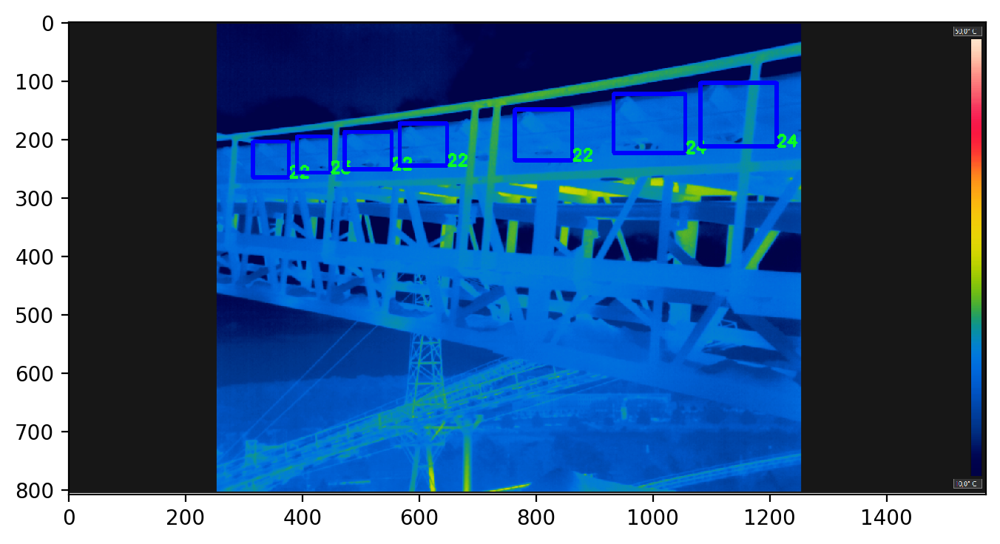

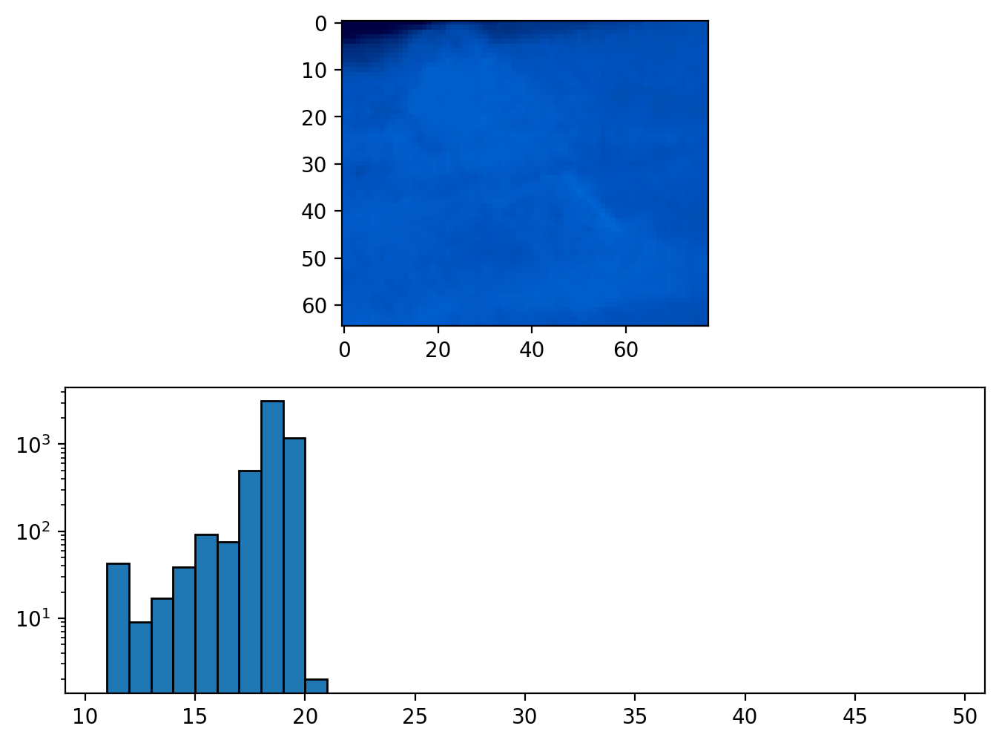

max_temperature: 20
weights: [  43    9   17   39   91   76  498 3123 1172    2    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


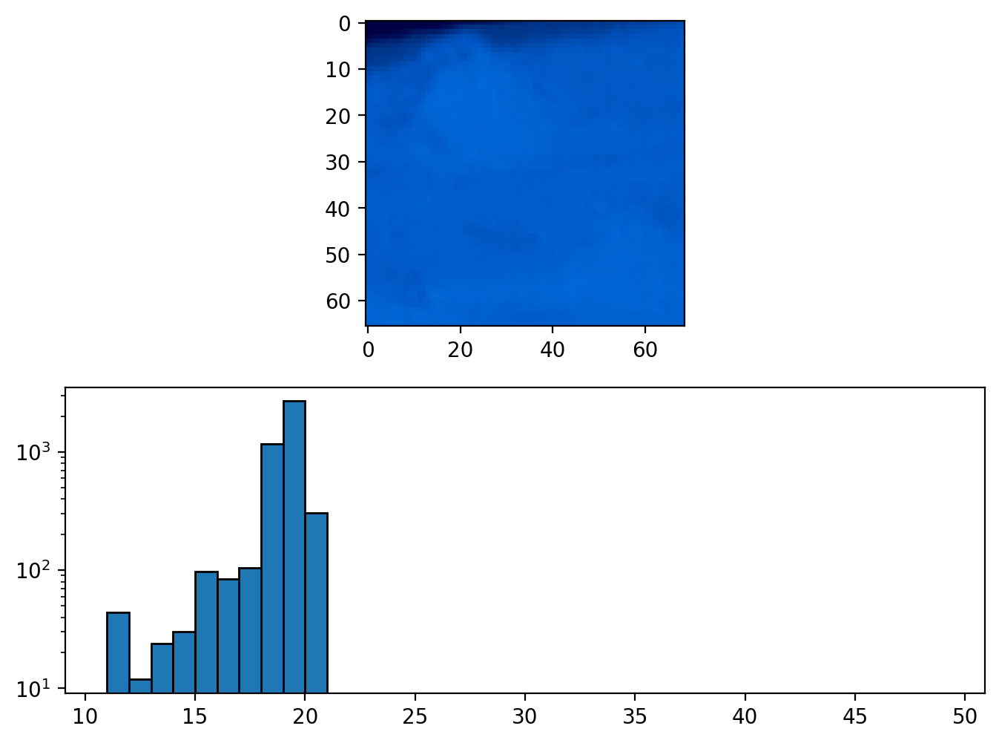

max_temperature: 20
weights: [  44   12   24   30   98   84  105 1163 2689  305    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 305


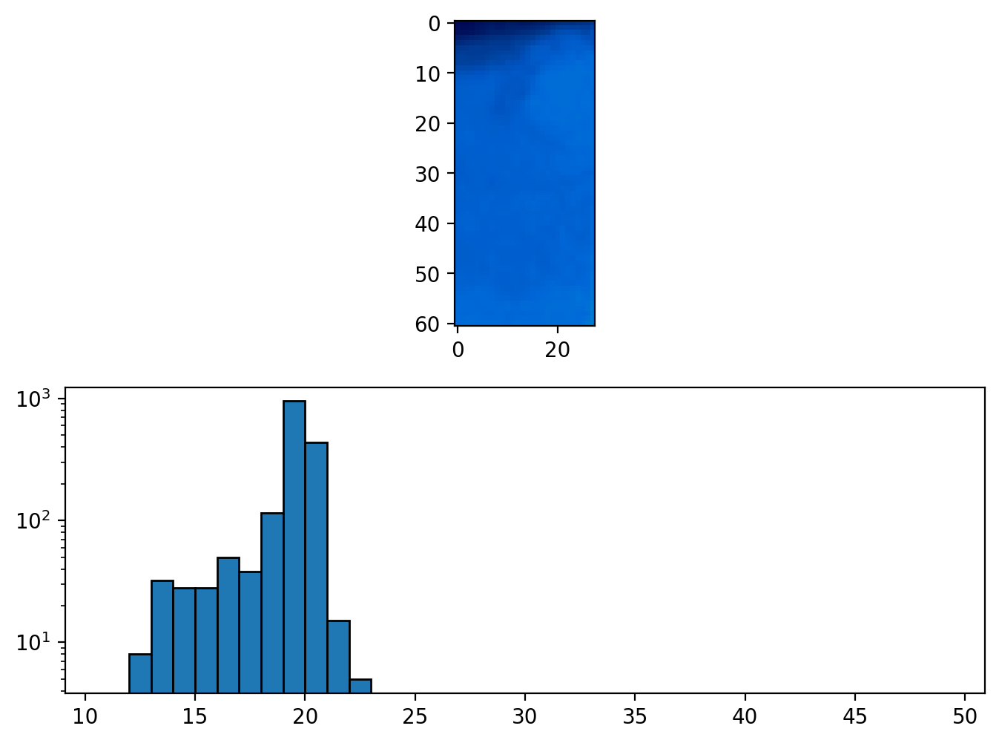

max_temperature: 22
weights: [  0   8  32  28  28  50  38 115 952 437  15   5   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 5


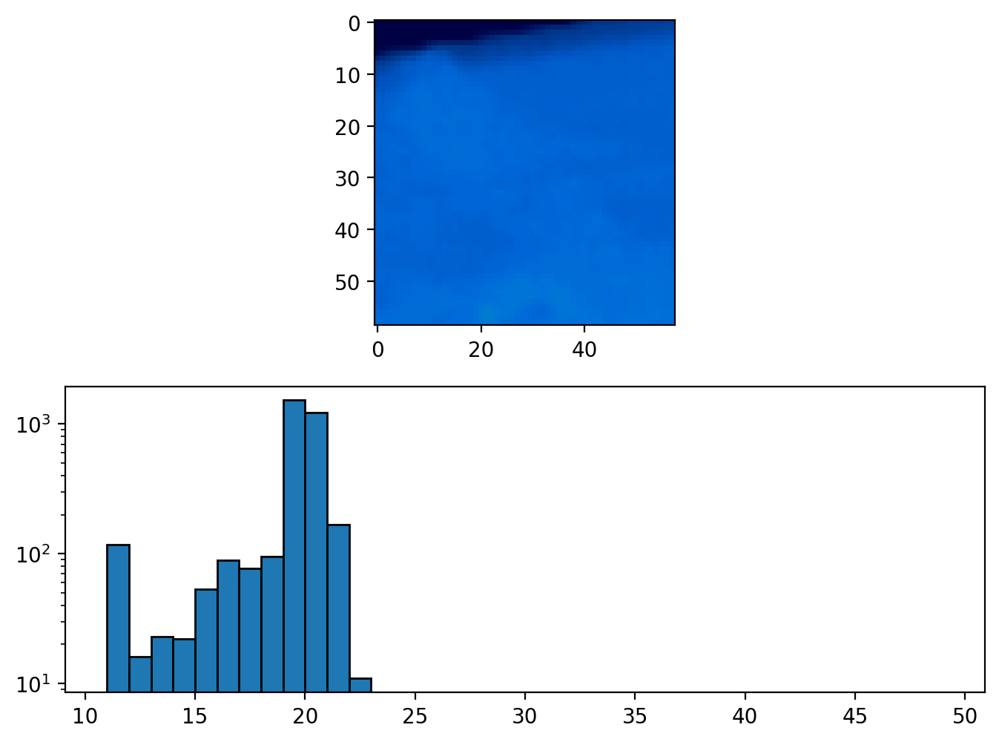

max_temperature: 22
weights: [ 117   16   23   22   53   89   77   95 1525 1227  167   11    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 11


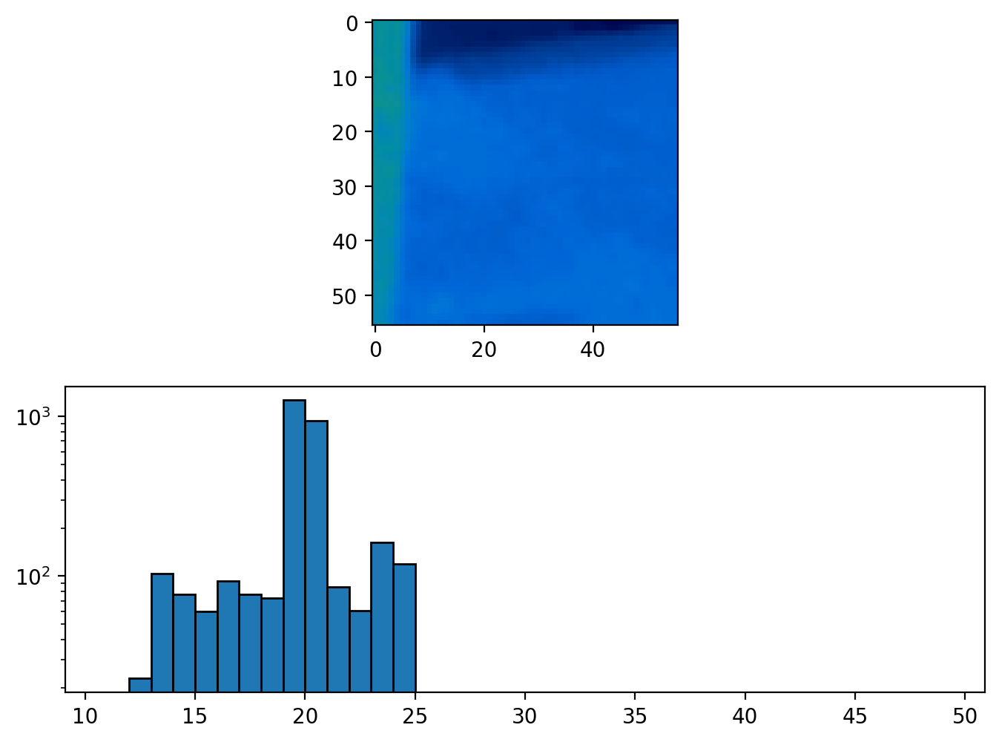

max_temperature: 24
weights: [   0   23  104   77   60   93   77   73 1261  939   86   61  163  119
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 119


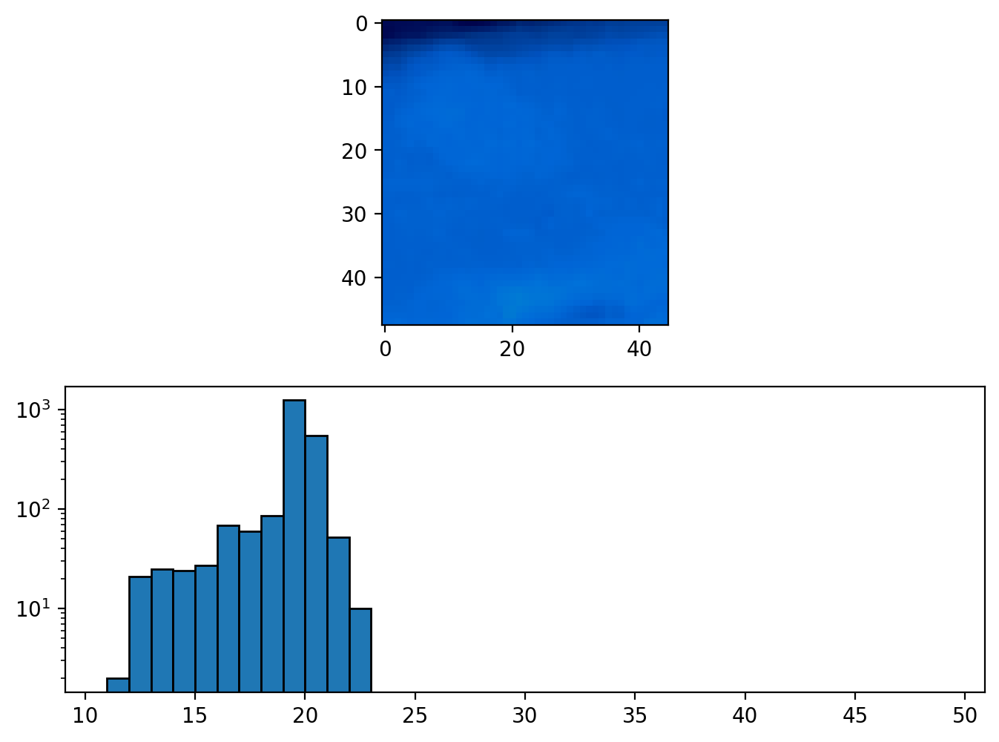

max_temperature: 22
weights: [   2   21   25   24   27   68   60   86 1235  550   52   10    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 10


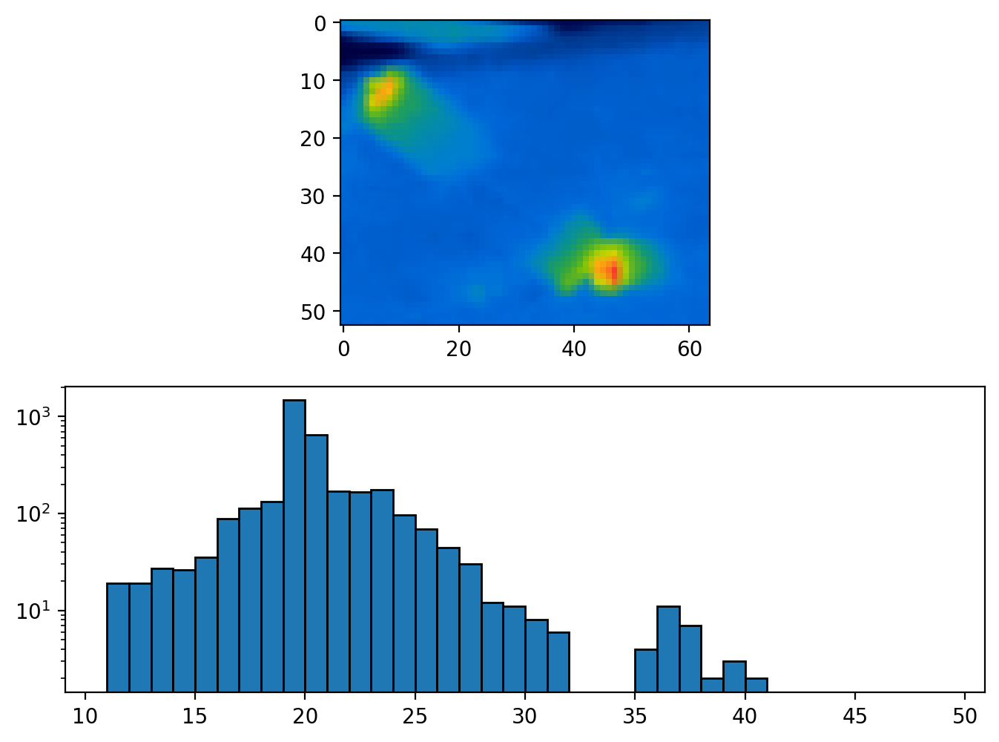

max_temperature: 40
weights: [  19   19   27   26   35   89  113  133 1469  646  170  165  175   97
   69   44   30   12   11    8    6    0    0    0    4   11    7    2
    3    2    0    0    0    0    0    0    0    0]
max_temperature weight: 2


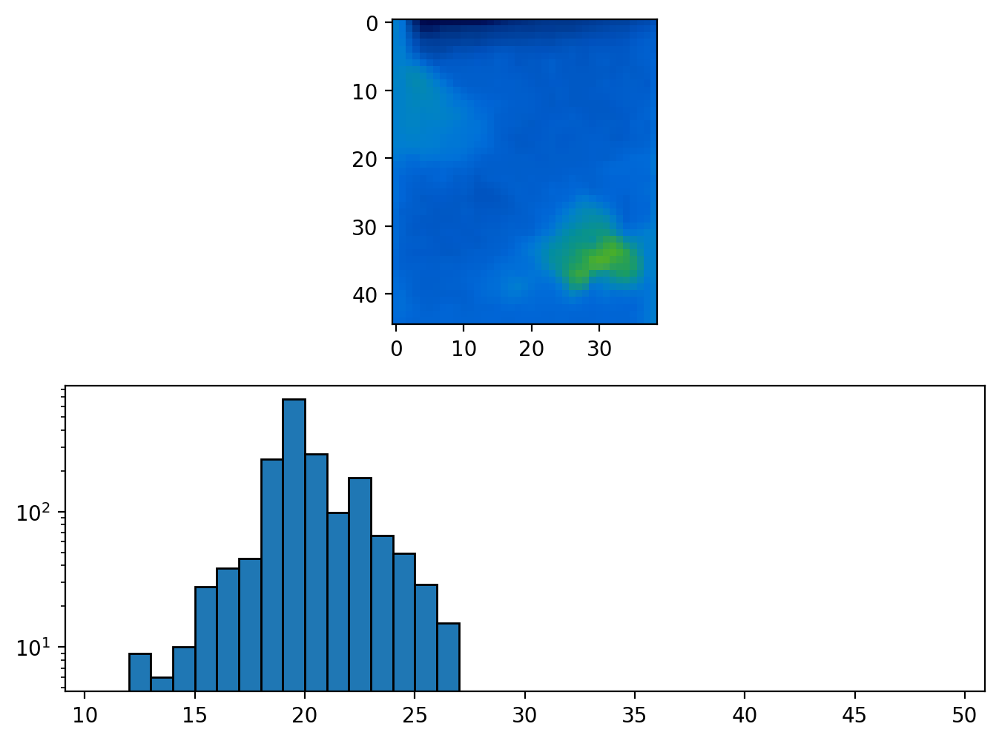

max_temperature: 26
weights: [  0   9   6  10  28  38  45 245 674 265  98 177  67  49  29  15   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 15


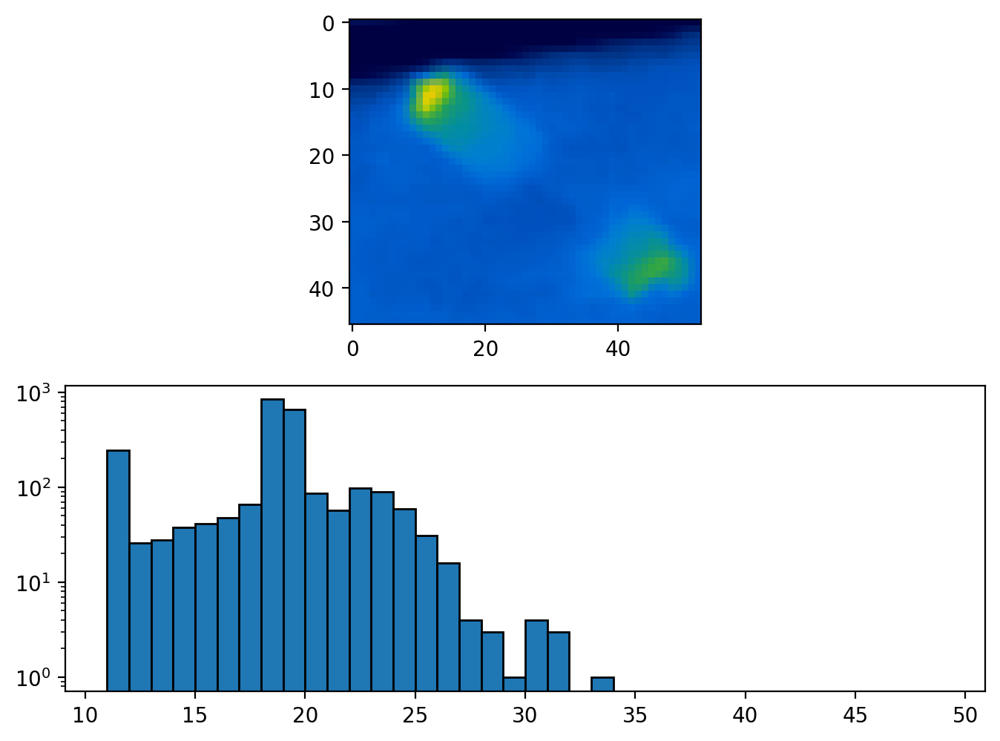

max_temperature: 33
weights: [245  26  28  38  41  48  66 839 655  86  57  97  90  59  31  16   4   3
   1   4   3   0   1   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


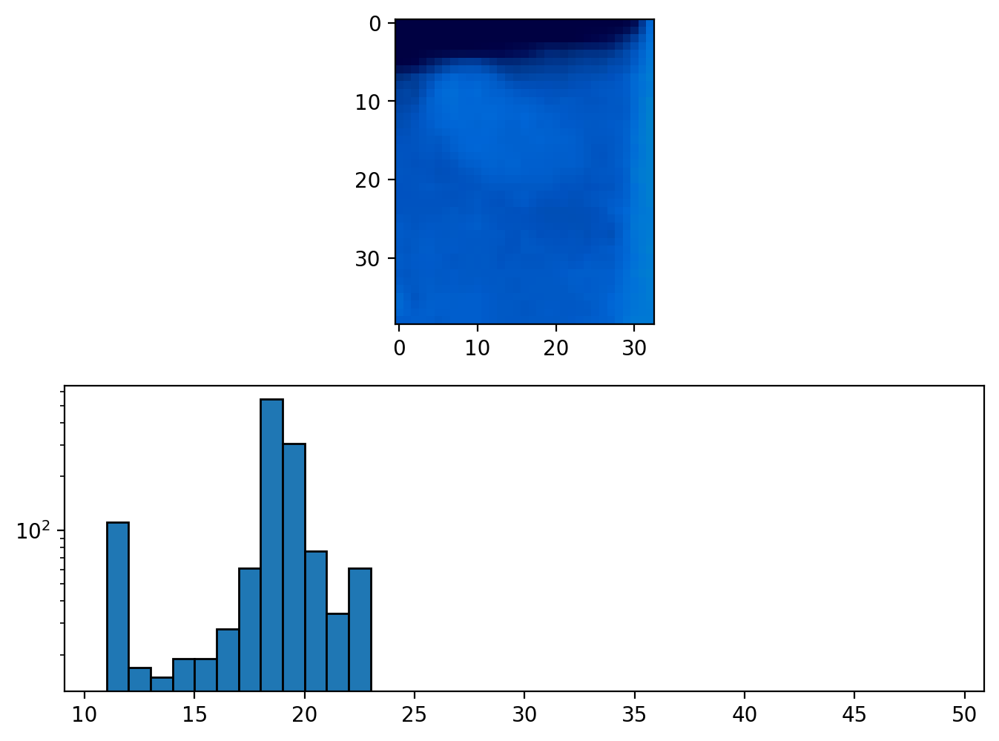

max_temperature: 22
weights: [111  17  15  19  19  28  61 541 305  76  34  61   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 61


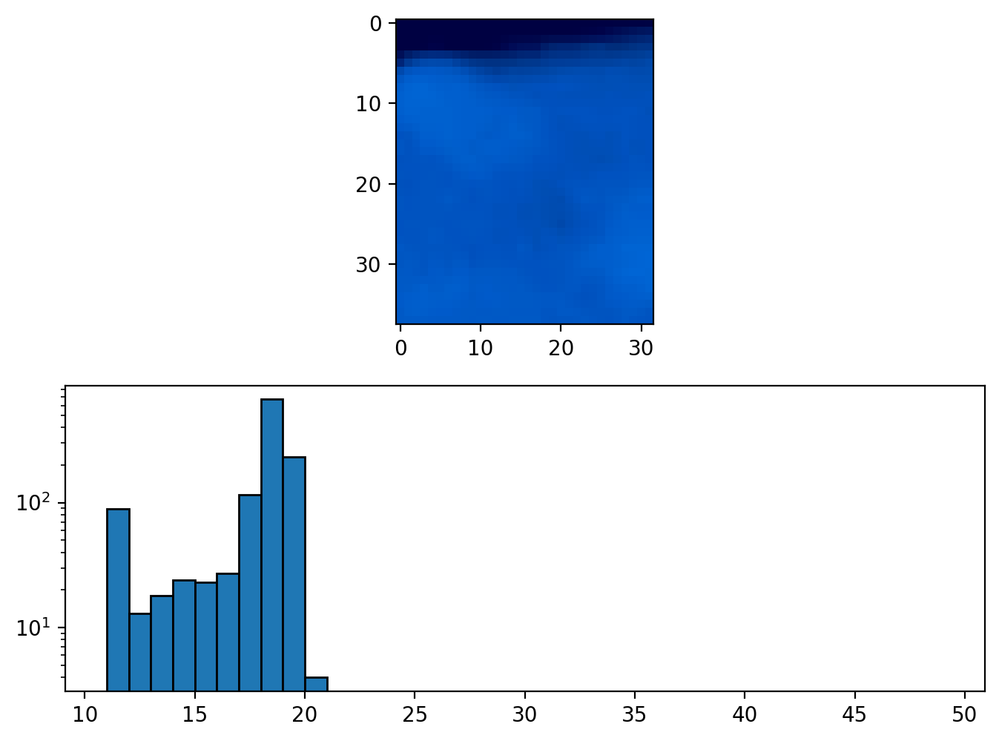

max_temperature: 20
weights: [ 89  13  18  24  23  27 115 670 233   4   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 4


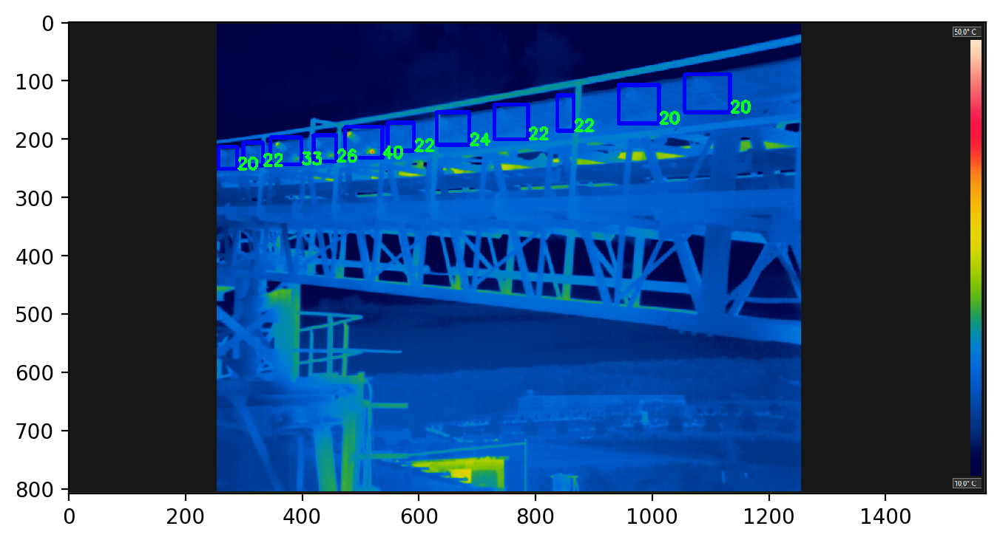

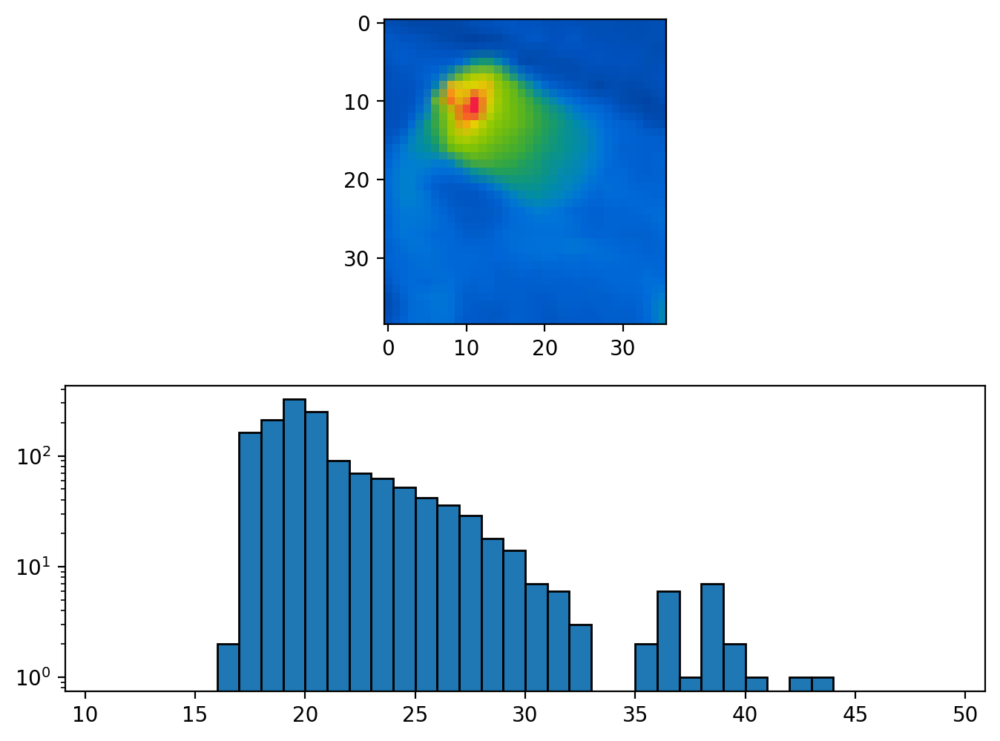

max_temperature: 43
weights: [  0   0   0   0   0   2 163 213 324 250  91  70  63  52  42  36  29  18
  14   7   6   3   0   0   2   6   1   7   2   1   0   1   1   0   0   0
   0   0]
max_temperature weight: 1


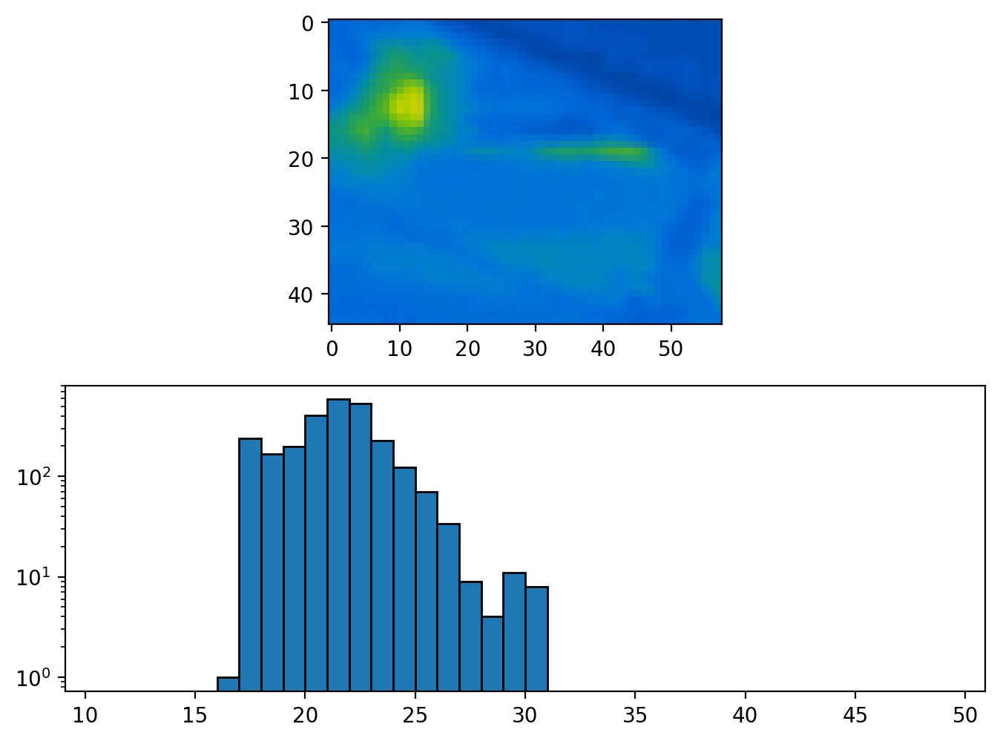

max_temperature: 30
weights: [  0   0   0   0   0   1 239 167 198 406 584 530 227 122  70  34   9   4
  11   8   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 8


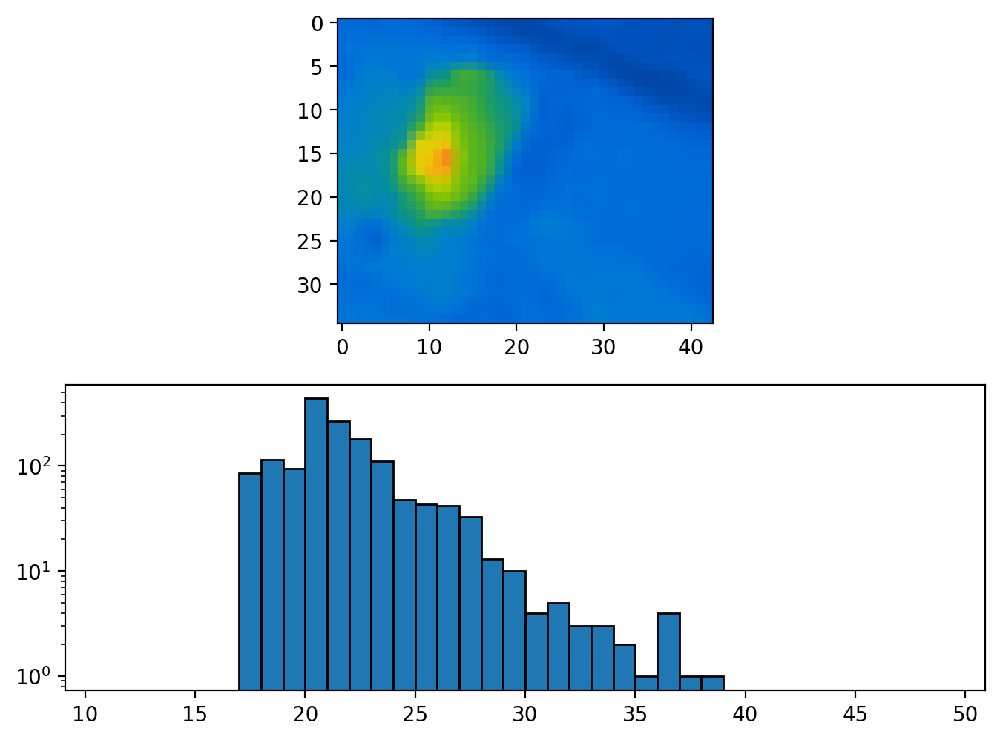

max_temperature: 38
weights: [  0   0   0   0   0   0  86 115  94 438 268 180 111  48  43  42  33  13
  10   4   5   3   3   2   1   4   1   1   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


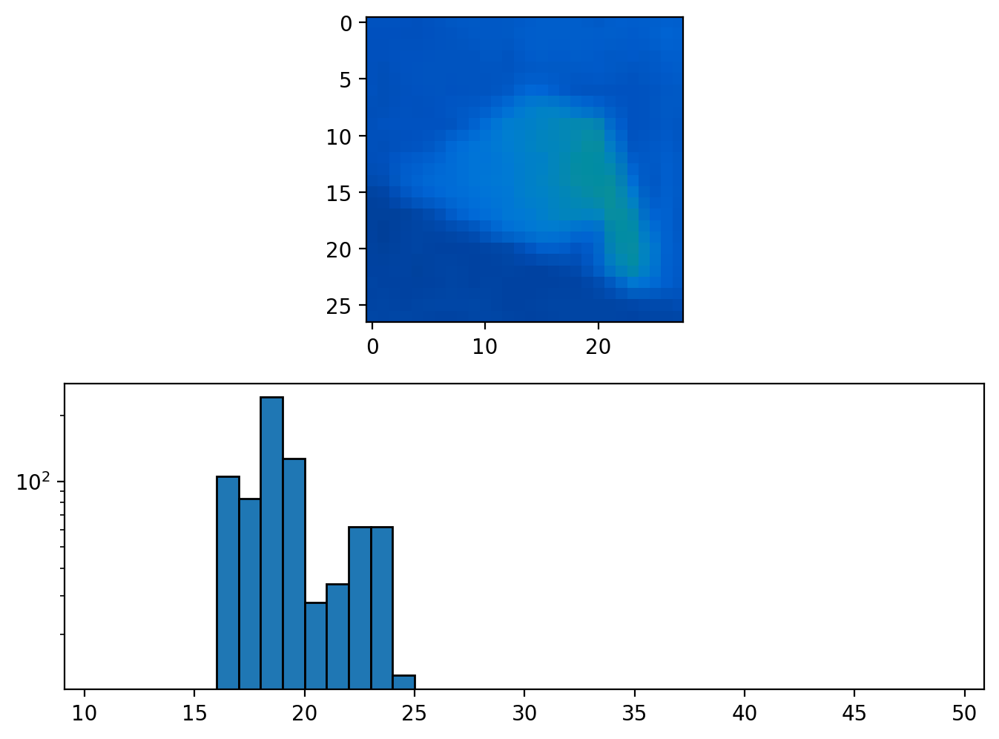

max_temperature: 24
weights: [  0   0   0   0   0 105  83 242 127  28  34  62  62  13   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 13


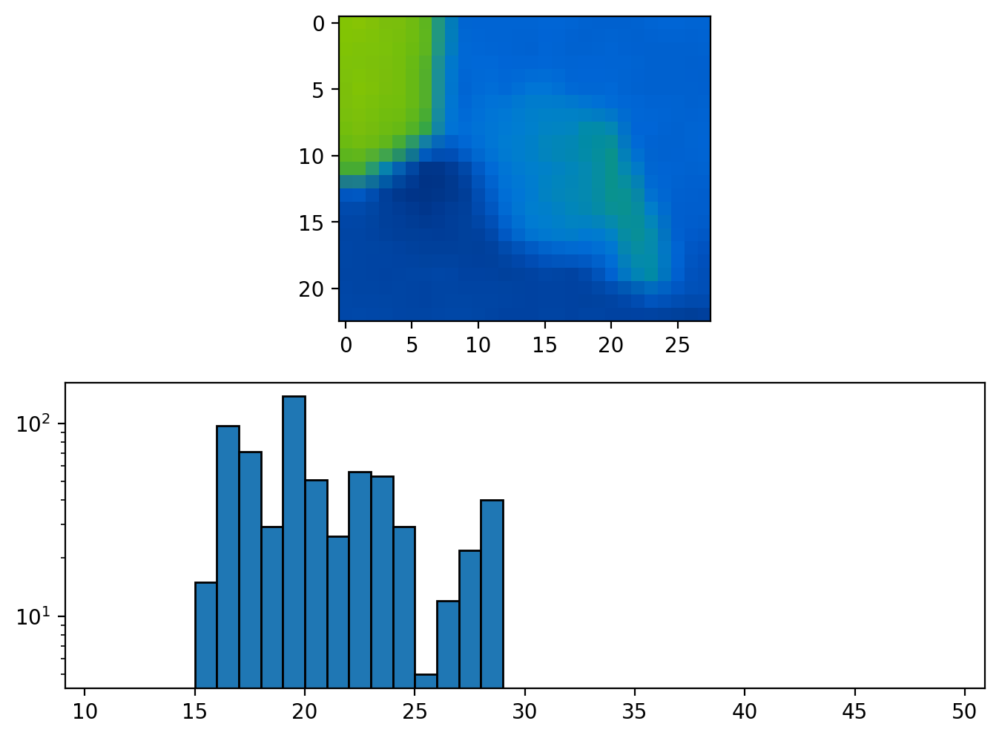

max_temperature: 28
weights: [  0   0   0   0  15  97  71  29 138  51  26  56  53  29   5  12  22  40
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 40


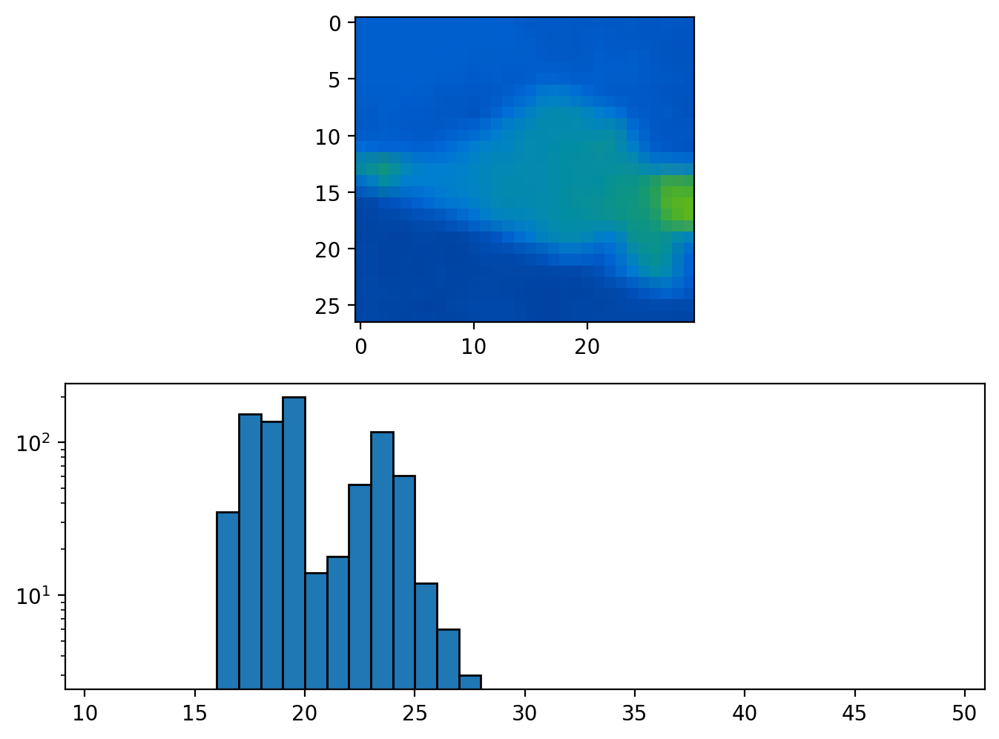

max_temperature: 27
weights: [  0   0   0   0   0  35 154 138 198  14  18  53 118  61  12   6   3   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 3


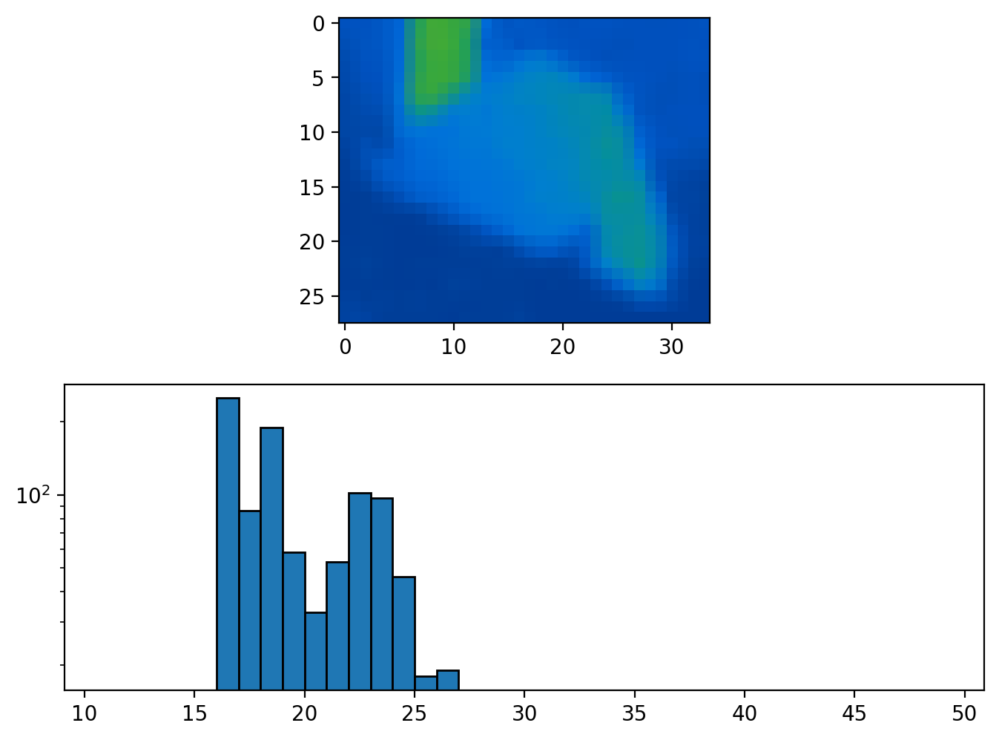

max_temperature: 26
weights: [  0   0   0   0   0 250  86 190  58  33  53 102  97  46  18  19   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 19


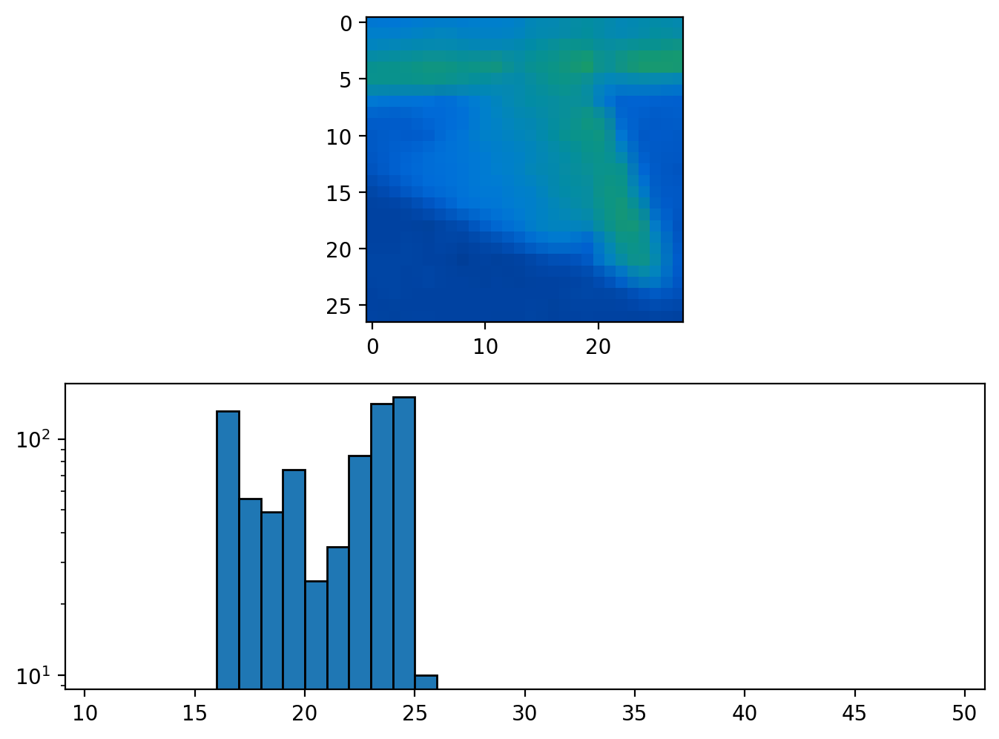

max_temperature: 25
weights: [  0   0   0   0   0 131  56  49  74  25  35  85 141 150  10   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 10


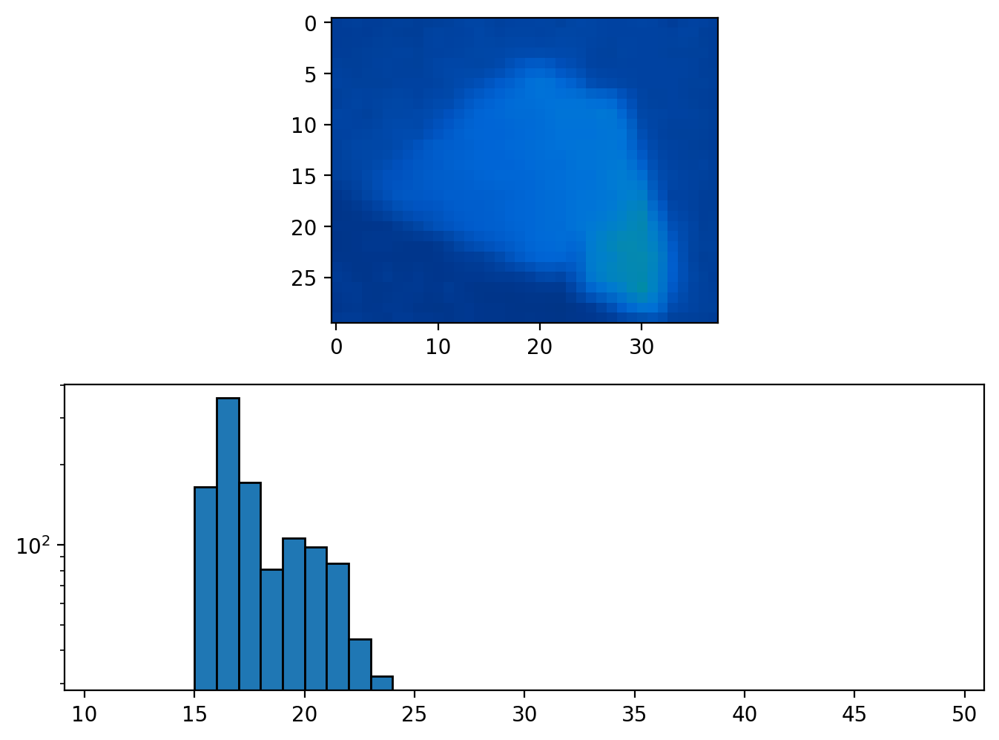

max_temperature: 23
weights: [  0   0   0   0 165 357 172  81 106  98  85  44  32   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 32


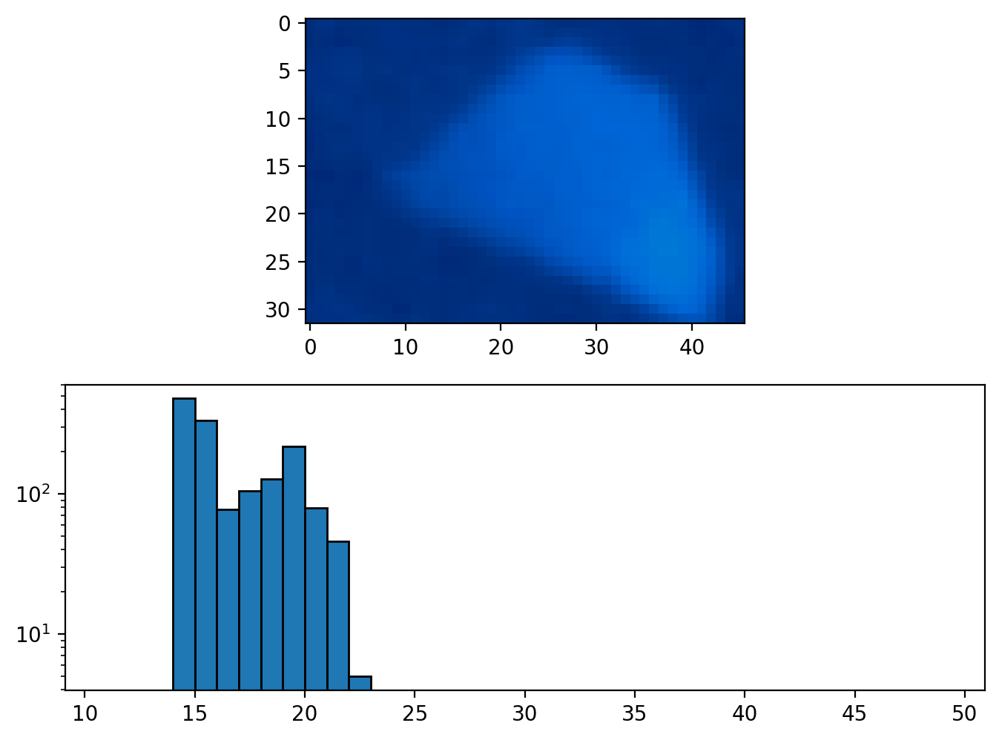

max_temperature: 22
weights: [  0   0   0 479 336  77 105 127 218  79  46   5   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 5


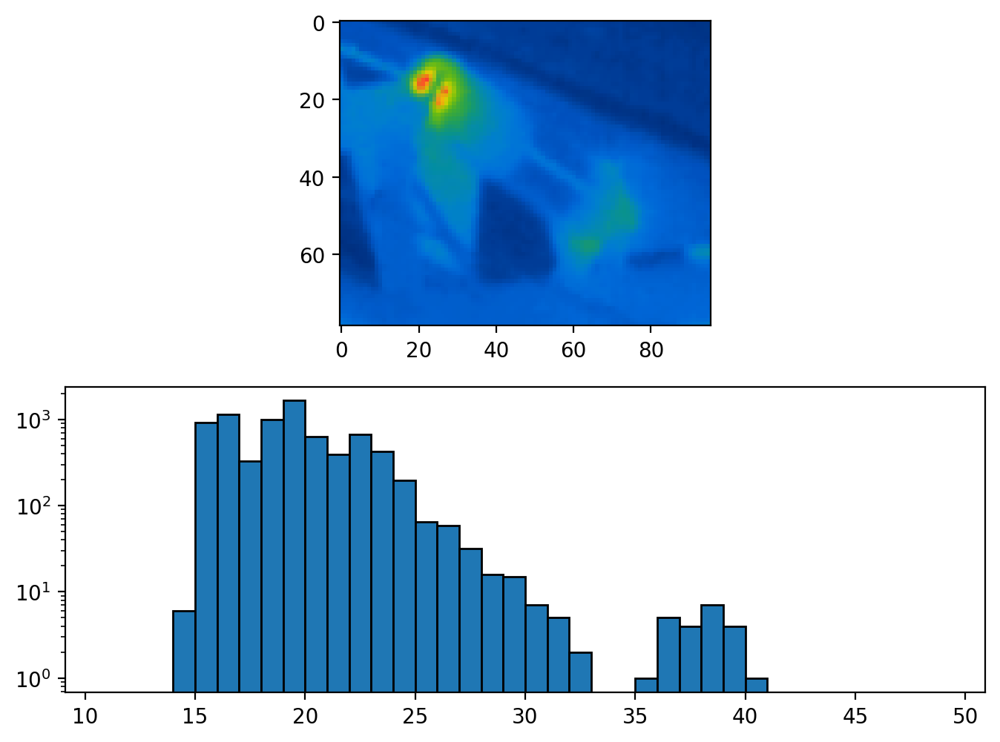

max_temperature: 40
weights: [   0    0    0    6  917 1153  326  986 1649  632  395  674  425  198
   65   59   32   16   15    7    5    2    0    0    1    5    4    7
    4    1    0    0    0    0    0    0    0    0]
max_temperature weight: 1


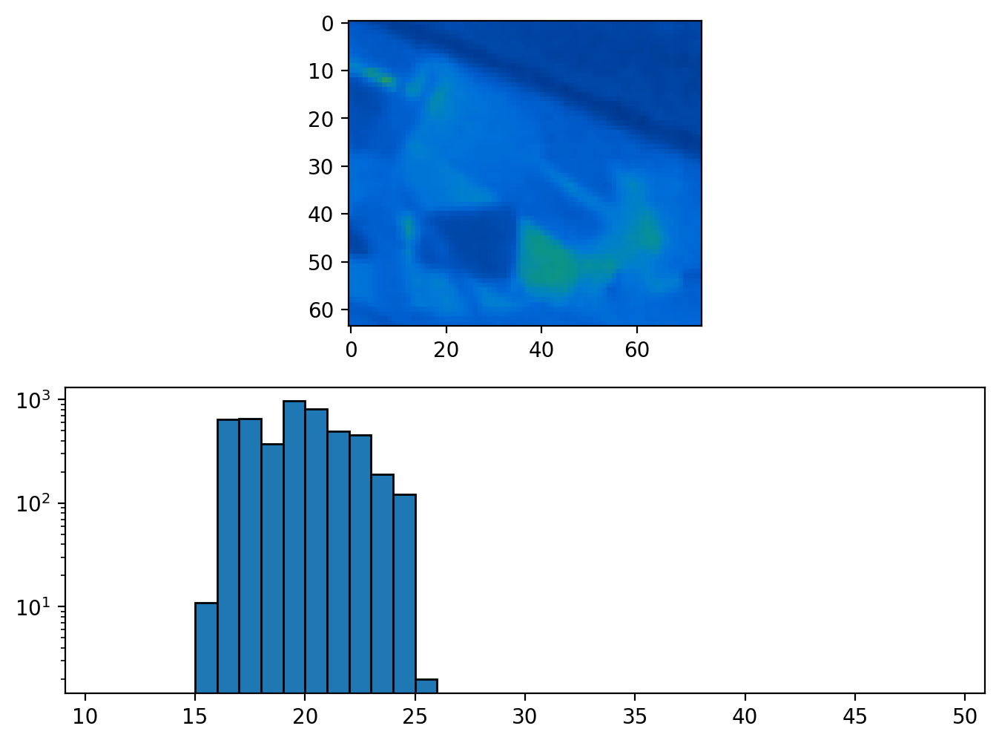

max_temperature: 25
weights: [  0   0   0   0  11 644 661 374 968 816 496 453 190 121   2   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 2


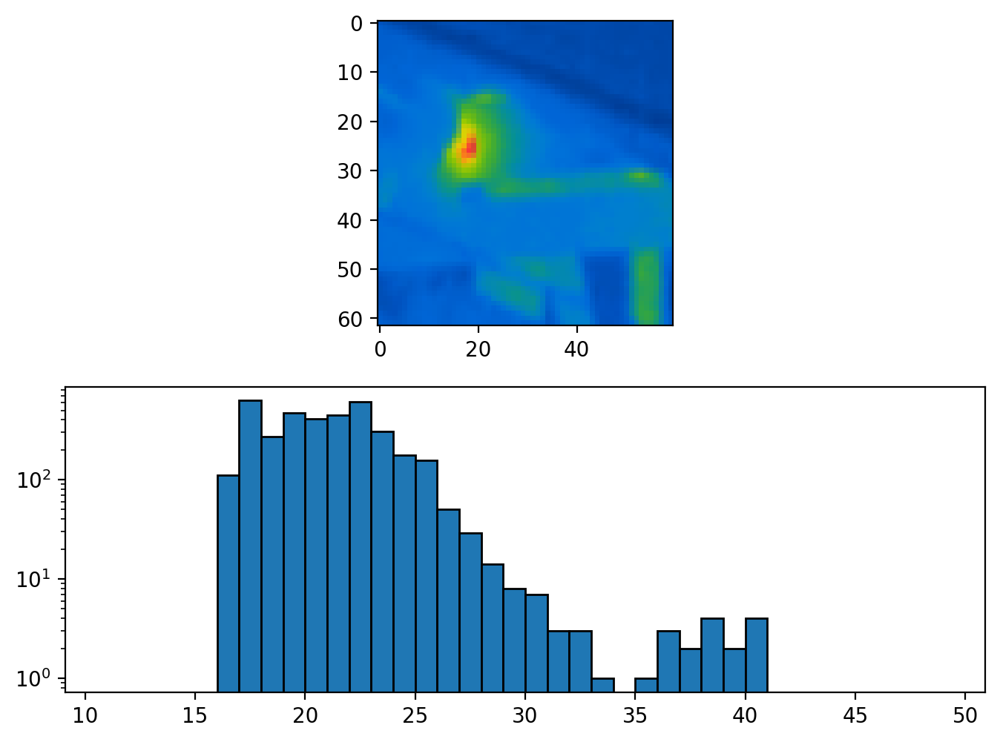

max_temperature: 40
weights: [  0   0   0   0   0 112 626 271 475 413 446 606 306 177 157  50  29  14
   8   7   3   3   1   0   1   3   2   4   2   4   0   0   0   0   0   0
   0   0]
max_temperature weight: 4


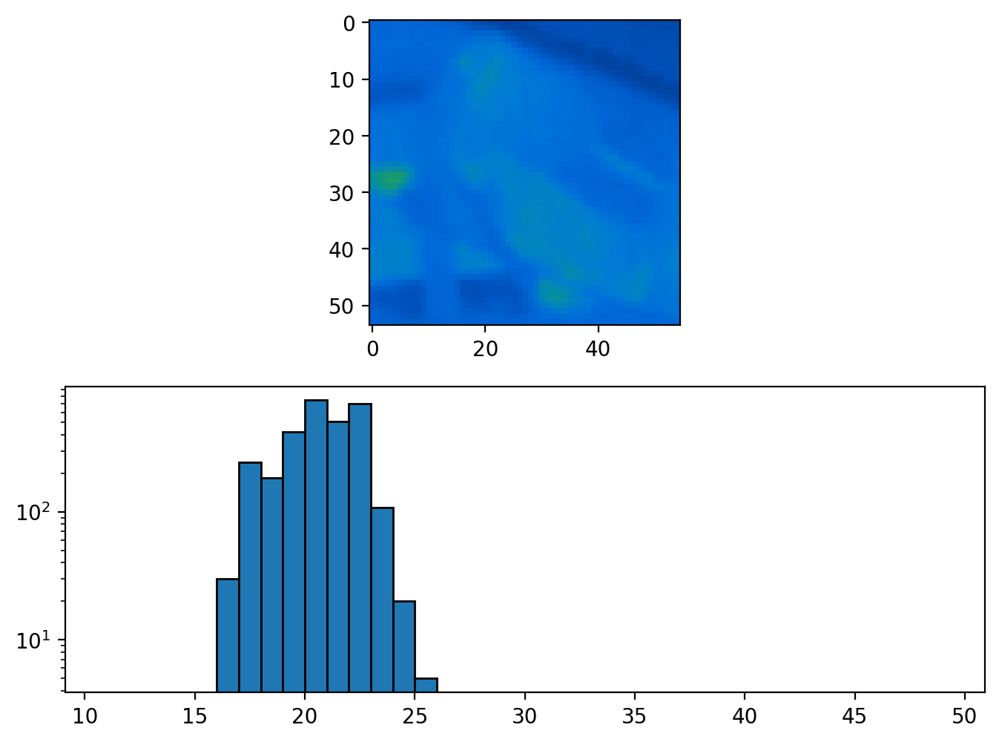

max_temperature: 25
weights: [  0   0   0   0   0  30 244 185 422 745 511 700 108  20   5   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 5


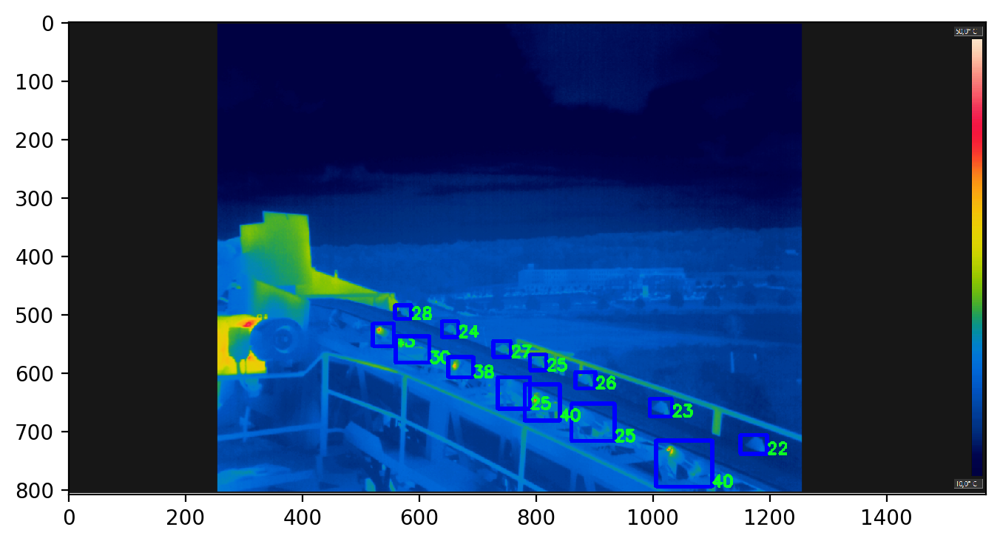

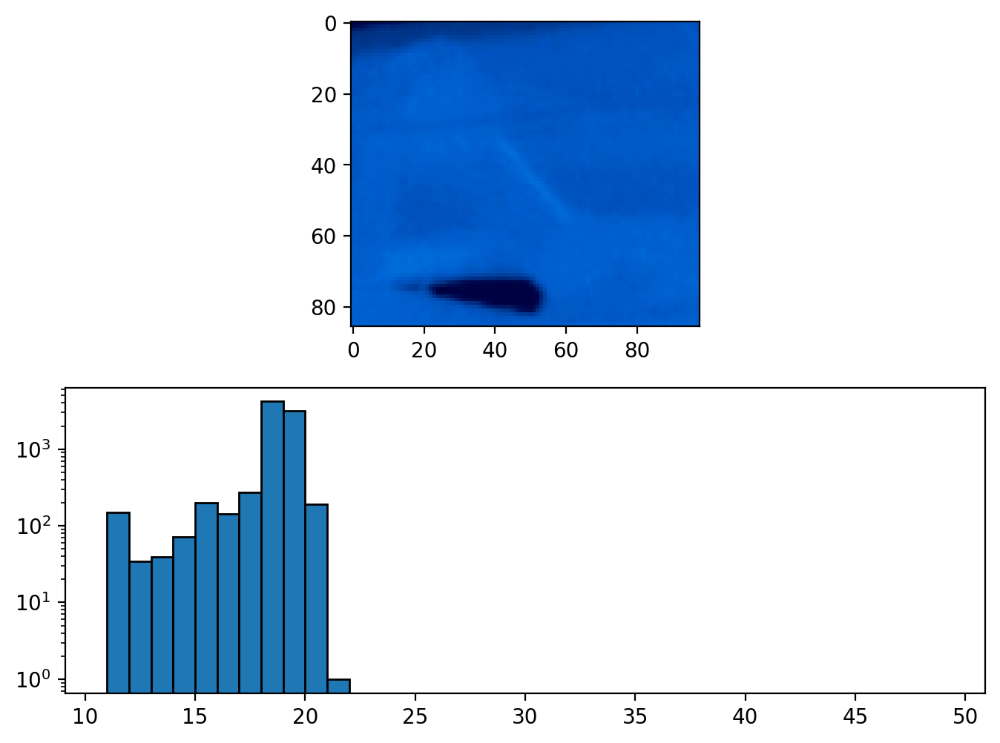

max_temperature: 21
weights: [ 149   34   39   72  200  143  272 4179 3149  190    1    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1


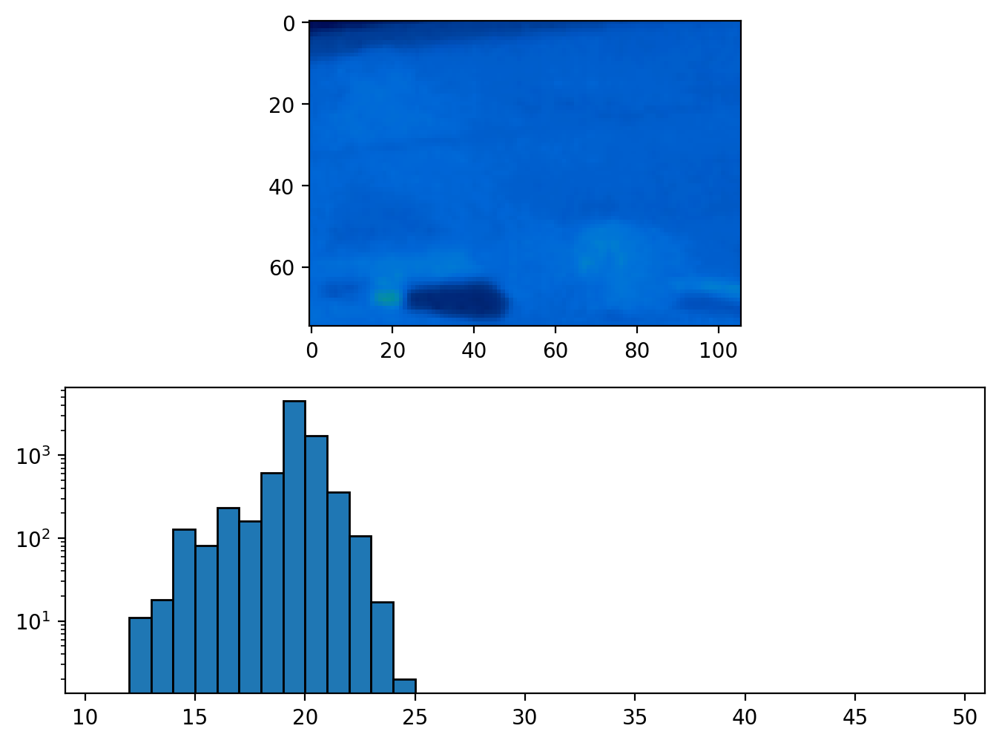

max_temperature: 24
weights: [   0   11   18  128   82  233  161  616 4487 1727  362  106   17    2
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


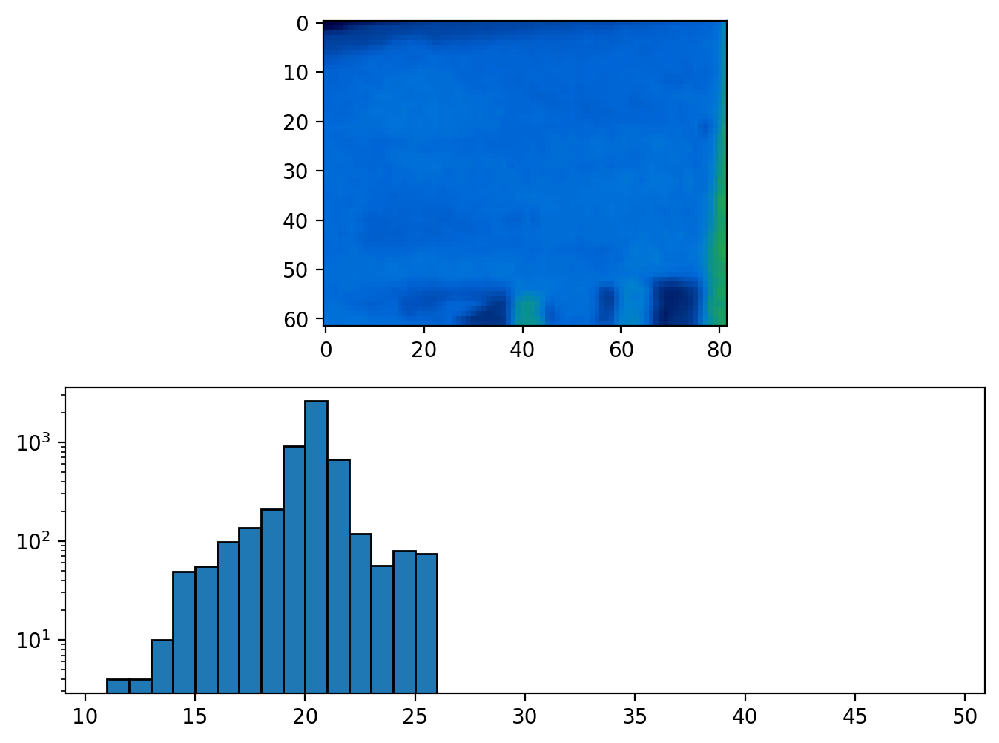

max_temperature: 25
weights: [   4    4   10   49   55   98  137  211  918 2607  664  118   56   79
   74    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 74


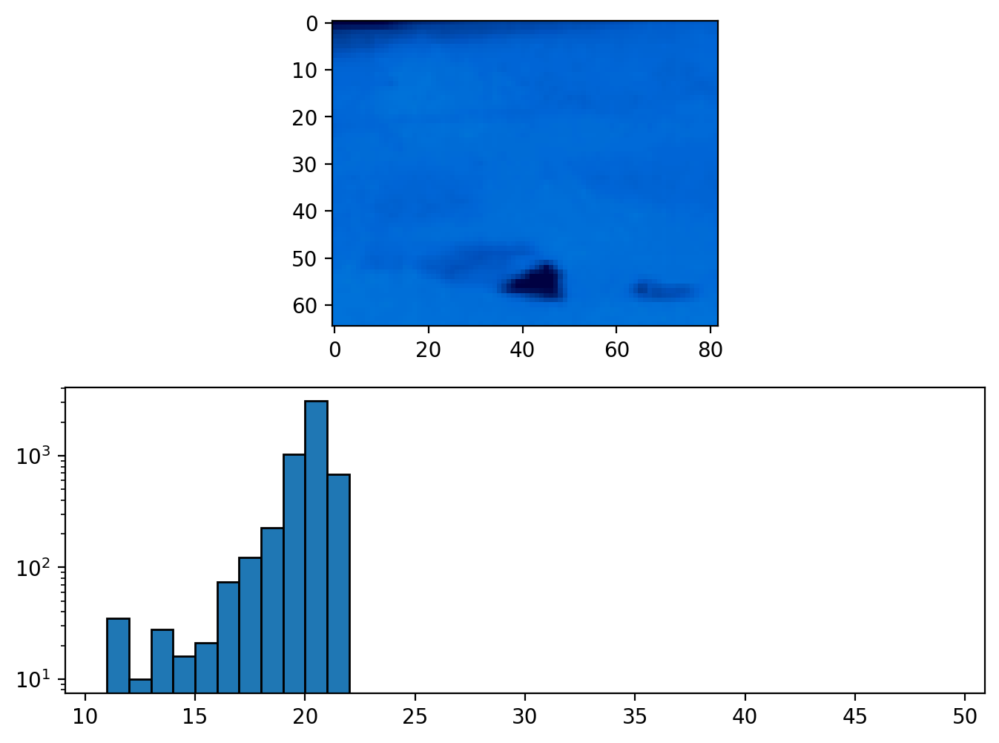

max_temperature: 21
weights: [  35   10   28   16   21   74  122  226 1028 3084  686    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 686


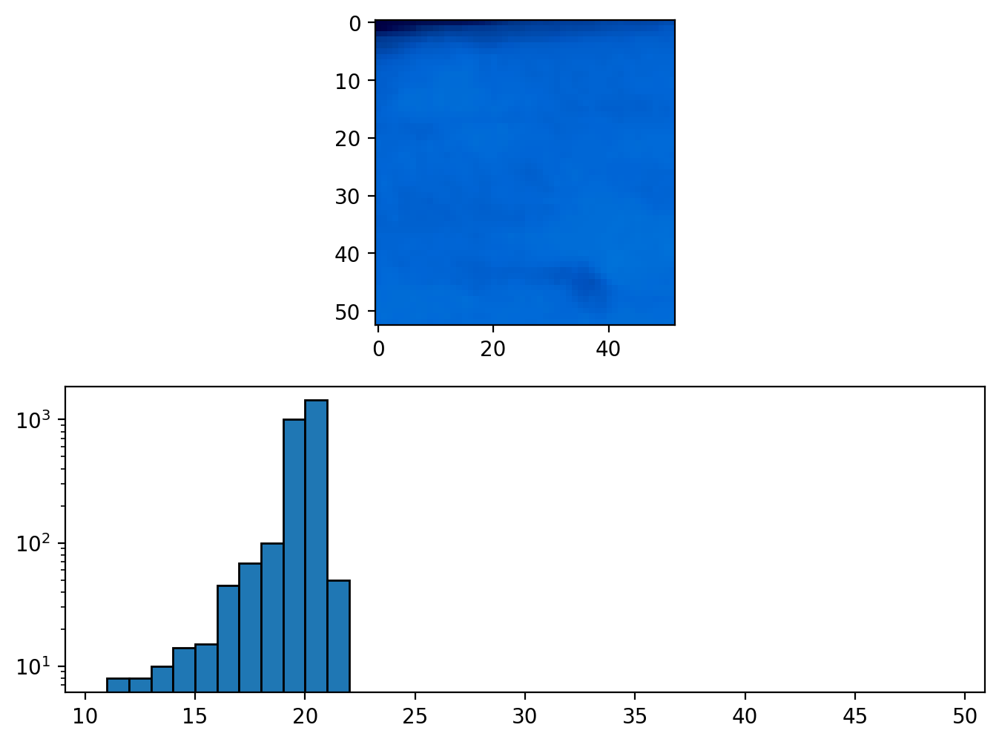

max_temperature: 21
weights: [   8    8   10   14   15   45   68   99 1005 1434   50    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 50


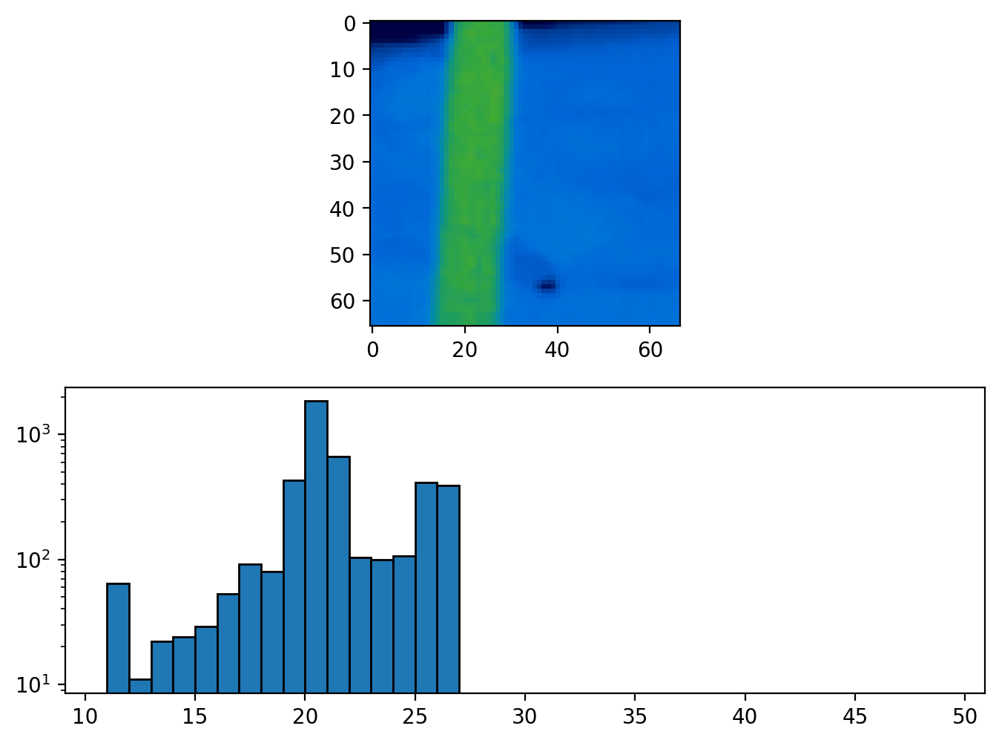

max_temperature: 26
weights: [  64   11   22   24   29   53   91   80  429 1845  663  103   99  106
  411  392    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 392


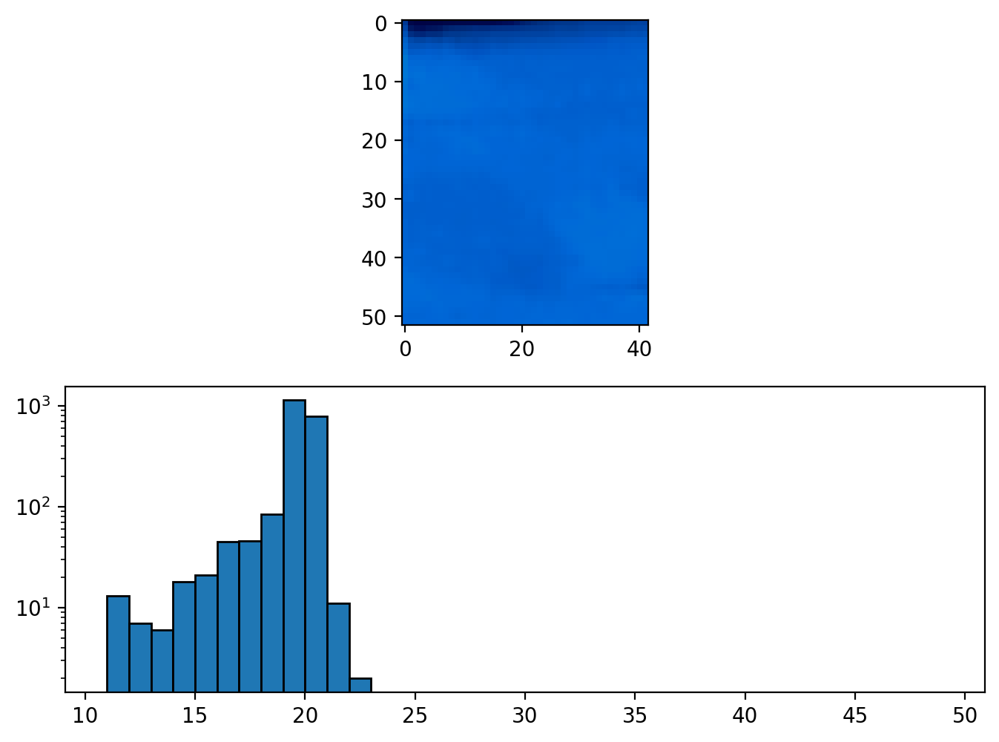

max_temperature: 22
weights: [  13    7    6   18   21   45   46   85 1136  794   11    2    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


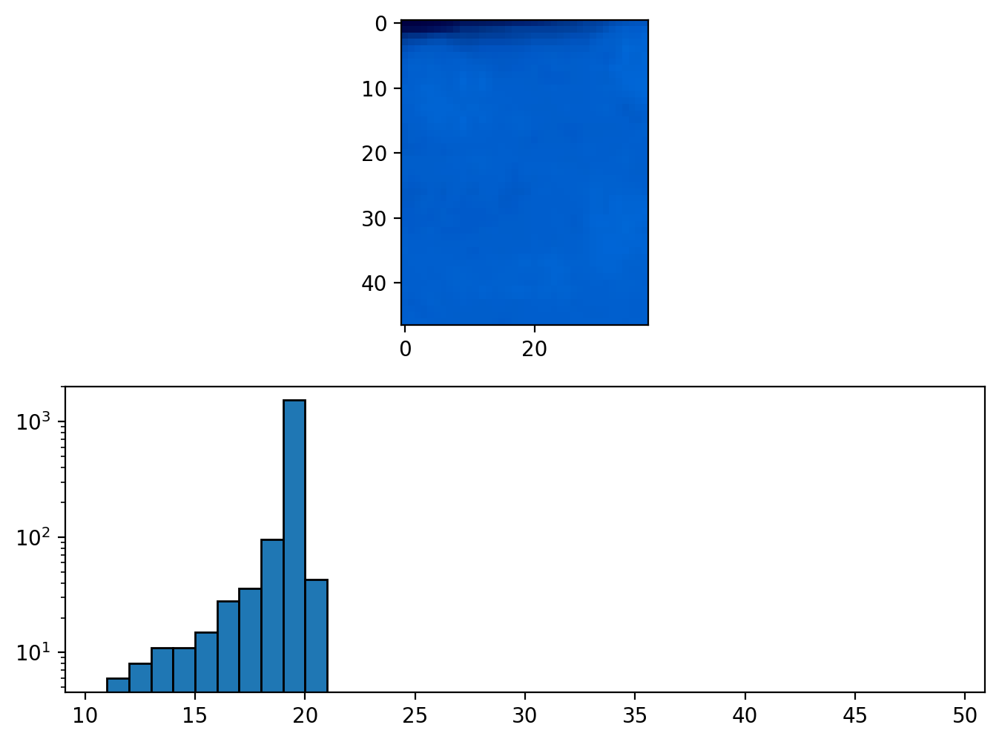

max_temperature: 20
weights: [   6    8   11   11   15   28   36   96 1532   43    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 43


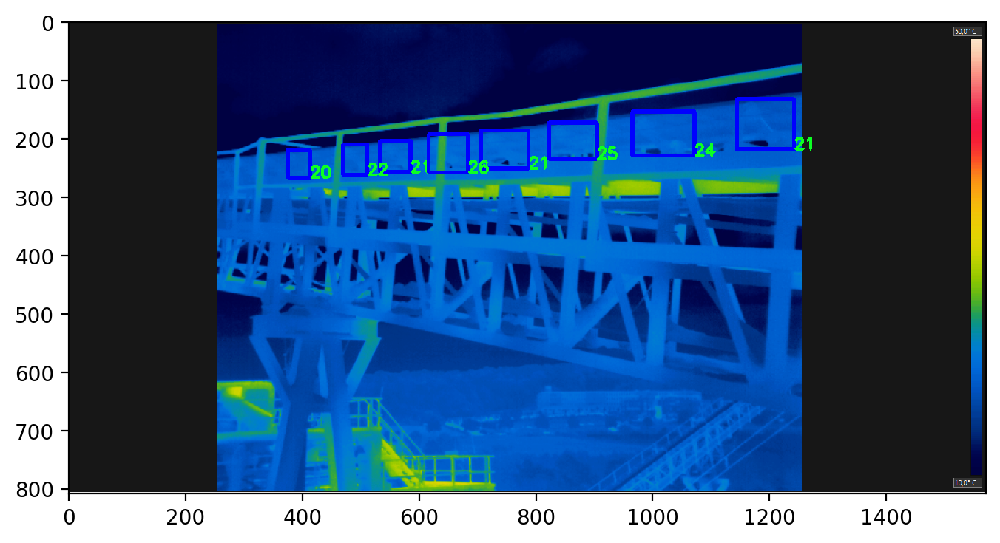

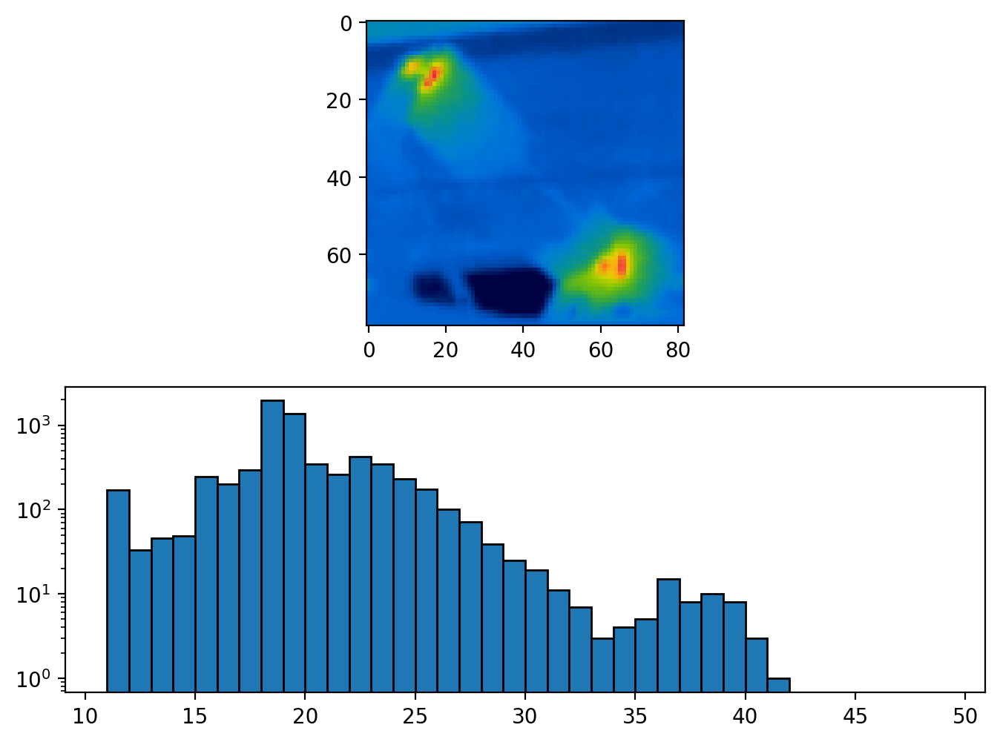

max_temperature: 41
weights: [ 169   33   46   49  244  200  295 1956 1372  345  263  421  349  232
  173  101   72   39   25   19   11    7    3    4    5   15    8   10
    8    3    1    0    0    0    0    0    0    0]
max_temperature weight: 1


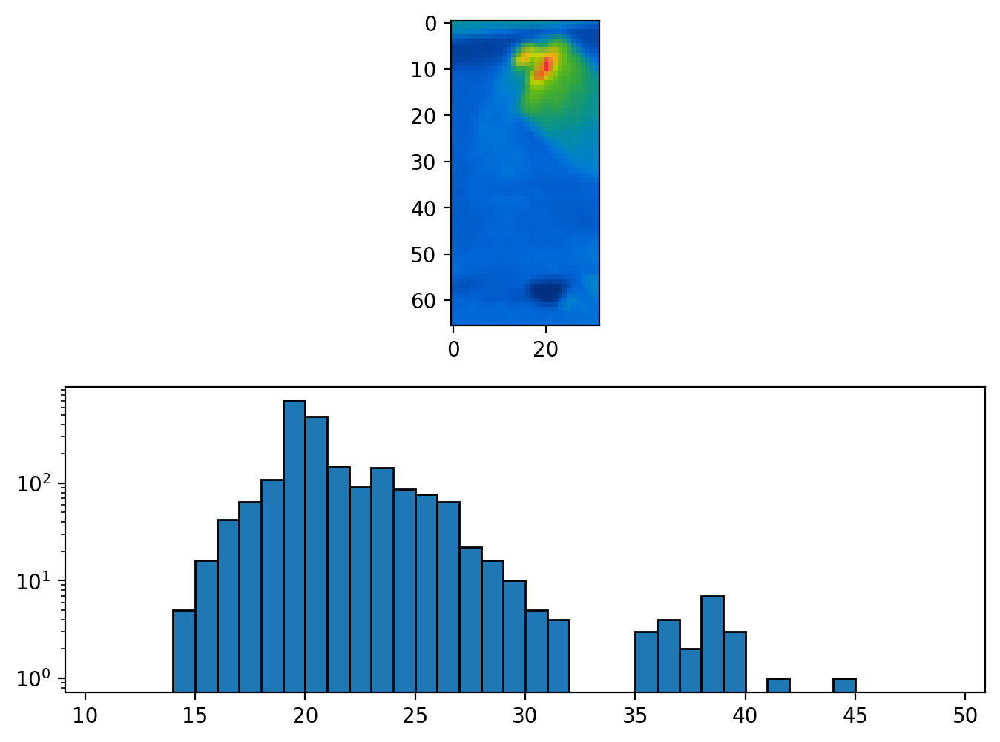

max_temperature: 44
weights: [  0   0   0   5  16  42  64 108 703 484 150  91 143  87  77  64  22  16
  10   5   4   0   0   0   3   4   2   7   3   0   1   0   0   1   0   0
   0   0]
max_temperature weight: 1


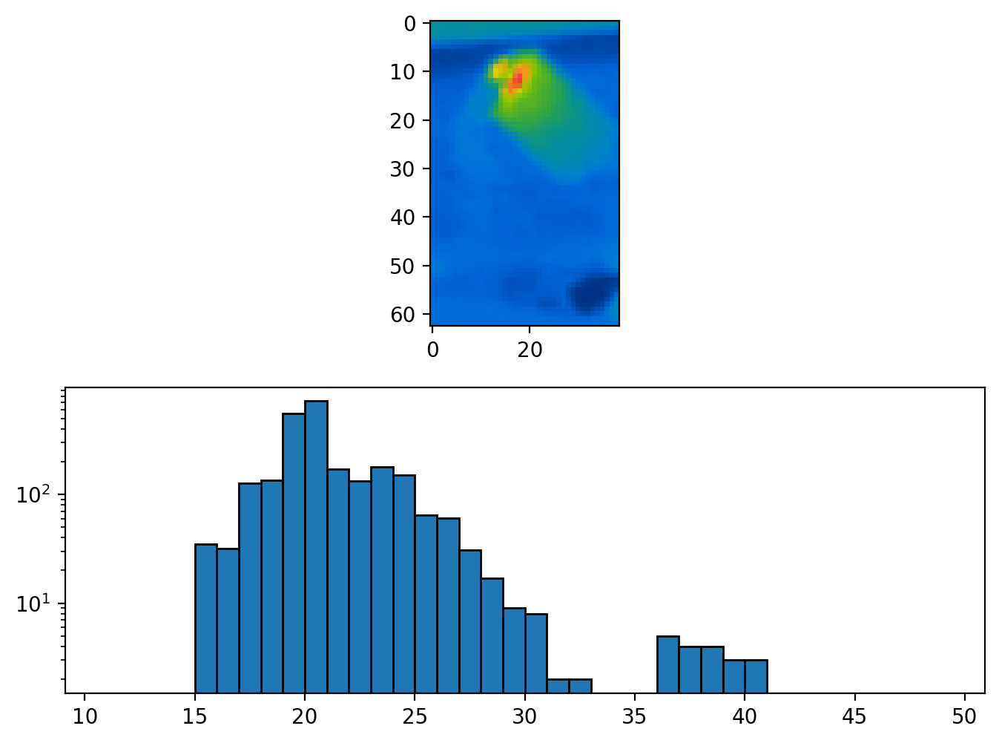

max_temperature: 40
weights: [  0   0   0   0  35  32 126 136 560 722 170 132 180 150  65  61  31  17
   9   8   2   2   0   0   0   5   4   4   3   3   0   0   0   0   0   0
   0   0]
max_temperature weight: 3


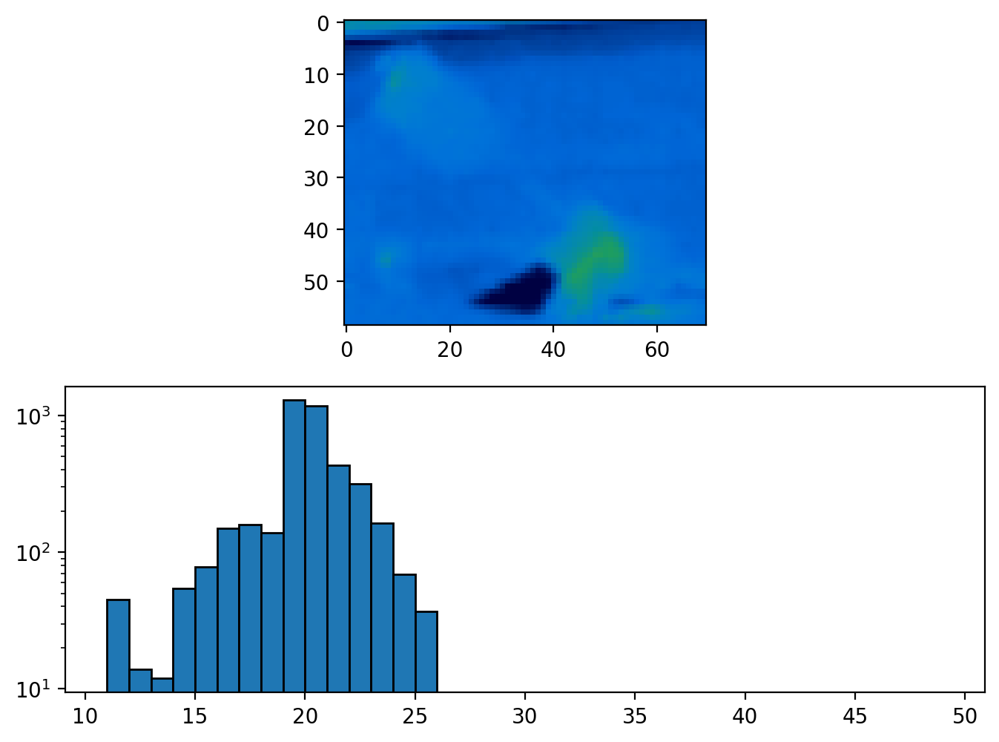

max_temperature: 25
weights: [  45   14   12   54   78  150  159  139 1291 1173  430  315  164   69
   37    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 37


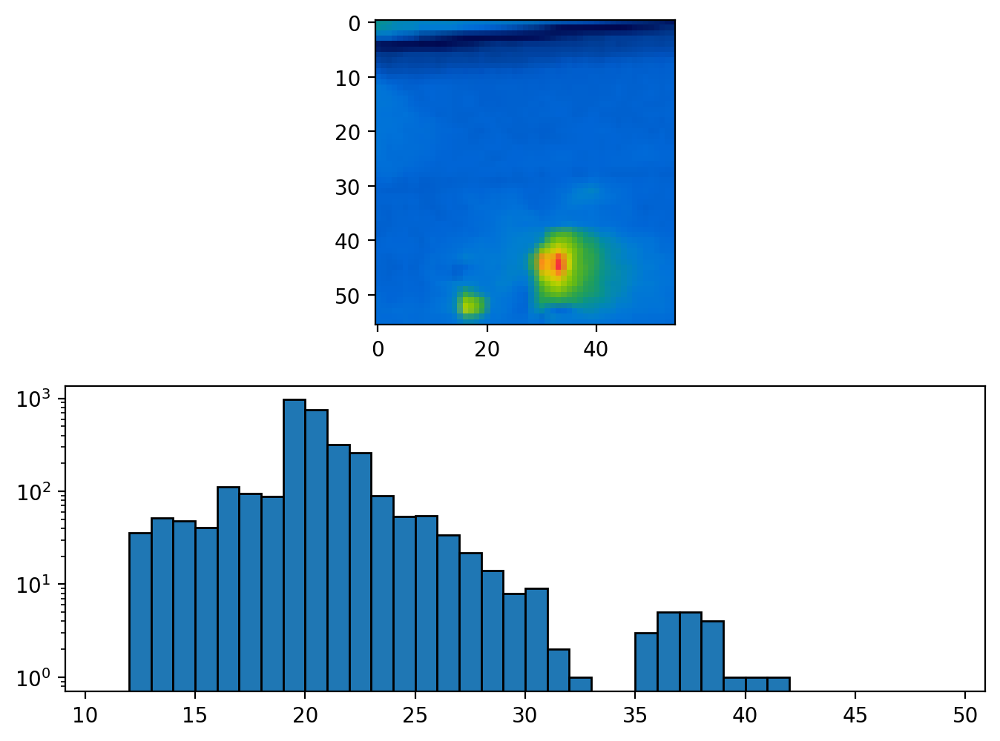

max_temperature: 41
weights: [  0  36  52  48  41 112  94  88 968 757 318 258  89  54  55  34  22  14
   8   9   2   1   0   0   3   5   5   4   1   1   1   0   0   0   0   0
   0   0]
max_temperature weight: 1


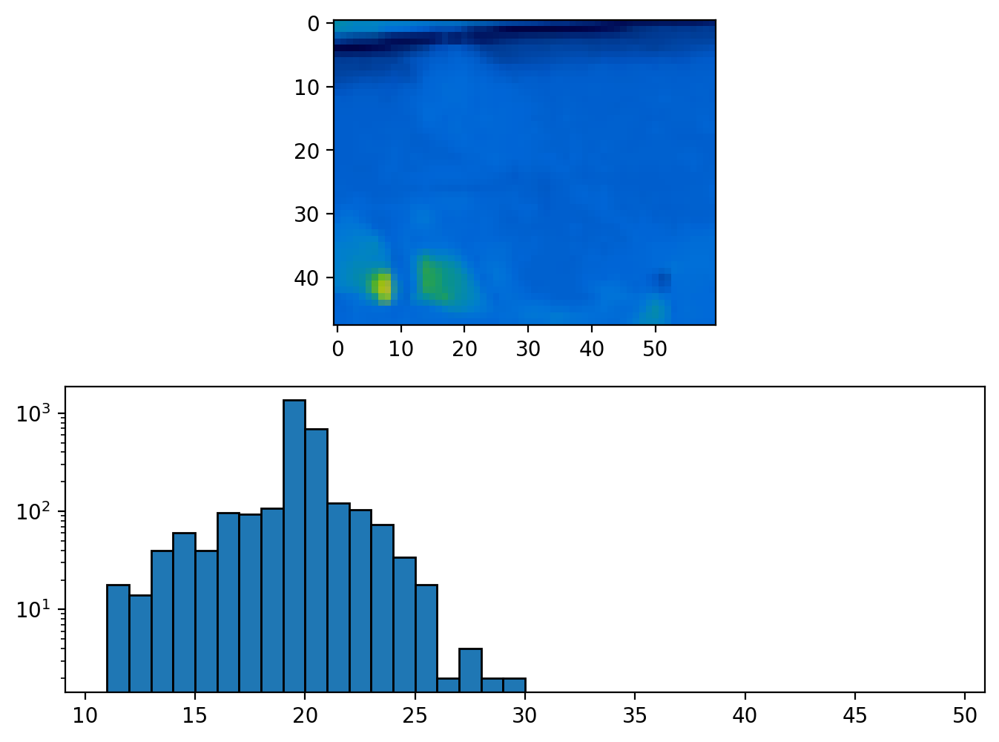

max_temperature: 29
weights: [  18   14   40   61   40   96   94  108 1354  694  122  104   73   34
   18    2    4    2    2    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


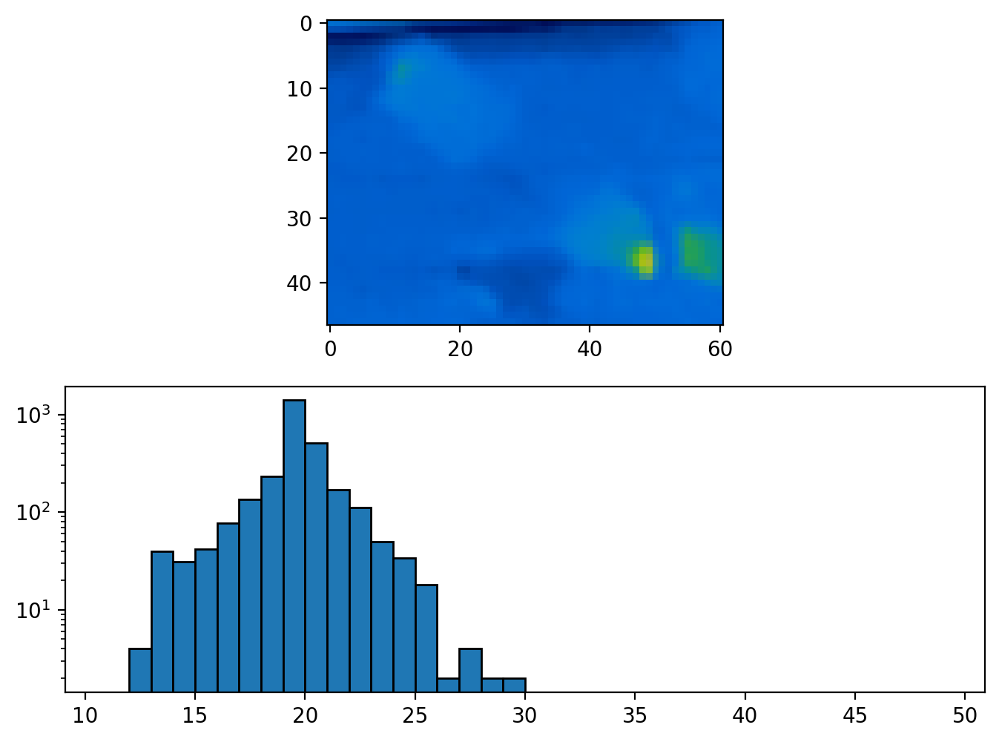

max_temperature: 29
weights: [   0    4   40   31   42   77  135  234 1397  512  171  112   50   34
   18    2    4    2    2    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 2


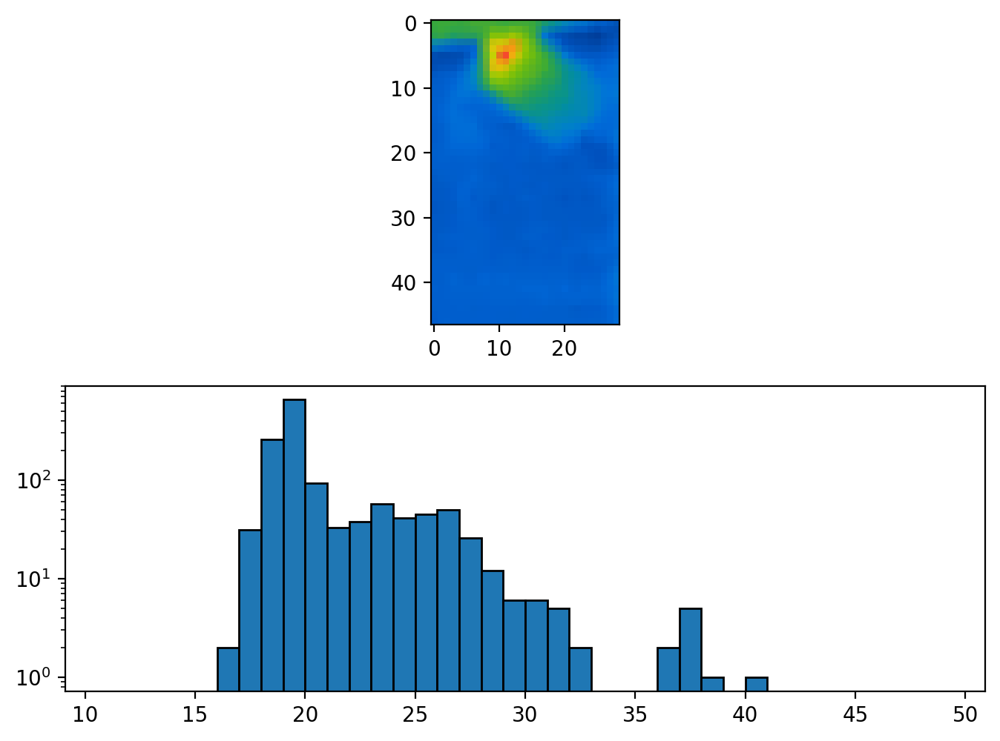

max_temperature: 40
weights: [  0   0   0   0   0   2  31 256 651  93  33  38  57  41  45  50  26  12
   6   6   5   2   0   0   0   2   5   1   0   1   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


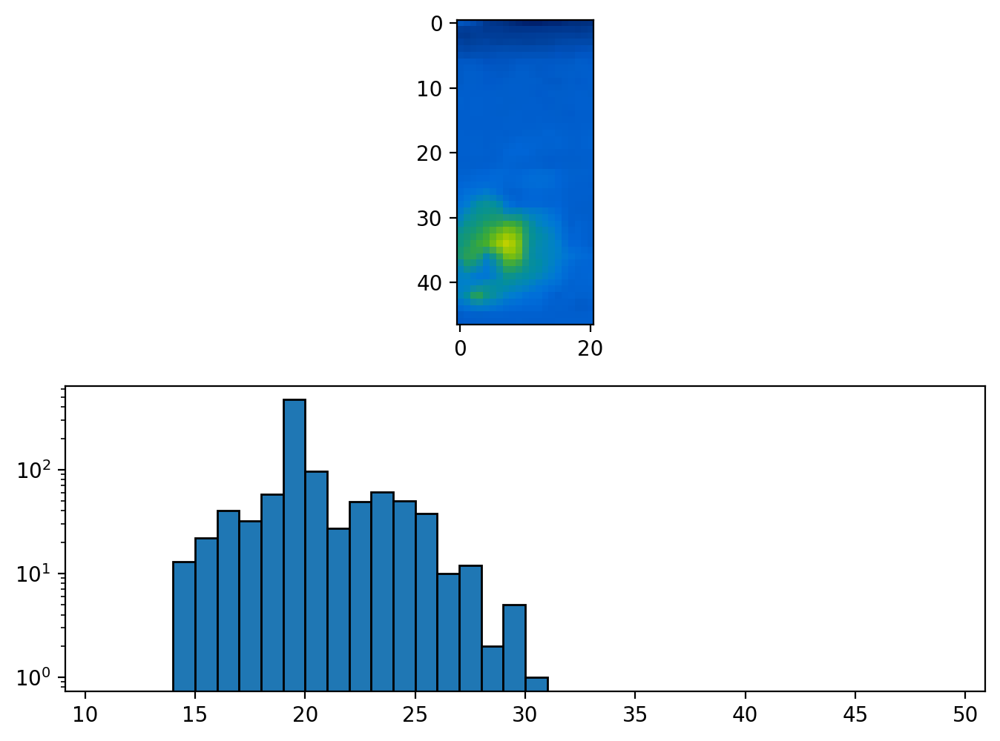

max_temperature: 30
weights: [  0   0   0  13  22  40  32  58 471  96  27  49  61  50  38  10  12   2
   5   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0]
max_temperature weight: 1


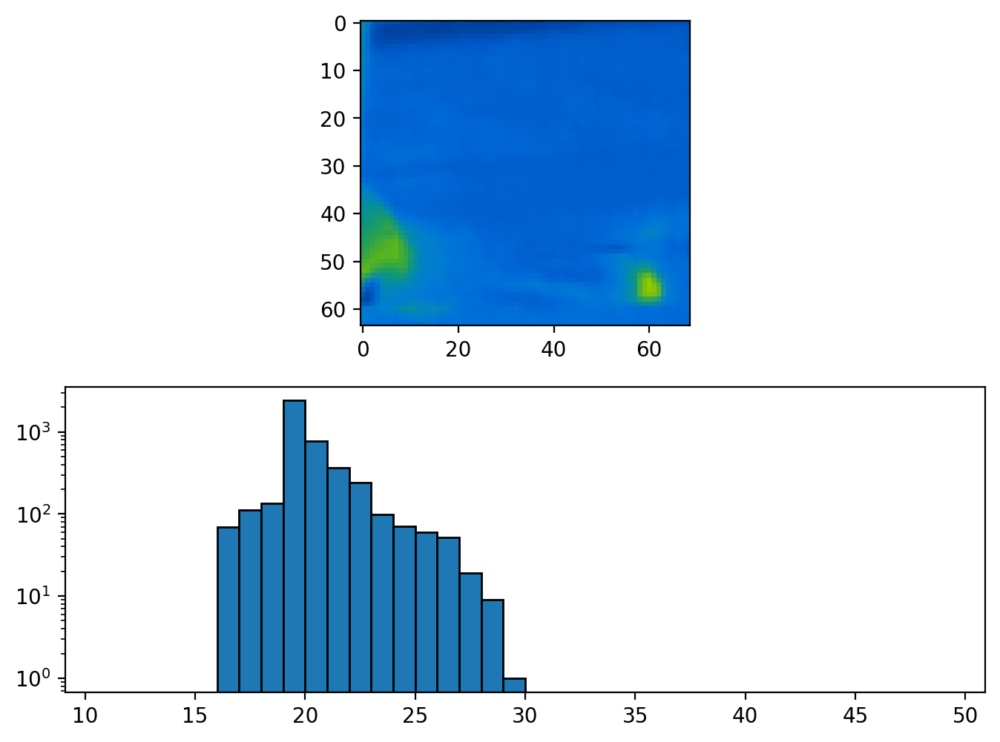

max_temperature: 29
weights: [   0    0    0    0    0   70  111  135 2408  770  369  242   99   71
   60   52   19    9    1    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1


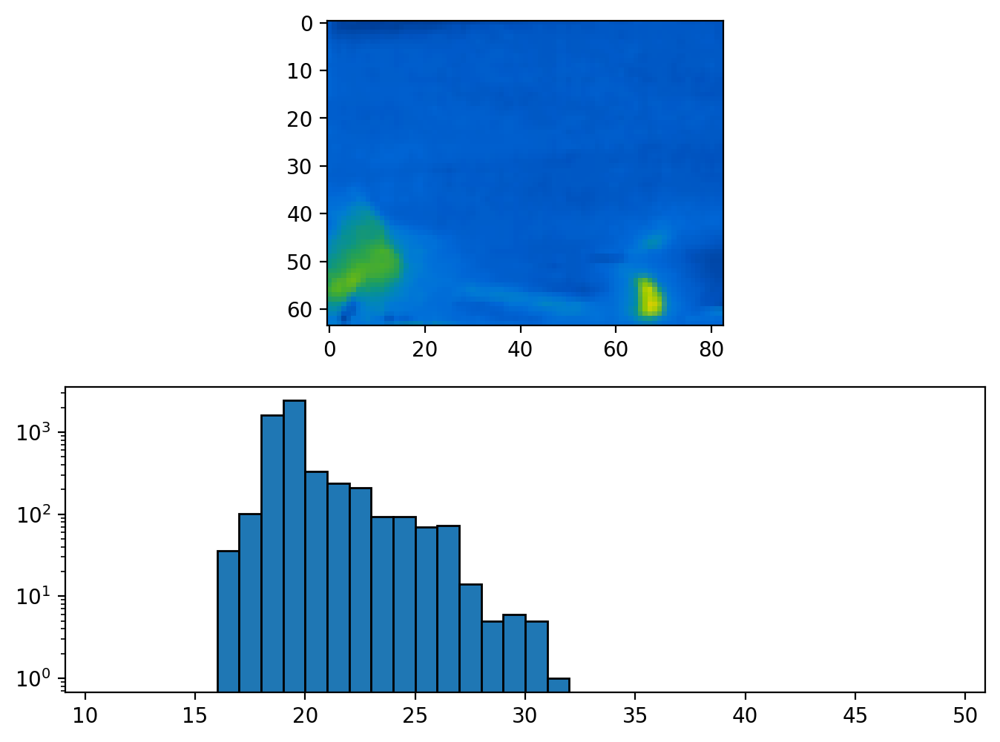

max_temperature: 31
weights: [   0    0    0    0    0   36  101 1615 2420  330  237  211   94   94
   70   73   14    5    6    5    1    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
max_temperature weight: 1


IsADirectoryError: [Errno 21] Is a directory: '/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/.ipynb_checkpoints'

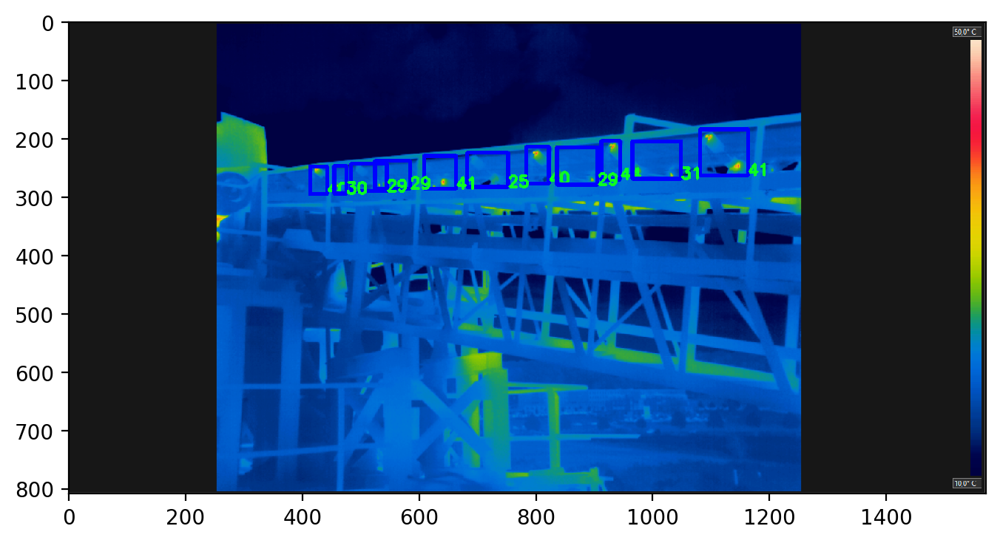

In [8]:
%matplotlib inline
xml_list = os.listdir('/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/')
for xml_file in xml_list:
    root = ET.parse('/home/ubuntu/gfav/data/phase1/IR_data/labeled_xmls/' + xml_file).getroot()
    ir_image = cv2.imread('/home/ubuntu/gfav/data/phase1/IR_data/IR_frames/' + xml_file[:-3] + 'png')
    label_image = ir_image.copy()
    some_objects = root.findall('object')
    for bbox in some_objects:
        xmin = int(bbox[4][0].text)
        ymin = int(bbox[4][1].text)
        xmax = int(bbox[4][2].text)
        ymax = int(bbox[4][3].text)
        image_crop = ir_image[ymin:ymax, xmin:xmax, :].copy()
        cv2.rectangle(label_image, (xmin, ymin), (xmax, ymax),(255,0,0),5)
        temperature_array = temperature_distribution(image_crop, resized_scale[:, 5, :])
        max_temperature = np.max(temperature_array)
        (weights, bin_values) = np.histogram(temperature_array, bins=range(11,50))
        cv2.putText(label_image, str(max_temperature), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 4)
        figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
        plt.subplot(2,1,1)
        plt.imshow(cv2.cvtColor(image_crop, cv2.COLOR_BGR2RGB))
        plt.subplot(2,1,2)
        plt.hist(temperature_array.flatten(), bins=bin_values, edgecolor='black', log=True)
        plt.show()
        print('max_temperature:', max_temperature)
        print('weights:', weights)
        print('max_temperature weight:', weights[max_temperature - 11])
#         break
    figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
    plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
    plt.show
#     break